# Mellona NAR 2020

### initialize definitions

In [1]:
alutil::register.source(here::here("code/init.R"))
rl <- alutil::rl
theme_set(tgppt::theme_arial(7))

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.0 ──

✔ ggplot2 3.3.5     ✔ purrr   0.3.4
✔ tibble  3.1.3     ✔ dplyr   1.0.7
✔ tidyr   1.1.3     ✔ stringr 1.4.0
✔ readr   1.4.0     ✔ forcats 0.5.1

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()


Attaching package: ‘tgppt’


The following object is masked from ‘package:alutil’:

    vertical_labs



Attaching package: ‘glue’


The following object is masked from ‘package:dplyr’:

    collapse


here() starts at /net/mraid14/export/tgdata/users/aviezerl/proj/ebdnmt

Using cached dataframe from '/net/mraid14/export/tgdata/users/aviezerl/proj/ebdnmt/output/track_stats.csv'



In [2]:
md_baubec <- tibble::tribble(
    ~name, ~track,
    "active_3a", "Mellona_NAR_2020.HA36_TKO_DNMT3A2_r2",
    "active_3b", "Mellona_NAR_2020.HA36_TKO_DNMT3B1_r2"
)
md_baubec

name,track
<chr>,<chr>
active_3a,Mellona_NAR_2020.HA36_TKO_DNMT3A2_r2
active_3b,Mellona_NAR_2020.HA36_TKO_DNMT3B1_r2


In [3]:
baubec_meth_all <- misha.ext::gextract_meth(tracks = md_baubec$track, names =  md_baubec$name, extract_meth_calls = TRUE) %cache_df% here("output/baubec_meth_all.tsv") %>% as_tibble()

Using cached dataframe from '/net/mraid14/export/tgdata/users/aviezerl/proj/ebdnmt/output/baubec_meth_all.tsv'



In [4]:
baubec_meth_plus <- misha.ext::gextract_meth(tracks = paste0(md_baubec$track, "_plus"), names =  md_baubec$name, extract_meth_calls = TRUE) %cache_df% here("output/baubec_meth_plus.tsv") %>% as_tibble()
baubec_meth_minus <- misha.ext::gextract_meth(tracks = paste0(md_baubec$track, "_minus"), names =  md_baubec$name, extract_meth_calls = TRUE) %cache_df% here("output/baubec_meth_minus.tsv") %>% as_tibble()

Using cached dataframe from '/net/mraid14/export/tgdata/users/aviezerl/proj/ebdnmt/output/baubec_meth_plus.tsv'

Using cached dataframe from '/net/mraid14/export/tgdata/users/aviezerl/proj/ebdnmt/output/baubec_meth_minus.tsv'



In [5]:
baubec_meth_all %>% filter(active_3a.cov > 0 | active_3b.cov > 0) %>% nrow()
baubec_meth_plus %>% filter(active_3a.cov > 0 | active_3b.cov > 0) %>% nrow()
baubec_meth_minus %>% filter(active_3a.cov > 0 | active_3b.cov > 0) %>% nrow()

[1] 16082106

[1] 12036497

[1] 12028654

In [6]:
summary(baubec_meth_all$active_3a.cov[baubec_meth_all$active_3a.cov > 0])
scales::comma(sum(baubec_meth_all$active_3a.cov > 0))

summary(baubec_meth_plus$active_3a.cov[baubec_meth_plus$active_3a.cov > 0])
scales::comma(sum(baubec_meth_plus$active_3a.cov > 0))

summary(baubec_meth_minus$active_3a.cov[baubec_meth_minus$active_3a.cov > 0])
scales::comma(sum(baubec_meth_minus$active_3a.cov > 0))

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   10.0    11.0    14.0    16.5    18.0  1972.0 

[1] "2,298,609"

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  10.00   11.00   14.00   16.36   18.00 1947.00 

[1] "1,151,583"

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  10.00   11.00   14.00   16.58   18.00 1904.00 

[1] "1,152,232"

In [7]:
summary(baubec_meth_all$active_3b.cov[baubec_meth_all$active_3b.cov > 0])
scales::comma(sum(baubec_meth_all$active_3b.cov > 0))

summary(baubec_meth_plus$active_3b.cov[baubec_meth_plus$active_3b.cov > 0])
scales::comma(sum(baubec_meth_plus$active_3b.cov > 0))

summary(baubec_meth_minus$active_3b.cov[baubec_meth_minus$active_3b.cov > 0])
scales::comma(sum(baubec_meth_minus$active_3b.cov > 0))

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   2.000   4.000   4.291   6.000 190.000 

[1] "15,928,534"

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   1.000   2.000   2.861   4.000  99.000 

[1] "11,944,096"

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   1.000   2.000   2.864   4.000 101.000 

[1] "11,936,048"

In [8]:
baubec_meth_cov <- baubec_meth_all %>% filter(active_3a.cov >= 10, active_3b.cov >= 10) 
nrow(baubec_meth_cov)

[1] 306664

In [9]:
baubec_meth_plus_cov <- baubec_meth_plus %>% filter(active_3a.cov >= 10, active_3b.cov >= 10) 
nrow(baubec_meth_plus_cov)

[1] 93967

In [10]:
baubec_meth_minus_cov <- baubec_meth_minus %>% filter(active_3a.cov >= 10, active_3b.cov >= 10) 
nrow(baubec_meth_minus_cov)

[1] 95747

In [11]:
esc_wgbs <- misha.ext::gextract_meth("schuebler.wgbs.esc.sum", intervals=gintervals.all(), names="esc") %>% 
    filter(esc.cov >= 7) %>% 
    select(-intervalID) %cache_df% 
    here("data/schuebler_esc_wgbs.tsv") %>% 
    as_tibble()

Using cached dataframe from '/net/mraid14/export/tgdata/users/aviezerl/proj/ebdnmt/data/schuebler_esc_wgbs.tsv'



In [12]:
filter_low_esc_meth <- function(df, esc_wgbs){
    df %>% inner_join(esc_wgbs %>% select(chrom, start, end, esc) %>% filter(esc >= 0.05))
}

## Compare with EB data

In [13]:
eb_mat <- fread(here("output/ebd_day1_to_day4_cpg_meth_mat.tsv")) %>% as_tibble()

In [14]:
eb_mat %>% inner_join(baubec_meth_cov) %>% nrow()

Joining, by = c("chrom", "start", "end")



[1] 3979

Joining, by = c("chrom", "start", "end")

Joining, by = c("chrom", "start", "end")



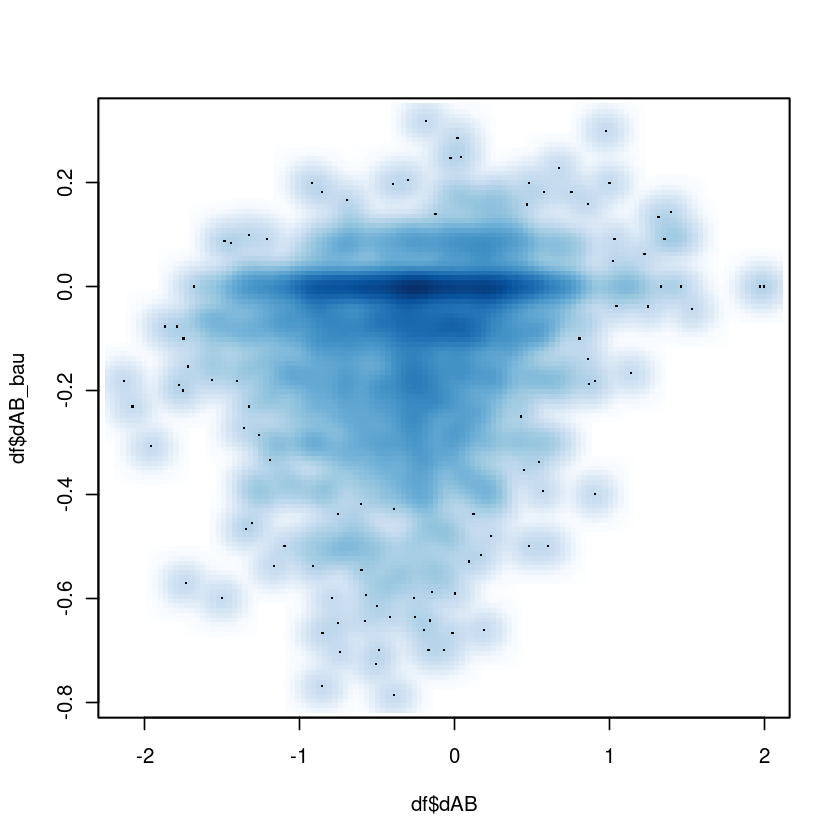

In [15]:
m_bau <- baubec_meth_cov %>% 
#     filter(pmean(active_3b, active_3a) >= 0.05) %>% 
    filter_low_esc_meth(esc_wgbs) %>% 
    mutate(dAB_bau = active_3b - active_3a)
df <- eb_mat %>% inner_join(m_bau)
smoothScatter(df$dAB, df$dAB_bau)

Joining, by = c("chrom", "start", "end")



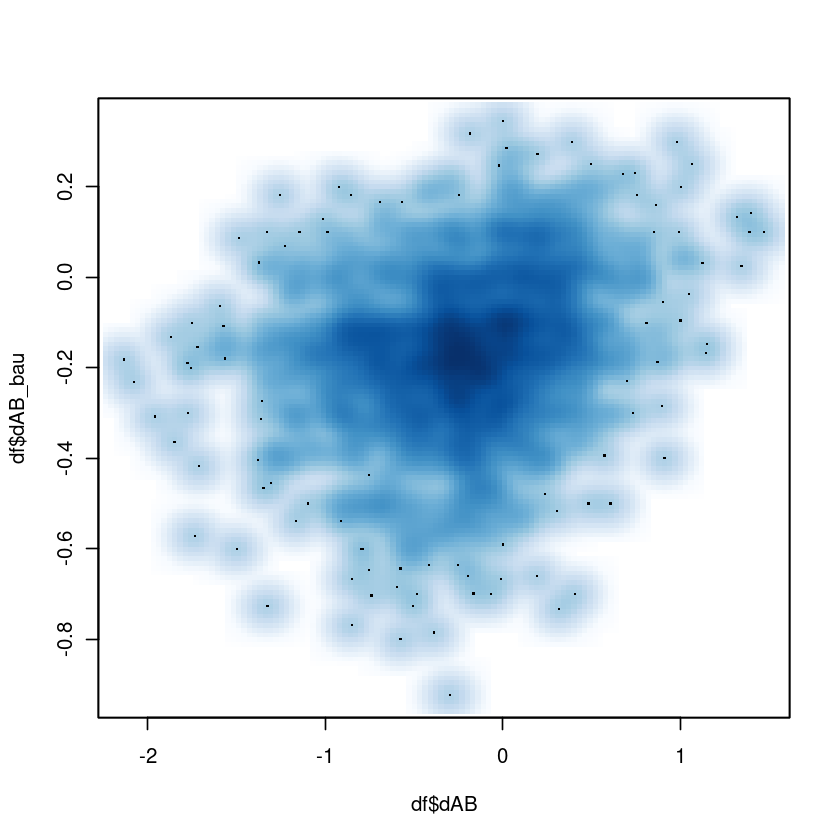

In [16]:
m_bau <- baubec_meth_cov %>% 
    filter(pmean(active_3b, active_3a) >= 0.05) %>%     
    mutate(dAB_bau = active_3b - active_3a)
df <- eb_mat %>% inner_join(m_bau)
smoothScatter(df$dAB, df$dAB_bau)

Joining, by = c("chrom", "start", "end")

Joining, by = c("chrom", "start", "end")



[1] 2619   18

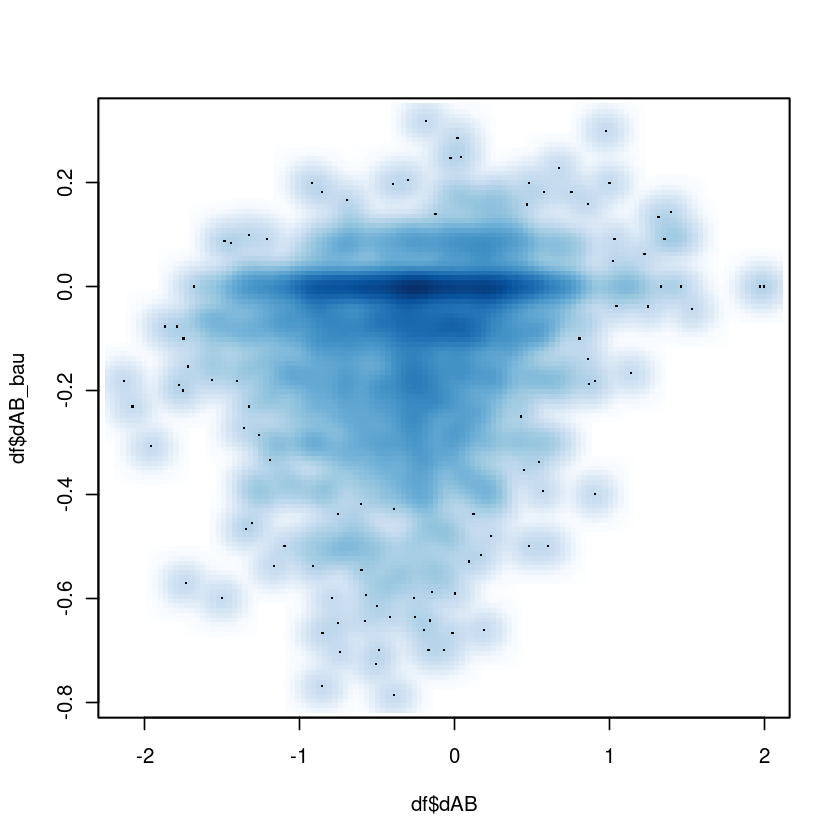

In [17]:
options(repr.plot.width = 7, repr.plot.height=7)
m_bau <- baubec_meth_cov %>% 
    filter_low_esc_meth(esc_wgbs) %>% 
    mutate(dAB_bau = active_3b - active_3a)
df <- eb_mat %>% inner_join(m_bau)
smoothScatter(df$dAB, df$dAB_bau)
dim(df)

In [18]:
cpg_meth <- calc_eb_day0_to_day4_cpg_meth(min_cov = 10, max_na  = 5)

Using cached dataframe from '/net/mraid14/export/tgdata/users/aviezerl/proj/ebdnmt/output/eb_day0_to_day4_cpg_meth.tsv'



In [19]:
df <- cpg_meth %>% inner_join(baubec_meth_cov)

Joining, by = c("chrom", "start", "end")



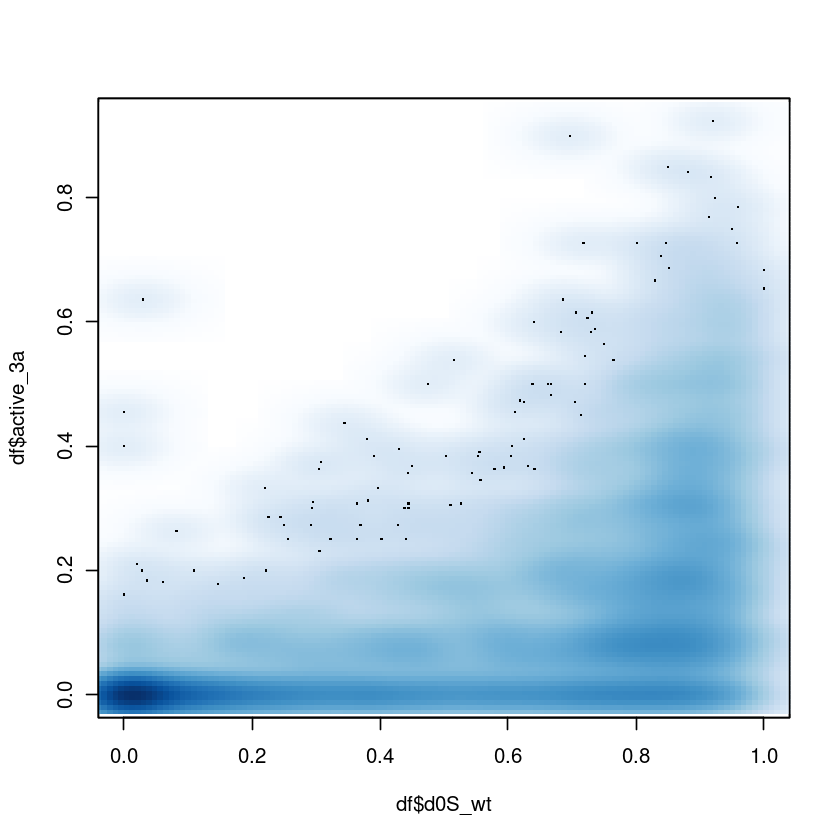

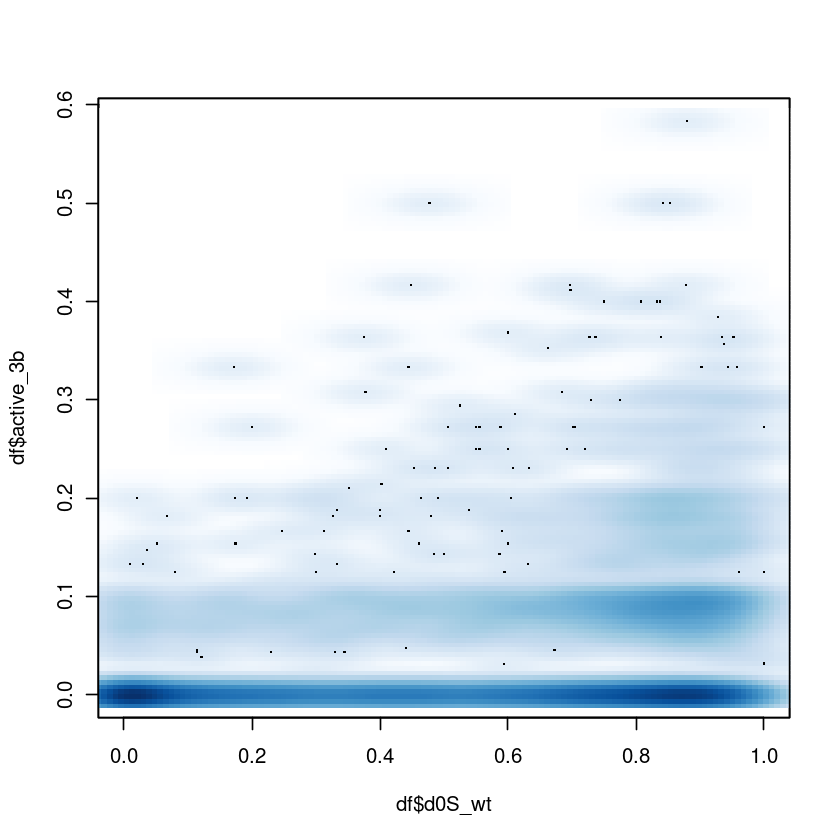

In [20]:
options(repr.plot.width = 7, repr.plot.height = 7)
smoothScatter(df$d0S_wt, df$active_3a)
smoothScatter(df$d0S_wt, df$active_3b)

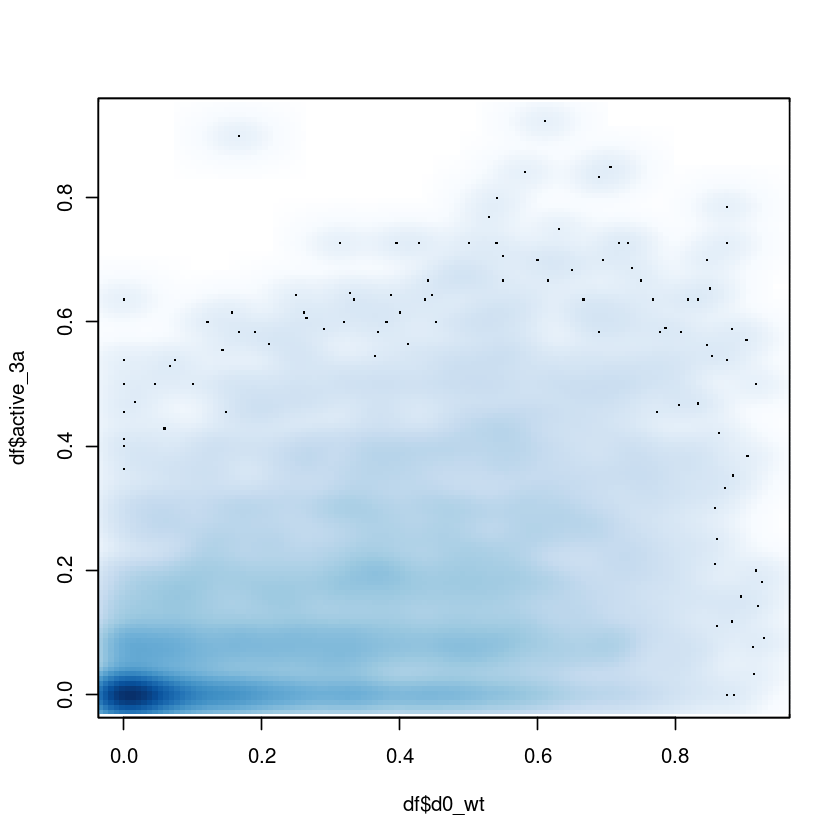

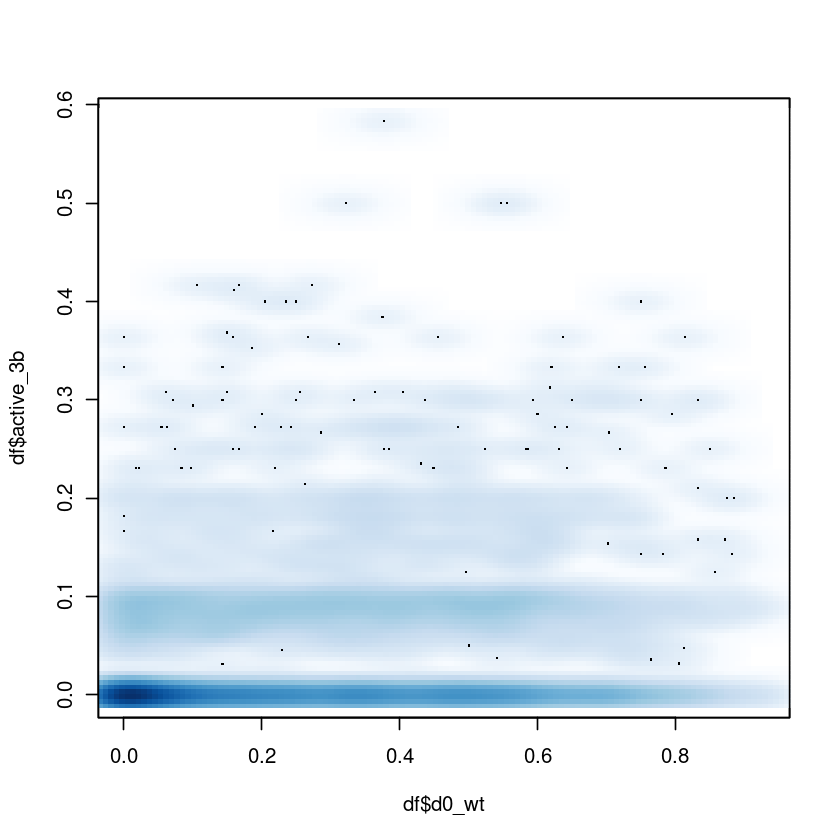

In [21]:
options(repr.plot.width = 7, repr.plot.height = 7)
smoothScatter(df$d0_wt, df$active_3a)
smoothScatter(df$d0_wt, df$active_3b)

Joining, by = c("chrom", "start", "end")

Warning message:
“Removed 1560 rows containing non-finite values (stat_boxplot).”


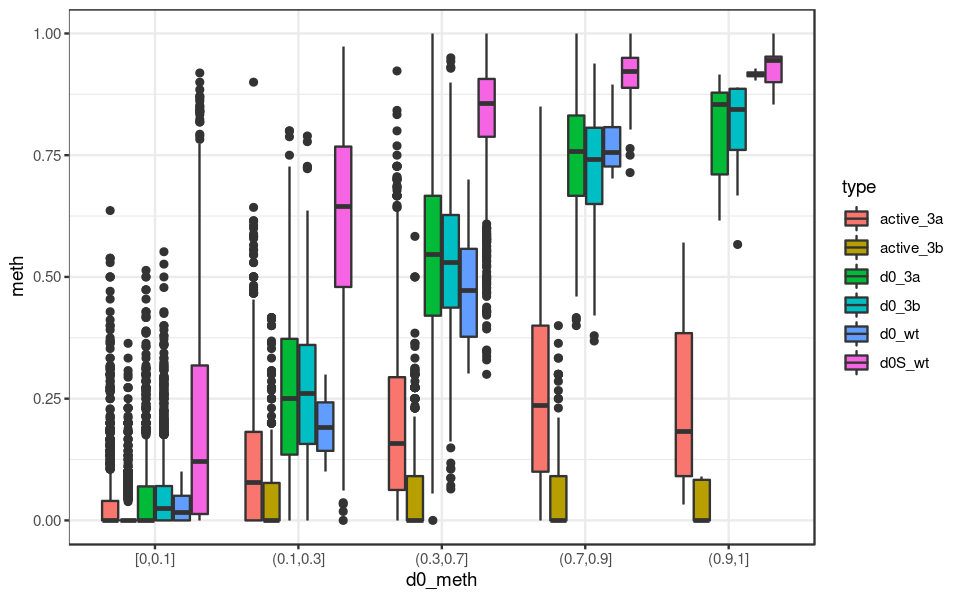

In [22]:
options(repr.plot.width = 8, repr.plot.height = 5)
baubec_meth_cov %>% 
    inner_join(cpg_meth) %>% 
    mutate(d0_meth = cut(d0_wt, c(0,0.1,0.3,0.7,0.9,1), include.lowest=TRUE)) %>% 
    filter(!is.na(d0_meth)) %>% 
    pivot_longer(c("active_3a", "active_3b", "d0S_wt", "d0_wt", "d0_3a", "d0_3b"), names_to="type", values_to="meth") %>% 
    ggplot(aes(x=d0_meth, y=meth, fill=type)) + 
        geom_boxplot() + 
        theme_bw()

## Model ES

In [23]:
m_bau_plus <- baubec_meth_plus_cov %>% 
    filter_low_esc_meth(esc_wgbs)
m_bau_minus <- baubec_meth_minus_cov %>% 
    filter_low_esc_meth(esc_wgbs) 

scales::comma(nrow(m_bau_plus))
scales::comma(nrow(m_bau_minus))

Joining, by = c("chrom", "start", "end")

Joining, by = c("chrom", "start", "end")



[1] "48,354"

[1] "49,215"

In [24]:
intervs_all_plus <- m_bau_plus %>% select(chrom, start, end)
intervs_all_minus <- m_bau_minus %>% select(chrom, start, end)

In [25]:
seq_df_plus <- get_seq_df(intervs_all_plus, flank_bp = 5)
seq_df_minus <- get_seq_df(intervs_all_minus, strand = -1, flank_bp = 5)

In [26]:
seq_df_wide_plus <- seq_df_to_wide(seq_df_plus, flank_bp = 5)
seq_df_wide_minus <- seq_df_to_wide(seq_df_minus, flank_bp = 5)

In [27]:
head(m_bau_plus)

chrom,start,end,active_3a,active_3b,active_3a.cov,active_3b.cov,active_3a.meth,active_3b.meth,intervalID,esc
<chr>,<int>,<int>,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<int>,<dbl>
chr1,3322345,3322346,0.0000000,0.0,13,10,0,0,1,0.5714286
chr1,3574384,3574385,0.1764706,0.1,17,10,3,1,1,0.9000000
chr1,3574389,3574390,0.2352941,0.1,17,10,4,1,1,0.8333333
chr1,3574421,3574422,0.1904762,0.0,21,10,4,0,1,0.9285714
chr1,3698778,3698779,0.0000000,0.0,15,11,0,0,1,1.0000000
chr1,3708906,3708907,0.0000000,0.0,29,11,0,0,1,0.8333333


In [28]:
model_ab_bau_plus_A <- gen_seq_model(seq_df_wide_plus, m_bau_plus, active_3a) %fcache_rds% here("output/baubec_plus_a_dinuc_model_5bp.rds")
model_ab_bau_plus_B <- gen_seq_model(seq_df_wide_plus, m_bau_plus, active_3b) %fcache_rds% here("output/baubec_plus_b_dinuc_model_5bp.rds")

model_ab_bau_minus_A <- gen_seq_model(seq_df_wide_minus, m_bau_minus, active_3a) %fcache_rds% here("output/baubec_plus_a_dinuc_model_5bp.rds")
model_ab_bau_minus_B <- gen_seq_model(seq_df_wide_minus, m_bau_minus, active_3b) %fcache_rds% here("output/baubec_plus_b_dinuc_model_5bp.rds")

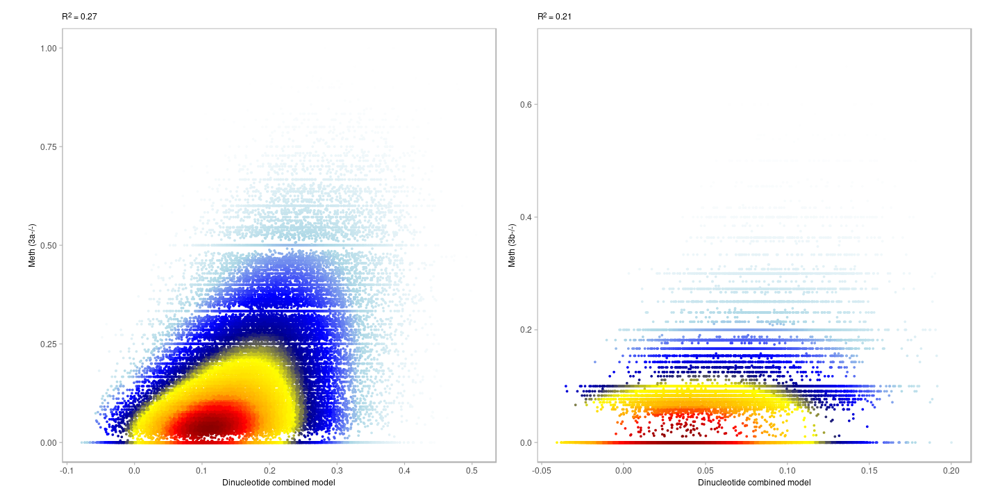

In [29]:
options(repr.plot.width = 12, repr.plot.height = 6)
bandwidth <- 0.08
point_size <- 0.001
p_a <- tibble(pred = model_ab_bau_plus_A$pred, y = model_ab_bau_plus_A$y) %>% 
    mutate(col = densCols(., bandwidth=0.06,colramp=colorRampPalette(c("white","lightblue", "blue", "darkblue", "yellow", "gold","orange","red", "darkred" )))) %>% 
    ggplot(aes(x=pred, y=y, col=col)) + 
        geom_point(shape=19, size=point_size) + 
        scale_color_identity() + 
#         coord_cartesian(xlim = c(-1.1, 0.6), ylim = c(-1.8, 1.2)) +                 
        xlab("Dinucleotide combined model") + 
        ylab("Meth (3a-/-)") +         
        theme(aspect.ratio=1, panel.grid.major=element_blank(), panel.grid.minor=element_blank()) + 
        labs(subtitle = glue("R^2 = {cor}", cor = round(cor(model_ab_bau_plus_A$pred, model_ab_bau_plus_A$y)^2, digits=2))) + 
        theme(plot.subtitle = ggtext::element_markdown())

p_b <- tibble(pred = model_ab_bau_plus_B$pred, y = model_ab_bau_plus_B$y) %>% 
    mutate(col = densCols(., bandwidth=0.06,colramp=colorRampPalette(c("white","lightblue", "blue", "darkblue", "yellow", "gold","orange","red", "darkred" )))) %>% 
    ggplot(aes(x=pred, y=y, col=col)) + 
        geom_point(shape=19, size=point_size) + 
        scale_color_identity() + 
#         coord_cartesian(xlim = c(-1.1, 0.6), ylim = c(-1.8, 1.2)) +                 
        xlab("Dinucleotide combined model") + 
        ylab("Meth (3b-/-)") +         
        theme(aspect.ratio=1, panel.grid.major=element_blank(), panel.grid.minor=element_blank()) + 
        labs(subtitle = glue("R^2 = {cor}", cor = round(cor(model_ab_bau_plus_B$pred, model_ab_bau_plus_B$y)^2, digits=2))) + 
        theme(plot.subtitle = ggtext::element_markdown())

p_a + p_b

In [30]:
coef_df_A <- get_coef_df(model_ab_bau_plus_A)
coef_df_B <- get_coef_df(model_ab_bau_plus_B)

Loading required package: Matrix


Attaching package: ‘Matrix’


The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack


Loaded glmnet 4.1



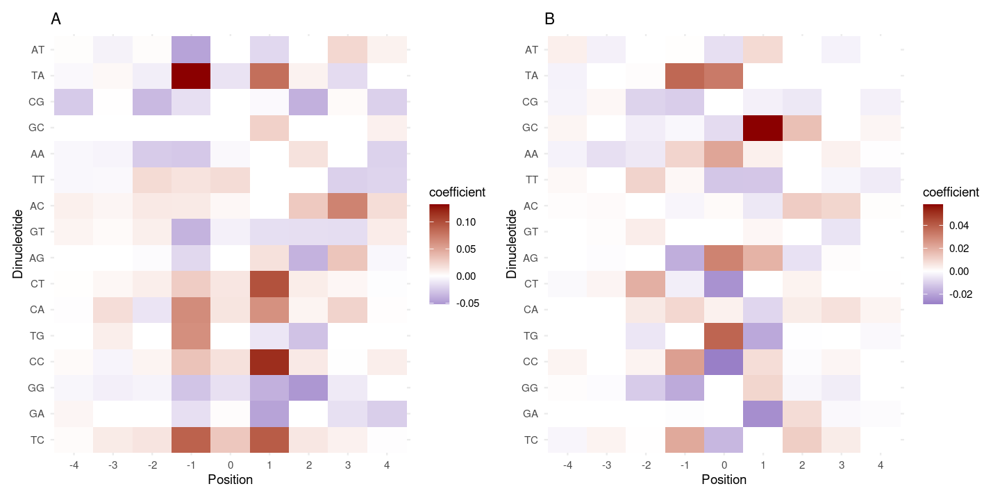

In [31]:
options(repr.plot.width = 12, repr.plot.height = 6)
p_a <- coef_df_A %>% 
    ggplot(aes(x=pos, y=dinuc, fill=coefficient)) + 
        geom_tile() + 
#         scale_fill_viridis_c(option="B", na.value = "white") + 
        scale_fill_gradient2(low = "darkblue", high = "darkred", mid = "white", midpoint = 0, na.value="white") + 
        theme_minimal() + 
        ylab("Dinucleotide") + 
        xlab("Position") + 
        ggtitle("A")
p_b <- coef_df_B %>% 
    ggplot(aes(x=pos, y=dinuc, fill=coefficient)) + 
        geom_tile() + 
#         scale_fill_viridis_c(option="B", na.value = "white") + 
        scale_fill_gradient2(low = "darkblue", high = "darkred", mid = "white", midpoint = 0, na.value="white") + 
        theme_minimal() + 
        ylab("Dinucleotide") + 
        xlab("Position") + 
        ggtitle("B")
p_a + p_b

In [32]:
tgppt::plot_gg_ppt(p_a + guides(fill=FALSE) + theme_arial(7) + theme(panel.grid.major=element_blank(), panel.grid.minor=element_blank()), here("figures/model_mat_a_b.pptx"), rasterize_plot=TRUE, width = 5, height = 5, left = 1.3, top = 9.7, overwrite=TRUE)
tgppt::plot_gg_ppt(p_b + guides(fill=FALSE) + theme_arial(7) + theme(panel.grid.major=element_blank(), panel.grid.minor=element_blank()), here("figures/model_mat_a_b.pptx"), rasterize_plot=TRUE, width = 5, height = 5, left = 1.3, top = 4)

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


In [33]:
model_ab <- readr::read_rds(here("output/ab_dinuc_model_5bp.rds"))
model_a <- readr::read_rds(here("output/a_dinuc_model_5bp.rds"))
model_b <- readr::read_rds(here("output/b_dinuc_model_5bp.rds"))

In [34]:
all_cpgs <- gintervals.load("intervs.global.seq_CG")

In [35]:
# res_orig <- compute_intervals_ab_scores_parallel(all_cpgs, 5, model_a, model_b, model_ab) %cache_df% here("output/eb_model_cpgs_not_sym.tsv") %>% as_tibble()

In [36]:
# gtrack.create_sparse(track = "DNMT.a_score_plus", intervals = res_orig %>% select(chrom:end), values=res_orig$a_score_plus, description="")
# gtrack.create_sparse(track = "DNMT.a_score_minus", intervals = res_orig %>% select(chrom:end), values=res_orig$a_score_minus, description="")

# gtrack.create_sparse(track = "DNMT.b_score_plus", intervals = res_orig %>% select(chrom:end), values=res_orig$b_score_plus, description="")
# gtrack.create_sparse(track = "DNMT.b_score_minus", intervals = res_orig %>% select(chrom:end), values=res_orig$b_score_minus, description="")

In [37]:
intercept_A <- coef(model_ab_bau_plus_A$fit_cv, s = "lambda.min")[1, ]
intercept_B <- coef(model_ab_bau_plus_B$fit_cv, s = "lambda.min")[1, ]

In [38]:
coef_mat_A <- coef_df_to_matrix(coef_df_A %>% select(pos, dinuc, coefficient), model_ab, intercept=intercept_A) %cache_rds% here("output/coef_A_mat.rds")
coef_mat_B <- coef_df_to_matrix(coef_df_B %>% select(pos, dinuc, coefficient), model_ab, intercept=intercept_B) %cache_rds% here("output/coef_B_mat.rds")

Using cached rds from '/net/mraid14/export/tgdata/users/aviezerl/proj/ebdnmt/output/coef_A_mat.rds'

Using cached rds from '/net/mraid14/export/tgdata/users/aviezerl/proj/ebdnmt/output/coef_B_mat.rds'



Save the models to misha tracks:

In [39]:
res <- compute_interval_model_mat_score_parallel(all_cpgs, model_ab, coef_mat_A, coef_mat_A, coef_mat_B) %cache_df% here("output/baubec_model_vs_ours_not_sym.tsv") %>% as_tibble()

Using cached dataframe from '/net/mraid14/export/tgdata/users/aviezerl/proj/ebdnmt/output/baubec_model_vs_ours_not_sym.tsv'



In [40]:
# gtrack.create_sparse(track = "DNMT.baubec_a_score_plus", intervals = res %>% select(chrom:end), values=res$score_a_plus, description="")
# gtrack.create_sparse(track = "DNMT.baubec_a_score_minus", intervals = res %>% select(chrom:end), values=res$score_a_minus, description="")

# gtrack.create_sparse(track = "DNMT.baubec_b_score_plus", intervals = res %>% select(chrom:end), values=res$score_b_plus, description="")
# gtrack.create_sparse(track = "DNMT.baubec_b_score_minus", intervals = res %>% select(chrom:end), values=res$score_b_minus, description="")

# gtrack.create_sparse(track = "DNMT.ab_score_plus", intervals = res %>% select(chrom:end), values=res[[ncol(res) - 1]], description="")
# gtrack.create_sparse(track = "DNMT.ab_score_minus", intervals = res %>% select(chrom:end), values=res[[ncol(res)]], description="")

In [41]:
a_limits <- c(-0.1,0.5)
a_bins <- seq(-0.1, 0.5, length.out = 30)
b_limits <- c(-0.05,0.2)
b_bins <- seq(-0.05, 0.2, length.out = 30)

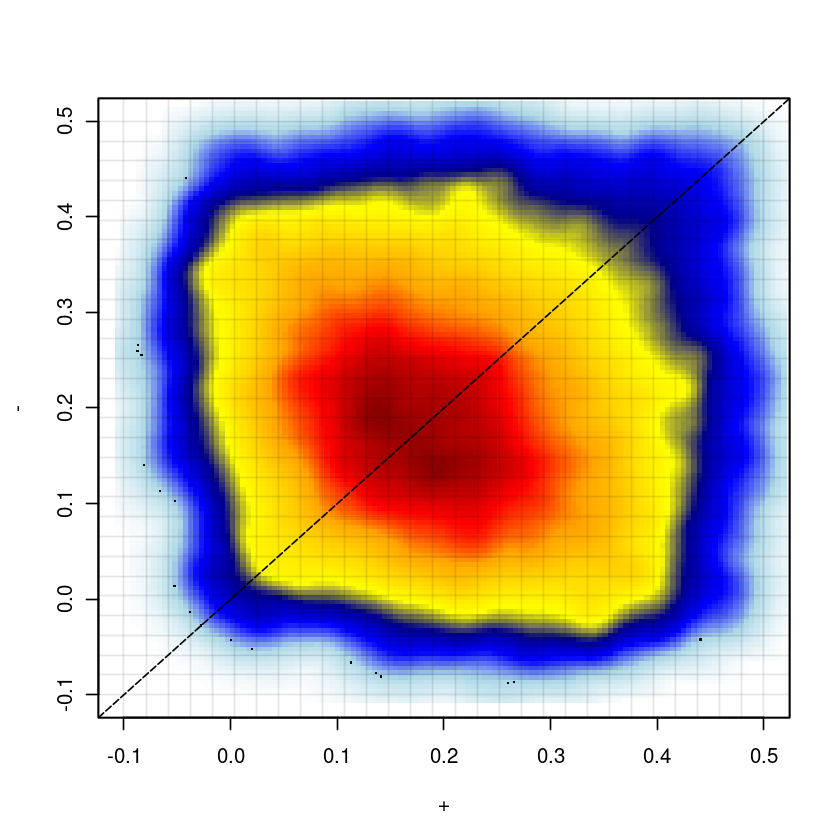

In [42]:
cols <- colorRampPalette(c("white","lightblue", "blue", "darkblue", "yellow", "gold","orange","red", "darkred"))
options(repr.plot.width = 7, repr.plot.height = 7)
smoothScatter(
    res$score_a_plus, 
    res$score_a_minus,     
    xlab="+", 
    ylab = "-",     
    xlim = a_limits, 
    ylim = a_limits, 
    colramp = cols)
abline(v = a_bins, h = a_bins, col=alpha(rgb(0,0,0), 0.1))
abline(a = 0, b = 1, lty=5)

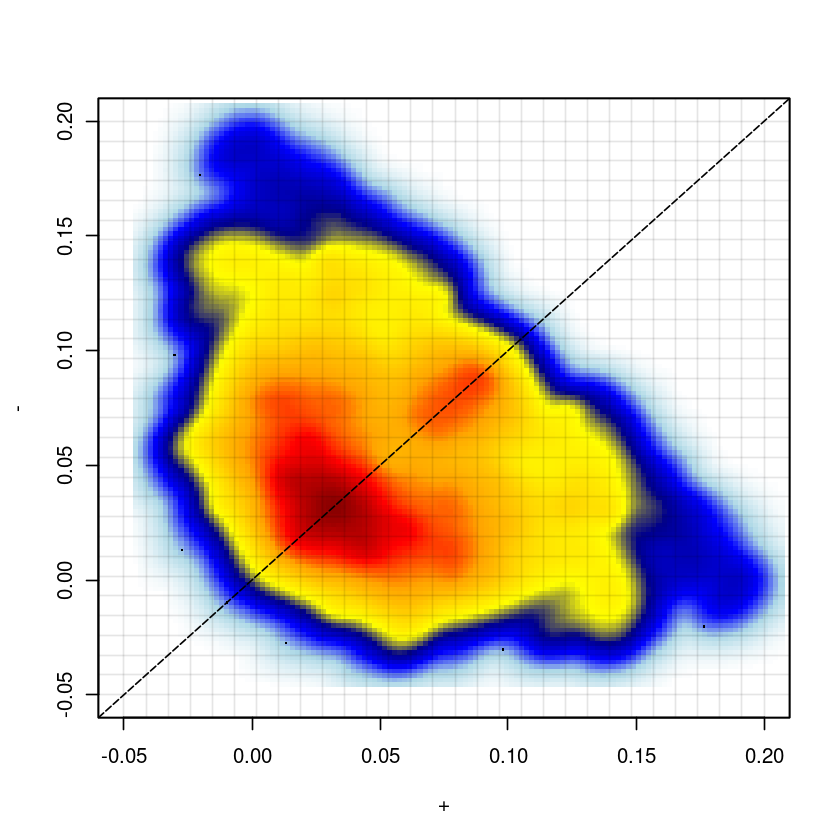

In [43]:
options(repr.plot.width = 7, repr.plot.height = 7)
smoothScatter(
    res$score_b_plus, 
    res$score_b_minus,     
    xlab="+", 
    ylab = "-",     
    xlim = b_limits, 
    ylim = b_limits,
    colramp = cols)
abline(v = b_bins, h = b_bins, col=alpha(rgb(0,0,0), 0.1))
abline(a = 0, b = 1, lty=5)

#### Extract day5 data

In [44]:
df <- {
    df_wt <- tracks_key  %>% filter(day == "d5") %>% filter(line == "wt")
    df_ko3a <- tracks_key  %>% filter(day == "d5") %>% filter(line == "ko3a")
    df_ko3b <- tracks_key  %>% filter(day == "d5") %>% filter(line == "ko3b")
    df_ab_bulk <- extract_meth_annot(c(
        df_wt$track_name, 
        df_ko3a$track_name, 
        df_ko3b$track_name), 
        names = c(df_wt$name, df_ko3a$name, df_ko3b$name), d_expand = 250, extract_meth_calls = TRUE)
    df <- df_ab_bulk %>% select(chrom, start, end, d_exon:gc_cont)
    df$wt.meth <- rowSums(df_ab_bulk[, paste0(df_wt$name, ".meth")], na.rm=TRUE)
    df$wt.cov <- rowSums(df_ab_bulk[, paste0(df_wt$name, ".cov")], na.rm=TRUE)

    df$ko3a.meth <- rowSums(df_ab_bulk[, paste0(df_ko3a$name, ".meth")], na.rm=TRUE)
    df$ko3a.cov <- rowSums(df_ab_bulk[, paste0(df_ko3a$name, ".cov")], na.rm=TRUE)

    df$ko3b.meth <- rowSums(df_ab_bulk[, paste0(df_ko3b$name, ".meth")], na.rm=TRUE)
    df$ko3b.cov <- rowSums(df_ab_bulk[, paste0(df_ko3b$name, ".cov")], na.rm=TRUE)

    df$ko3a <- df$ko3a.meth / df$ko3a.cov
    df$wt <- df$wt.meth / df$wt.cov
    df$ko3b <- df$ko3b.meth / df$ko3b.cov
    df    
} %cache_df% here("output/ab_diff_d5_bulk.tsv") %>% as_tibble()

Using cached dataframe from '/net/mraid14/export/tgdata/users/aviezerl/proj/ebdnmt/output/ab_diff_d5_bulk.tsv'



We take only regions that are well covered and add a `diff` column with `3a(-/-) - 3b(-/-)`

In [45]:
min_cov <- 50
df_diff <- {
        df_diff <- df %>% filter(ko3a.cov >= min_cov, ko3b.cov >= min_cov, wt.cov >= min_cov) %>% mutate(diff = ko3a - ko3b)
        df_diff <- df_diff %>% gintervals.neighbors1("intervs.global.tss") %>% select(chrom:diff, geneSymbol, dist)
        df_diff
} %cache_df%  here("output/ab_diff_d5_bulk_diff.tsv") %>% as_tibble()

Using cached dataframe from '/net/mraid14/export/tgdata/users/aviezerl/proj/ebdnmt/output/ab_diff_d5_bulk_diff.tsv'



In [46]:
head(df_diff)

chrom,start,end,d_exon,d_tss,tor,ab_score,a_score,b_score,cg_cont,⋯,ko3a.meth,ko3a.cov,ko3b.meth,ko3b.cov,ko3a,wt,ko3b,diff,geneSymbol,dist
<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>
chr1,3137716,3137717,58268,67996,-0.807965,-0.06375566,-0.0563031,-0.07885952,0.03636364,⋯,88,95,50,58,0.9263158,0.9333333,0.8620690,0.06424682,mKIAA1889,67995
chr1,3137749,3137750,58235,67963,-0.807965,0.35113215,0.1569280,-0.24173479,0.03636364,⋯,92,100,54,62,0.9200000,0.9375000,0.8709677,0.04903226,mKIAA1889,67962
chr1,3137829,3137830,58155,67883,-0.807965,-0.84893745,-0.5477075,0.04839351,0.03272727,⋯,97,105,55,61,0.9238095,0.9300000,0.9016393,0.02217018,mKIAA1889,67882
chr1,3137834,3137835,58150,67878,-0.807965,-0.15073226,-0.1115560,-0.05077374,0.03272727,⋯,97,105,55,61,0.9238095,0.9300000,0.9016393,0.02217018,mKIAA1889,67877
chr1,3137836,3137837,58148,67876,-0.807965,-0.32485920,-0.2463233,0.07614822,0.03272727,⋯,97,105,55,61,0.9238095,0.9300000,0.9016393,0.02217018,mKIAA1889,67875
chr1,3137840,3137841,58144,67872,-0.807965,-0.10740878,0.0732030,-0.11832523,0.03272727,⋯,97,105,55,61,0.9238095,0.9300000,0.9016393,0.02217018,mKIAA1889,67871


In [47]:
meth_df_meeb <- df_diff %>% left_join(res)

Joining, by = c("chrom", "start", "end")



In [48]:
meth_df_meeb <- meth_df_meeb %>% rename(mA = ko3a, mB = ko3b)

In [49]:
meth_df_meeb_f <- meth_df_meeb %>% 
    filter(abs(d_tss) >= 2000) %>% 
    filter_low_esc_meth(esc_wgbs) %>% 
    gintervals.neighbors1(get_all_enhancers()) %>% 
    filter(dist != 0) %>% 
    select(-(chrom1:end1))
dim(meth_df_meeb_f)

Joining, by = c("chrom", "start", "end")

Using cached dataframe from '/net/mraid14/export/tgdata/users/aviezerl/proj/ebdnmt/output/enh_intervs_germ_layers.csv'

Using cached dataframe from '/net/mraid14/export/tgdata/users/aviezerl/proj/ebdnmt/output/enh_intervs_encode.csv'



[1] 947724     35

In [50]:
meth_df_meeb_f %>% colnames()

[1] "chrom"             "start"             "end"              
 [4] "d_exon"            "d_tss"             "tor"              
 [7] "ab_score"          "a_score"           "b_score"          
[10] "cg_cont"           "gc_cont"           "wt.meth"          
[13] "wt.cov"            "ko3a.meth"         "ko3a.cov"         
[16] "ko3b.meth"         "ko3b.cov"          "mA"               
[19] "wt"                "mB"                "diff"             
[22] "geneSymbol"        "dist"              "score_plus"       
[25] "score_minus"       "score_a_plus"      "score_a_minus"    
[28] "score_b_plus"      "score_b_minus"     "score_model_plus" 
[31] "score_model_minus" "score_orig_plus"   "score_orig_minus" 
[34] "esc"               "dist1"

In [51]:
# meth_df_meeb <- fread(here("output/ebd_day1_to_day4_cpg_meth_mat.tsv")) %>% left_join(res)

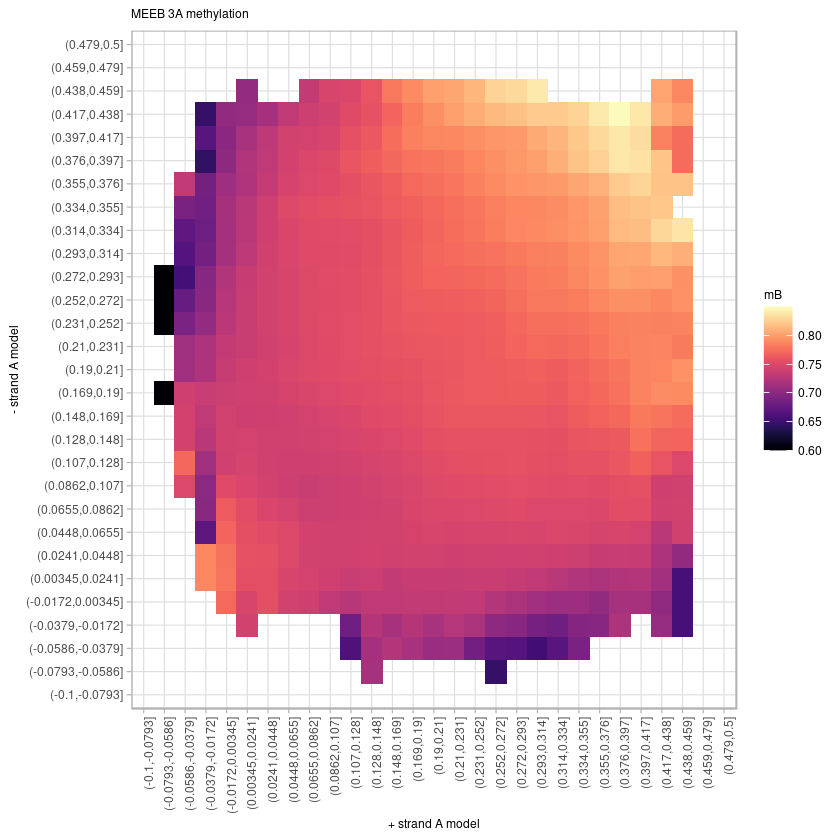

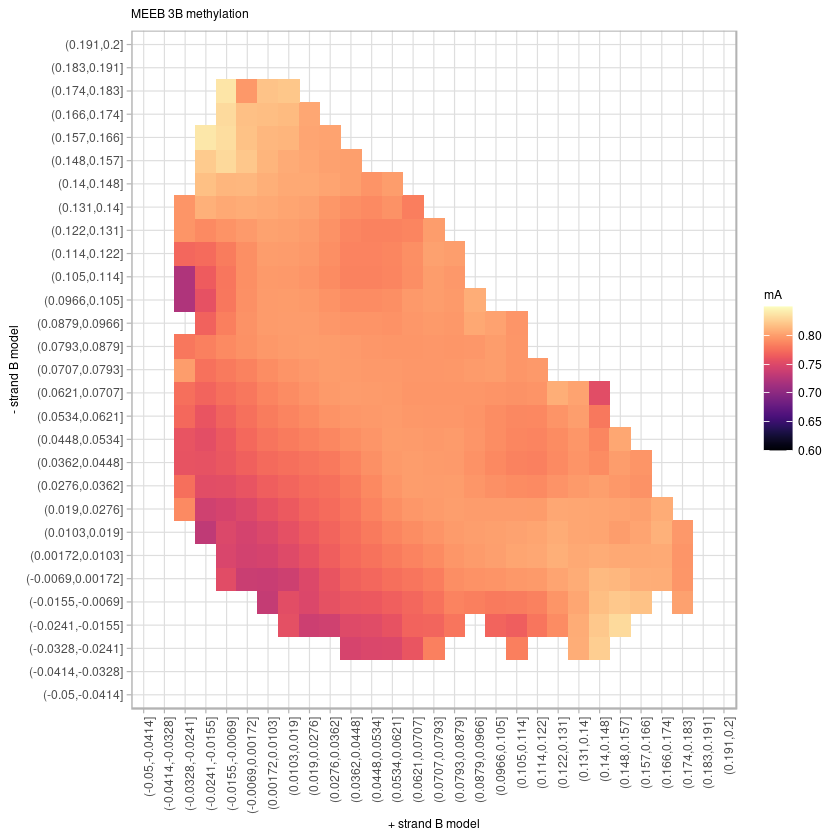

In [52]:
# colors <- c(rep("white", 3), viridis::viridis(10, option = "B")[6:10])
options(repr.plot.width = 7, repr.plot.height = 7)
colors <- viridis::viridis(30, option = "A")
df <- meth_df_meeb_f %>%
        mutate(score_plus = cut(score_a_plus, a_bins)) %>%
        mutate(score_minus = cut(score_a_minus, a_bins)) %>%
        group_by(score_plus, score_minus) %>%
        summarise(mB = mean(mB, na.rm=TRUE)) %>%         
        filter(!is.na(score_plus), !is.na(score_minus)) %>% 
        tidyr::complete(fill=list(mB = NA))

limits=c(0.6,0.85)

p_A <- df %>% 
    arrange(score_plus) %>%
    group_by(score_minus) %>%
    mutate(mB = zoo::rollapply(mB, FUN = function(x) mean(x, na.rm=TRUE), width=4, fill=NA)) %>%
    arrange(score_minus) %>%
    group_by(score_plus) %>%    
    mutate(mB = zoo::rollapply(mB, FUN = function(x) mean(x, na.rm=TRUE), width=4, fill=NA)) %>%
    na.omit() %>% 
    ggplot(aes(x=score_plus, y=score_minus, fill=mB)) + 
            geom_tile() + 
            scale_fill_gradientn(colors=colors, limits=limits) + 
            vertical_labs() + 
            scale_x_discrete(drop=FALSE) + 
            scale_y_discrete(drop=FALSE) + 
            xlab("+ strand A model") + 
            ylab("- strand A model") + 
            ggtitle("MEEB 3A methylation") + 
            theme(axis.ticks.x = element_blank(),
                  axis.text.x = element_blank(),
                  axis.ticks.y = element_blank(),
                  axis.text.y = element_blank())
                               
p_A

df <- meth_df_meeb_f %>%
        mutate(score_plus = cut(score_b_plus, b_bins)) %>%
        mutate(score_minus = cut(score_b_minus, b_bins)) %>%
        group_by(score_plus, score_minus) %>%
        summarise(mA = mean(mA, na.rm=TRUE)) %>%         
        filter(!is.na(score_plus), !is.na(score_minus)) %>% 
        tidyr::complete(fill=list(mA = NA))
                               
p_B <- df %>% 
    arrange(score_plus) %>%
    group_by(score_minus) %>%
    mutate(mA = zoo::rollapply(mA, FUN = function(x) mean(x, na.rm=TRUE), width=4, fill=NA)) %>%
    arrange(score_minus) %>%
    group_by(score_plus) %>%    
    mutate(mA = zoo::rollapply(mA, FUN = function(x) mean(x, na.rm=TRUE), width=4, fill=NA)) %>%
    na.omit() %>% 
    ggplot(aes(x=score_plus, y=score_minus, fill=mA)) + 
            geom_tile() + 
            scale_fill_gradientn(colors=colors, limits=limits) + 
            vertical_labs() + 
            scale_x_discrete(drop=FALSE) + 
            scale_y_discrete(drop=FALSE) + 
            xlab("+ strand B model") + 
            ylab("- strand B model") + 
            ggtitle("MEEB 3B methylation") + 
            theme(axis.ticks.x = element_blank(),
                  axis.text.x = element_blank(),
                  axis.ticks.y = element_blank(),
                  axis.text.y = element_blank())
p_B

In [224]:
tgppt::plot_gg_ppt(p_A + guides(fill=FALSE), here("figures/model_heatmap_a_b.pptx"), rasterize_plot=TRUE, width = 4, height = 4, left = 1.3, top = 9.7, overwrite=TRUE)
tgppt::plot_gg_ppt(p_B + guides(fill=FALSE), here("figures/model_heatmap_a_b.pptx"), rasterize_plot=TRUE, width = 4, height = 4, left = 1.3, top = 4)

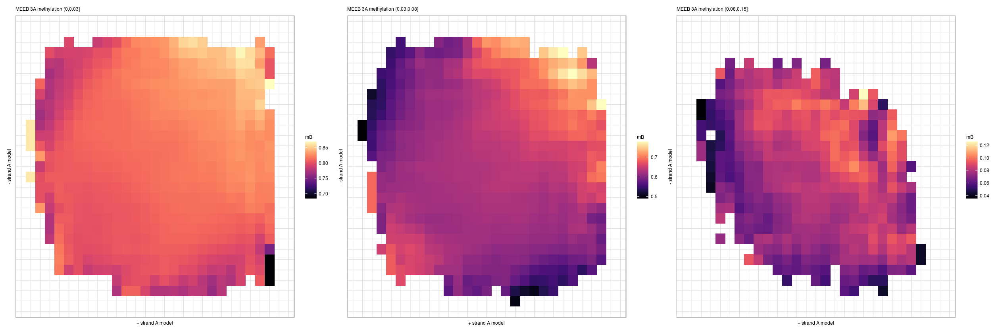

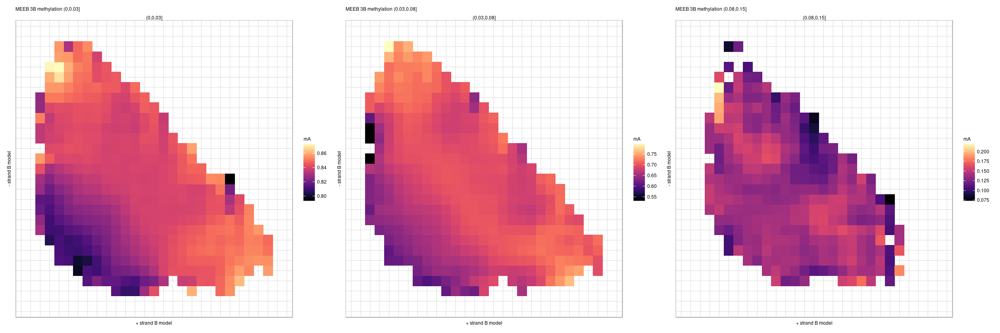

In [246]:
options(repr.plot.width = 21, repr.plot.height = 7)
colors <- viridis::viridis(30, option = "A")
df <- meth_df_meeb_f %>%
        mutate(score_plus = cut(score_a_plus, a_bins)) %>%
        mutate(score_minus = cut(score_a_minus, a_bins)) %>%
        mutate(cg_cont = cut(cg_cont, c(0,0.03,0.08,0.15))) %>%
        group_by(cg_cont, score_plus, score_minus) %>%
        summarise(mB = mean(mB, na.rm=TRUE)) %>%         
        filter(!is.na(score_plus), !is.na(score_minus)) %>% 
        tidyr::complete(fill=list(mB = NA))

# limits=c(0.6,0.85)
limits <- NULL

p_A <- df %>% 
    arrange(score_plus) %>%
    group_by(cg_cont, score_minus) %>%
    mutate(mB = zoo::rollapply(mB, FUN = function(x) mean(x, na.rm=TRUE), width=4, fill=NA)) %>%
    arrange(score_minus) %>%
    group_by(cg_cont, score_plus) %>%    
    mutate(mB = zoo::rollapply(mB, FUN = function(x) mean(x, na.rm=TRUE), width=4, fill=NA)) %>%
    na.omit() %>% 
    ungroup() %>% 
    plyr::dlply("cg_cont", function(x) x %>% 
    ggplot(aes(x=score_plus, y=score_minus, fill=mB)) + 
            geom_tile() + 
            scale_fill_gradientn(colors=colors, limits=limits) + 
            vertical_labs() + 
            scale_x_discrete(drop=FALSE) + 
            scale_y_discrete(drop=FALSE) + 
            xlab("+ strand A model") + 
            ylab("- strand A model") + 
            ggtitle(glue("MEEB 3A methylation {x$cg_cont[1]}")) +             
            theme(axis.ticks.x = element_blank(),
                  axis.text.x = element_blank(),
                  axis.ticks.y = element_blank(),
                  axis.text.y = element_blank()))
                               
p_A %>% wrap_plots(nrow=1)

df <- meth_df_meeb_f %>%
        mutate(score_plus = cut(score_b_plus, b_bins)) %>%
        mutate(score_minus = cut(score_b_minus, b_bins)) %>%
        mutate(cg_cont = cut(cg_cont, c(0,0.03,0.08,0.15))) %>%
        group_by(cg_cont, score_plus, score_minus) %>%        
        summarise(mA = mean(mA, na.rm=TRUE)) %>%         
        filter(!is.na(score_plus), !is.na(score_minus)) %>% 
        tidyr::complete(fill=list(mA = NA))
                               
p_B <- df %>% 
    arrange(score_plus) %>%
    group_by(cg_cont, score_minus) %>%
    mutate(mA = zoo::rollapply(mA, FUN = function(x) mean(x, na.rm=TRUE), width=4, fill=NA)) %>%
    arrange(score_minus) %>%
    group_by(cg_cont, score_plus) %>%    
    mutate(mA = zoo::rollapply(mA, FUN = function(x) mean(x, na.rm=TRUE), width=4, fill=NA)) %>%
    na.omit() %>% 
    plyr::dlply("cg_cont", function(x) x %>% 
    ggplot(aes(x=score_plus, y=score_minus, fill=mA)) + 
            geom_tile() + 
            scale_fill_gradientn(colors=colors, limits=limits) + 
            vertical_labs() + 
            scale_x_discrete(drop=FALSE) + 
            scale_y_discrete(drop=FALSE) + 
            xlab("+ strand B model") + 
            ylab("- strand B model") + 
            ggtitle(glue("MEEB 3B methylation {x$cg_cont[1]}")) +             
            facet_wrap(~cg_cont, scales="free") + 
            theme(axis.ticks.x = element_blank(),
                  axis.text.x = element_blank(),
                  axis.ticks.y = element_blank(),
                  axis.text.y = element_blank()))
p_B %>% wrap_plots(nrow=1)

In [270]:
meth_df_meeb_d4 <- calc_eb_day0_to_day4_cpg_meth(min_cov = 10, max_na  = 5) %>% 
    rename(mA = d4_3a, mB = d4_3b) %>% 
    inner_join(fread(here("output/ebd_day1_to_day4_cpg_meth_mat.tsv")) %>% select(chrom, start, end)) %>% 
    left_join(res)

Using cached dataframe from '/net/mraid14/export/tgdata/users/aviezerl/proj/ebdnmt/output/eb_day0_to_day4_cpg_meth.tsv'

Joining, by = c("chrom", "start", "end")

Joining, by = c("chrom", "start", "end")



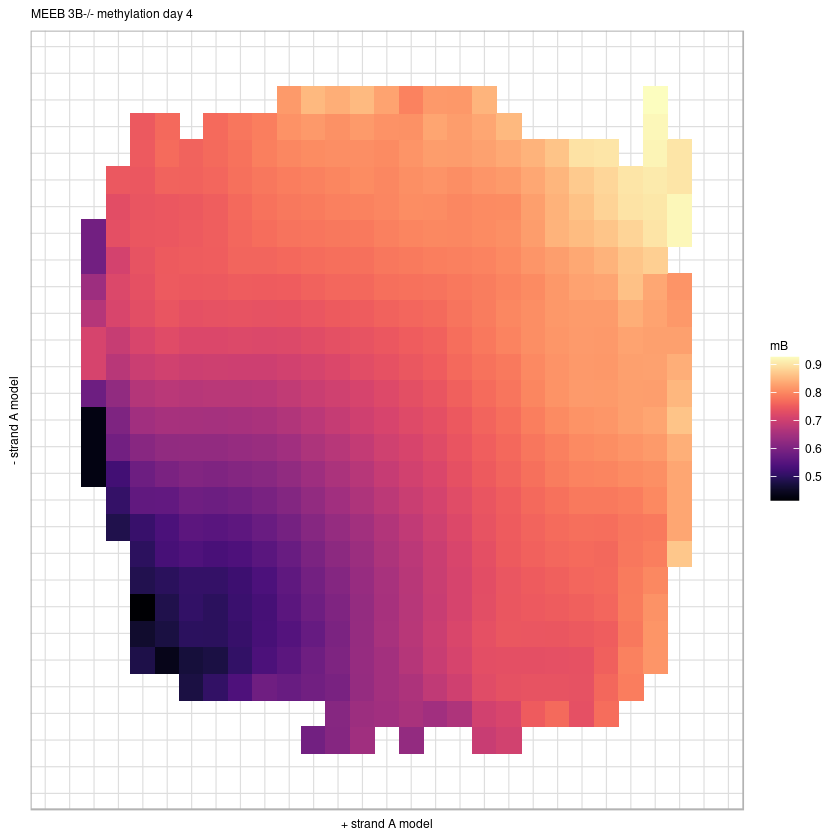

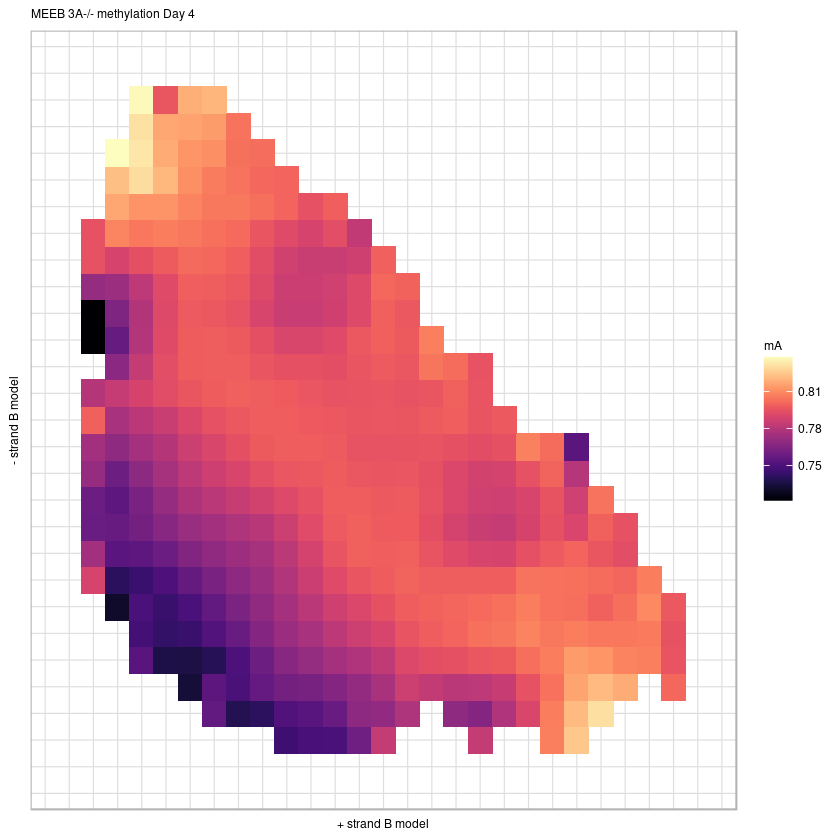

In [271]:
# colors <- c(rep("white", 3), viridis::viridis(10, option = "B")[6:10])
options(repr.plot.width = 7, repr.plot.height = 7)
colors <- viridis::viridis(30, option = "A")
df <- meth_df_meeb_d4 %>%
        mutate(score_plus = cut(score_a_plus, a_bins)) %>%
        mutate(score_minus = cut(score_a_minus, a_bins)) %>%
        group_by(score_plus, score_minus) %>%
        summarise(mB = mean(mB, na.rm=TRUE)) %>%         
        filter(!is.na(score_plus), !is.na(score_minus)) %>% 
        tidyr::complete(fill=list(mB = NA))

# limits=c(0.3,0.95)
limits <- NULL

p_A <- df %>% 
    arrange(score_plus) %>%
    group_by(score_minus) %>%
    mutate(mB = zoo::rollapply(mB, FUN = function(x) mean(x, na.rm=TRUE), width=4, fill=NA)) %>%
    arrange(score_minus) %>%
    group_by(score_plus) %>%    
    mutate(mB = zoo::rollapply(mB, FUN = function(x) mean(x, na.rm=TRUE), width=4, fill=NA)) %>%
    na.omit() %>% 
    ggplot(aes(x=score_plus, y=score_minus, fill=mB)) + 
            geom_tile() + 
            scale_fill_gradientn(colors=colors, limits=limits) + 
            vertical_labs() + 
            scale_x_discrete(drop=FALSE) + 
            scale_y_discrete(drop=FALSE) + 
            xlab("+ strand A model") + 
            ylab("- strand A model") + 
            ggtitle("MEEB 3B-/- methylation day 4") + 
            theme(axis.ticks.x = element_blank(),
                  axis.text.x = element_blank(),
                  axis.ticks.y = element_blank(),
                  axis.text.y = element_blank())
                               
p_A

df <- meth_df_meeb_f %>%
        mutate(score_plus = cut(score_b_plus, b_bins)) %>%
        mutate(score_minus = cut(score_b_minus, b_bins)) %>%
        group_by(score_plus, score_minus) %>%
        summarise(mA = mean(mA, na.rm=TRUE)) %>%         
        filter(!is.na(score_plus), !is.na(score_minus)) %>% 
        tidyr::complete(fill=list(mA = NA))
                               
p_B <- df %>% 
    arrange(score_plus) %>%
    group_by(score_minus) %>%
    mutate(mA = zoo::rollapply(mA, FUN = function(x) mean(x, na.rm=TRUE), width=4, fill=NA)) %>%
    arrange(score_minus) %>%
    group_by(score_plus) %>%    
    mutate(mA = zoo::rollapply(mA, FUN = function(x) mean(x, na.rm=TRUE), width=4, fill=NA)) %>%
    na.omit() %>% 
    ggplot(aes(x=score_plus, y=score_minus, fill=mA)) + 
            geom_tile() + 
            scale_fill_gradientn(colors=colors, limits=limits) + 
            vertical_labs() + 
            scale_x_discrete(drop=FALSE) + 
            scale_y_discrete(drop=FALSE) + 
            xlab("+ strand B model") + 
            ylab("- strand B model") + 
            ggtitle("MEEB 3A-/- methylation Day 4") + 
            theme(axis.ticks.x = element_blank(),
                  axis.text.x = element_blank(),
                  axis.ticks.y = element_blank(),
                  axis.text.y = element_blank())
p_B

In [268]:
tgppt::plot_gg_ppt(p_A + guides(fill=FALSE), here("figures/model_heatmap_a_b.pptx"), rasterize_plot=TRUE, width = 4, height = 4, left = 1.3, top = 9.7, overwrite=TRUE)
tgppt::plot_gg_ppt(p_B + guides(fill=FALSE), here("figures/model_heatmap_a_b.pptx"), rasterize_plot=TRUE, width = 4, height = 4, left = 1.3, top = 4)

#### Predict MEEB using strands

In [83]:
feats_mat_comb_df <- meth_df_meeb %>% 
    mutate(score_max_a = pmax(score_a_plus, score_a_minus)) %>% 
    mutate(score_max_b = pmax(score_b_plus, score_b_minus)) %>% 
    select(chrom, start, end, score_a_plus, score_a_minus, score_b_plus, score_b_minus, score_max_a, score_max_b, dAB) %>% 
    filter(!is.na(dAB))

feats_mat_comb <- feats_mat_comb_df %>% 
    select(-(chrom:end)) %>% 
    as.matrix()

feats_mat_comb %>% dim

[1] 80228     7

In [85]:
library(xgboost)
dtrain <- xgb.DMatrix(feats_mat_comb[, -7], label=feats_mat_comb[, 7])

xgb_params <- hypertune_xgb(seq_df_wide, m, dAB) %cache_rds% here("data/xgb_params.rds")

# params <- list(booster = "gbtree", objective = "reg:squarederror", eta=0.3, gamma=0, max_depth=6, min_child_weight=1, subsample=1, colsample_bytree=1)

xgbcv <- xgb.cv(params = xgb_params$params, data = dtrain, nrounds = xgb_params$nrounds, nfold = 10, prediction = TRUE)

xgbtrain <- xgb.train(params = xgb_params$params, data = dtrain, nrounds = xgb_params$nrounds)

feats_mat_comb_df <- feats_mat_comb_df %>% 
    mutate(pred = xgbcv$pred)


Using cached rds from '/net/mraid14/export/tgdata/users/aviezerl/proj/ebdnmt/data/xgb_params.rds'



[1]	train-rmse:0.914772+0.001363	test-rmse:0.914757+0.006666 
[2]	train-rmse:0.881940+0.001367	test-rmse:0.881999+0.006661 
[3]	train-rmse:0.851099+0.001458	test-rmse:0.851235+0.006954 
[4]	train-rmse:0.822137+0.002035	test-rmse:0.822296+0.006746 
[5]	train-rmse:0.795279+0.002150	test-rmse:0.795474+0.006983 
[6]	train-rmse:0.769690+0.002500	test-rmse:0.769917+0.006925 
[7]	train-rmse:0.745867+0.002406	test-rmse:0.746118+0.007016 
[8]	train-rmse:0.723543+0.002826	test-rmse:0.723838+0.007194 
[9]	train-rmse:0.703105+0.002971	test-rmse:0.703401+0.007366 
[10]	train-rmse:0.683739+0.003239	test-rmse:0.684102+0.007299 
[11]	train-rmse:0.665205+0.003703	test-rmse:0.665606+0.006833 
[12]	train-rmse:0.647831+0.003990	test-rmse:0.648266+0.007172 
[13]	train-rmse:0.631824+0.003407	test-rmse:0.632332+0.006993 
[14]	train-rmse:0.616917+0.004120	test-rmse:0.617466+0.007427 
[15]	train-rmse:0.603060+0.003707	test-rmse:0.603660+0.007160 
[16]	train-rmse:0.589852+0.003511	test-rmse:0.590476+0.006672 
[

Predict all CpGs: 

In [97]:
d_all <- xgb.DMatrix(res %>% 
    mutate(score_max_a = pmax(score_a_plus, score_a_minus)) %>% 
    mutate(score_max_b = pmax(score_b_plus, score_b_minus)) %>%     
    select(score_a_plus, score_a_minus, score_b_plus, score_b_minus, score_max_a, score_max_b) %>% 
    as.matrix())
res <- res %>%
        mutate(comb_score = predict(xgbtrain, d_all))        

In [98]:
# gtrack.rm("DNMT.ab_score_comb", force=TRUE)
# gtrack.create_sparse(track = "DNMT.ab_score_comb", intervals = res %>% select(chrom:end), values=res$comb_score, description="")

In [122]:
shap_contrib <- predict(xgbtrain, dtrain, predcontrib=TRUE, approxcontrib=TRUE) 
shap_contrib %>% head()

score_a_plus,score_a_minus,score_b_plus,score_b_minus,score_max_a,score_max_b,BIAS
0.03041575,0.003100819,0.13496330,-0.08231558,0.10399138,0.28385779,-0.2581031
0.03016657,-0.052068889,-0.08773147,-0.07143531,-0.10116025,-0.29672813,-0.2581031
-0.12536997,0.052111920,-0.08577352,0.04653804,-0.15560699,0.03641966,-0.2581031
-0.03710647,0.016705165,-0.10335407,-0.01978824,-0.01557457,-0.18161762,-0.2581031
-0.09904902,-0.002037302,-0.05049839,-0.05950828,-0.18829103,-0.12076909,-0.2581031
0.07509344,-0.025935488,-0.02718321,0.17915849,-0.03284383,0.24062075,-0.2581031


In [168]:
colMeans(abs(shap_contrib)) 

A+         A-         B+         B-     max(A)     max(B)       BIAS 
0.04791189 0.04648276 0.07910044 0.08091593 0.12070950 0.14299623 0.25810307

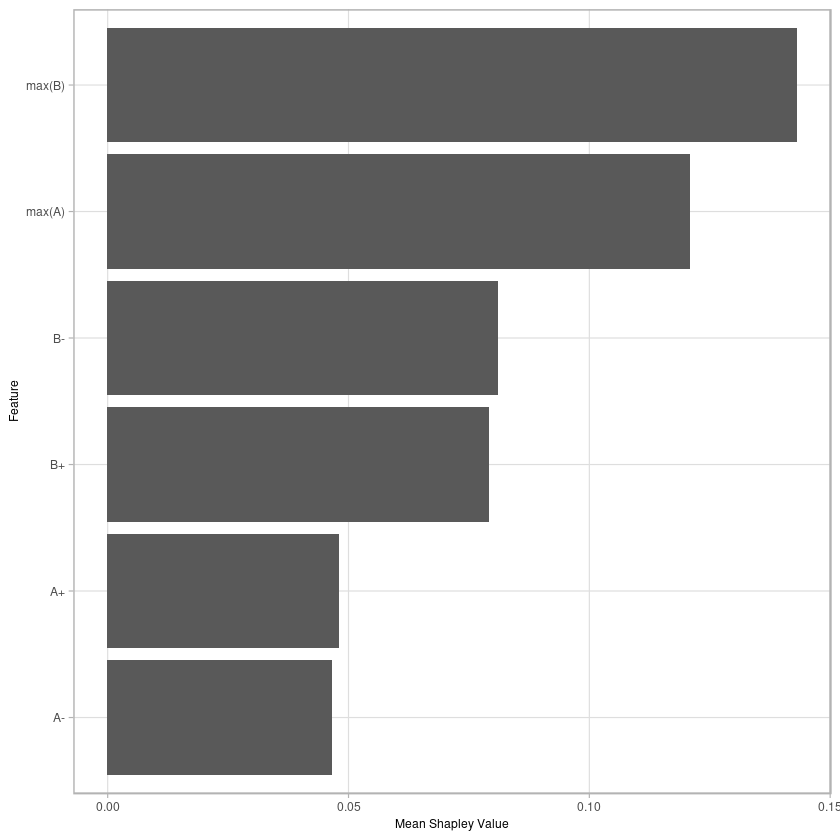

In [169]:
p_shap <- colMeans(abs(shap_contrib)) %>% 
    set_names(c("A+", "A-", "B+", "B-", "max(A)", "max(B)", "BIAS")) %>% 
    enframe() %>% 
    arrange(value) %>%
    filter(name != "BIAS") %>%      
    ggplot(aes(x=reorder(name, value), y=value)) + geom_col() + coord_flip() + ylab("Mean Shapley Value") + xlab("Feature")

p_shap

In [172]:
tgppt::plot_gg_ppt(p_shap + guides(fill=FALSE), here("figures/shap.pptx"), rasterize_plot=FALSE, width = 4, height = 4, left = 1.3, top = 9.7, overwrite=TRUE)

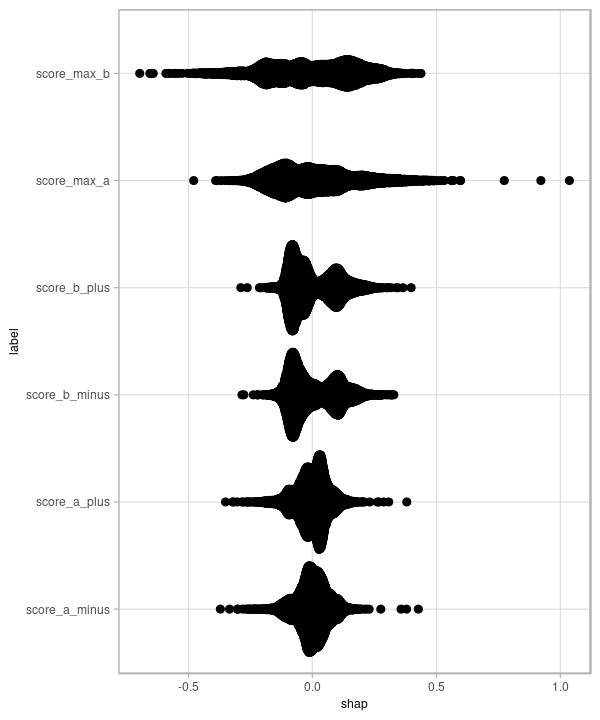

In [120]:
shap_contrib %>% 
    as.data.frame() %>% 
    select(-BIAS) %>% 
    gather("label", "shap") %>%     
    group_by(label) %>% 
    sample_n(10000) %>% 
    ungroup() %>% 
    ggplot(aes(x=label, y=shap)) + 
        coord_flip() + 
        ggforce::geom_sina()
    
    
#     ggplot(aes(x=reorder(name, value), y=value)) + 
#         geom_col() + 
#         coord_flip()

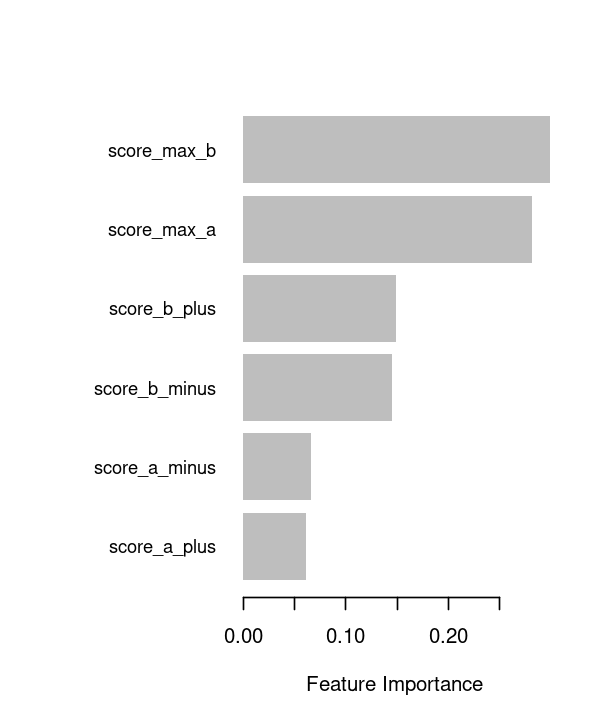

In [86]:
xgb.plot.importance(xgb.importance(model = xgbtrain), xlab = "Feature Importance")

[1] 0.449039

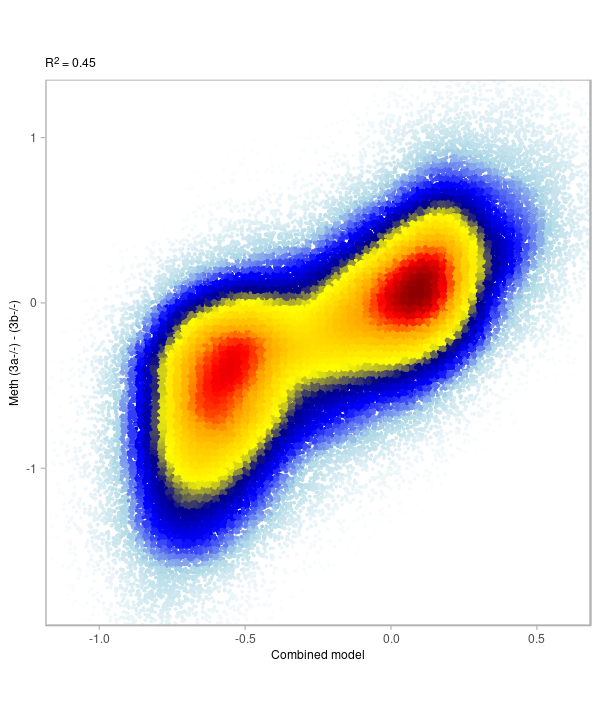

In [87]:
p_comb_score <- tibble(pred = feats_mat_comb_df$pred, y = feats_mat_comb_df$dAB) %>% 
    mutate(col = densCols(., bandwidth=0.06,colramp=colorRampPalette(c("white","lightblue", "blue", "darkblue", "yellow", "gold","orange","red", "darkred" )))) %>% 
    ggplot(aes(x=pred, y=y, col=col)) + 
        geom_point(shape=19, size=point_size) + 
        scale_color_identity() + 
        coord_cartesian(xlim = c(-1.1, 0.6), ylim = c(-1.8, 1.2)) +                 
        xlab("Combined model") + 
        ylab("Meth (3a-/-) - (3b-/-)") +         
        theme(aspect.ratio=1, panel.grid.major=element_blank(), panel.grid.minor=element_blank()) + 
        labs(subtitle = glue("R^2 = {cor}", cor = round(cor(feats_mat_comb_df$pred, feats_mat_comb_df$dAB)^2, digits=2))) + 
        theme(plot.subtitle = ggtext::element_markdown())


p_comb_score
cor(feats_mat_comb_df$dAB, feats_mat_comb_df$pred)^2

In [88]:
tgppt::plot_gg_ppt(p_comb_score + theme_arial(7) + theme(plot.subtitle = ggtext::element_markdown(), aspect.ratio=1, panel.grid.major=element_blank(), panel.grid.minor=element_blank()), here("figures/model_comb.pptx"), rasterize_plot=TRUE, width = 4, height = 4, left = 1.3 + 10, top = 9.7, overwrite=TRUE)

In [89]:
df <- gextract.left_join("DNMT.ab_score_xgb_plus", intervals=feats_mat_comb_df, iterator=feats_mat_comb_df) %>% select(comb_score = pred, dinuc_score = DNMT.ab_score_xgb_plus, dAB) %>% as_tibble()

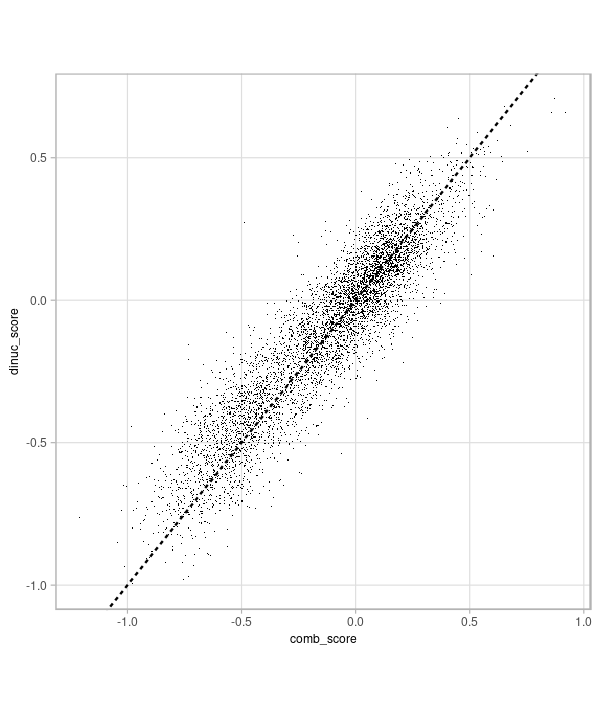

In [90]:
df %>%
        filter(abs(dAB) <= 0.05 )  %>%
        ggplot(aes(x=comb_score, y=dinuc_score)) +
            scattermore::geom_scattermore() + 
            geom_abline(linetype="dashed") + 
            theme(aspect.ratio=1)

[1] 0.8948187

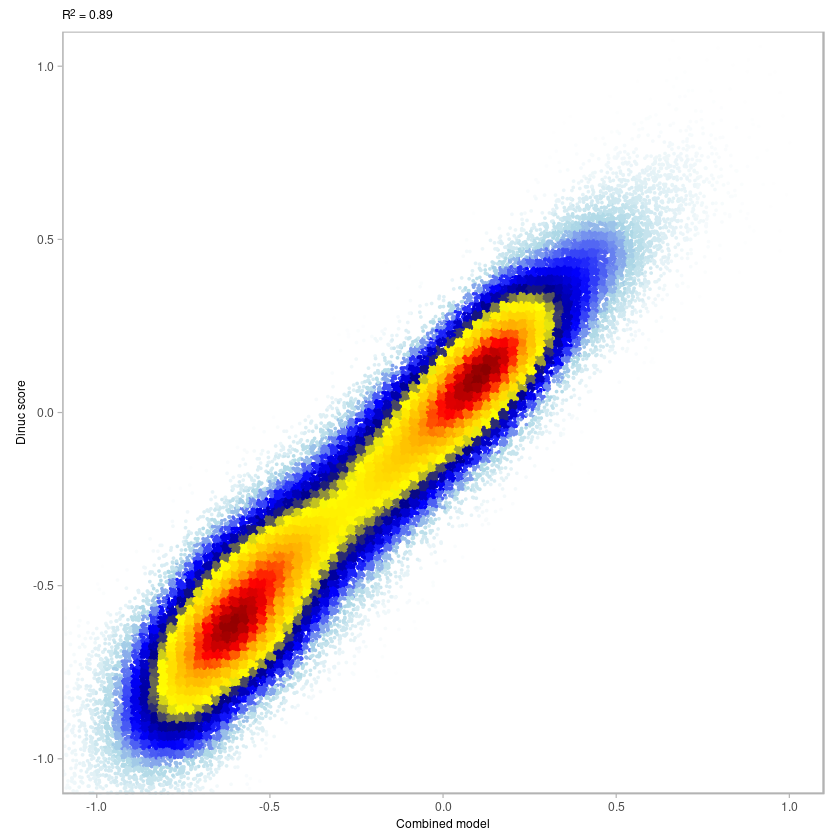

In [173]:
p_comb_vs_dinuc <- df %>% 
    mutate(col = densCols(., bandwidth=0.06,colramp=colorRampPalette(c("white","lightblue", "blue", "darkblue", "yellow", "gold","orange","red", "darkred" )))) %>% 
    ggplot(aes(x=comb_score, y=dinuc_score, col=col)) + 
        geom_point(shape=19, size=point_size) + 
        scale_color_identity() + 
        coord_cartesian(xlim = c(-1, 1), ylim = c(-1, 1)) +                 
        xlab("Combined model") + 
        ylab("Dinuc score") +         
        theme(aspect.ratio=1, panel.grid.major=element_blank(), panel.grid.minor=element_blank()) + 
        labs(subtitle = glue("R^2 = {cor}", cor = round(cor(df$comb_score, df$dinuc_score)^2, digits=2))) + 
        theme(plot.subtitle = ggtext::element_markdown())


p_comb_vs_dinuc
cor(df$comb_score, df$dinuc_score)^2

In [174]:
tgppt::plot_gg_ppt(p_comb_vs_dinuc + theme_arial(7) + theme(plot.subtitle = ggtext::element_markdown(), aspect.ratio=1, panel.grid.major=element_blank(), panel.grid.minor=element_blank()), here("figures/model_comb.pptx"), rasterize_plot=TRUE, width = 4, height = 4, left = 1.3 + 10, top = 5, overwrite=FALSE)

Extract sequence from model

In [93]:
flank_bp <- 5
seq_df_wide <- get_seq_df(feats_mat_comb_df %>% select(chrom, start, end), flank_bp =  flank_bp) %>% seq_df_to_wide(flank_bp = flank_bp)

In [94]:
model_glm_comb <- gen_seq_model(seq_df_wide, feats_mat_comb_df, pred) 

In [95]:
coef_df_comb <- get_coef_df(model_glm_comb)

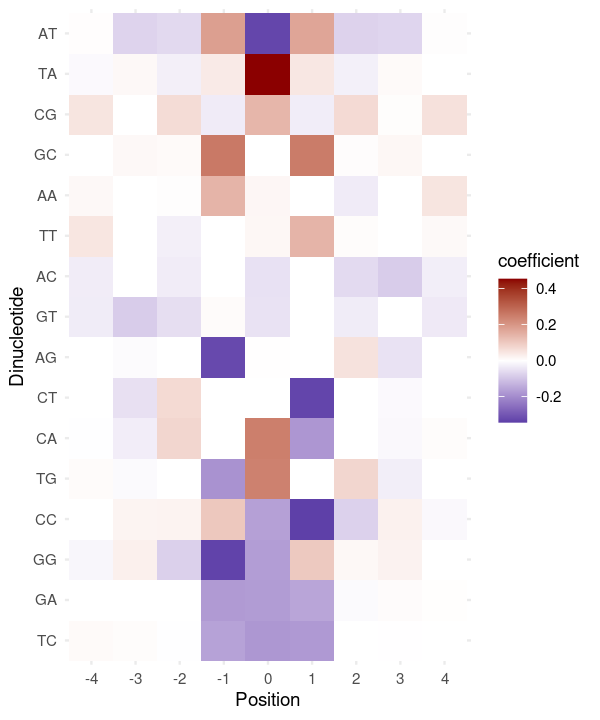

In [96]:
options(repr.plot.width = 5, repr.plot.height = 6)
p <- coef_df_comb %>% 
    ggplot(aes(x=pos, y=dinuc, fill=coefficient)) + 
        geom_tile() + 
#         scale_fill_viridis_c(option="B", na.value = "white") + 
        scale_fill_gradient2(low = "darkblue", high = "darkred", mid = "white", midpoint = 0, na.value="white") + 
        theme_minimal() + 
        ylab("Dinucleotide") + 
        xlab("Position")
p

In [59]:
# tgppt::plot_gg_ppt(p + guides(fill=FALSE) + theme_arial(7) + theme(panel.grid.major=element_blank(), panel.grid.minor=element_blank()), here("figures/model_mat_comb.pptx"), rasterize_plot=TRUE, width = 5, height = 3.5, left = 1.3, top = 9.7, overwrite=TRUE)

In [60]:
model_ab <- readr::read_rds(here("output/ab_dinuc_model_5bp.rds"))

In [61]:
coef_df_ab <- get_coef_df(model_ab)

Joining, by = c("pos", "dinuc")

Warning message in cor.test.default(df$coef, df$coef_comb, method = "spearman"):
“Cannot compute exact p-value with ties”



	Spearman's rank correlation rho

data:  df$coef and df$coef_comb
S = 40789, p-value < 2.2e-16
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.9180361 


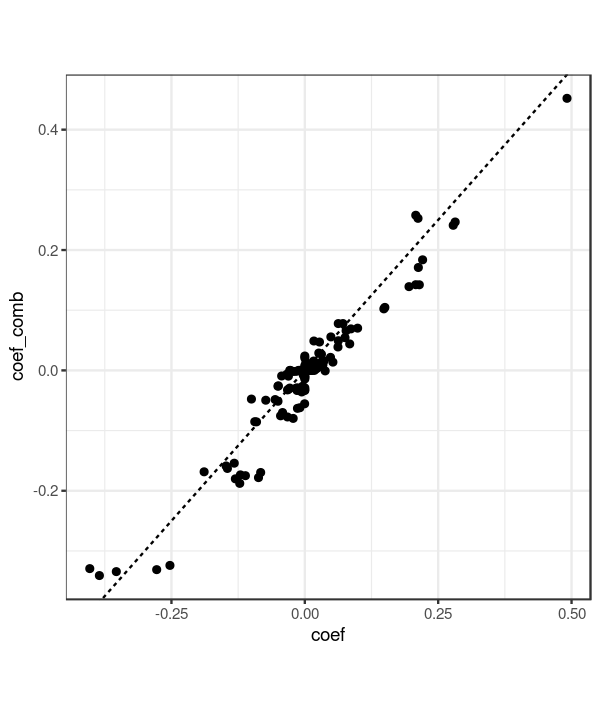

Warning message:
“ggrepel: 124 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


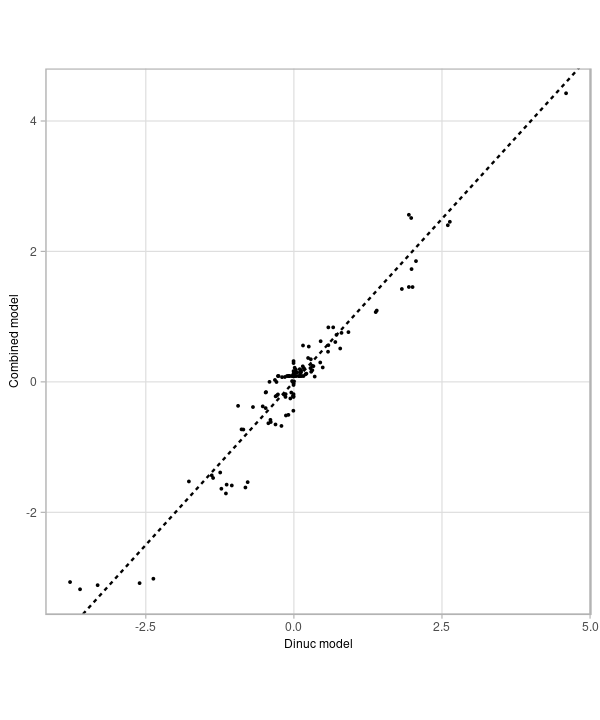

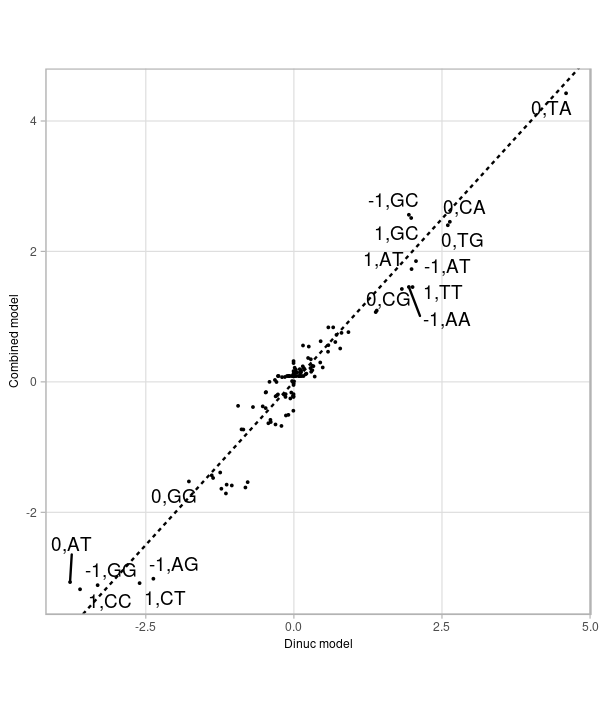

In [180]:
options(repr.plot.width = 5, repr.plot.height = 6)

df <- coef_df_comb %>% 
    select(pos, dinuc, coef_comb = coefficient) %>% 
    left_join(coef_df_ab %>% rename(coef = coefficient)) %>% 
    replace_na(replace = list(coef = 0, coef_comb = 0)) %>% 
    mutate(label = paste0(pos, ",", dinuc))

df_scale <- df %>% 
    mutate_at(vars(coef, coef_comb), function(x) x - mean(x) ) %>% 
    mutate_at(vars(coef, coef_comb), function(x) x / sd(x) ) 

p <-  df %>% 
    ggplot(aes(x=coef, y=coef_comb, label=label)) + 
        geom_point() +        
        geom_abline(linetype="dashed") + 
        theme_bw() + 
        theme(aspect.ratio=1) 
              
p_scale <- df_scale %>% 
    ggplot(aes(x=coef, y=coef_comb, label=label)) + 
        geom_point(size=0.01) +        
        geom_abline(linetype="dashed") + 
        xlab("Dinuc model") + 
        ylab("Combined model") + 
        theme(aspect.ratio=1) 

cor.test(df$coef, df$coef_comb, method="spearman")

p               
p_scale
p_scale + ggrepel::geom_text_repel() 

In [183]:
tgppt::plot_gg_ppt(p_scale + ggrepel::geom_text_repel(size=0.5) , here("figures/model_feats_scatter.pptx"), rasterize_plot=TRUE, width = 4, height = 4, left = 1.3 + 10, top = 5, overwrite=TRUE)

Warning message:
“ggrepel: 138 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


In [141]:
epi6 <- fread(here("output/meissner_epi_cpg_meth_sum.tsv")) %>% 
    mutate(dAB_epi6 = ko3a - ko3b, dA_epi6 = ko3a - wt, dB_epi6 = ko3b - wt) %>% 
    filter(!is.na(dAB_epi6)) %>% 
    select(chrom, start, end, wt, ko3a, ko3b, dAB_epi6, dA_epi6, dB_epi6) %>% 
    as_tibble()
nrow(epi6)

[1] 13388

In [145]:
epi6_scores <- gextract.left_join(c("DNMT.ab_score_comb", "DNMT.ab_score_xgb_plus"), intervals=epi6, iterator=epi6, colnames=c("comb_model", "eb_model")) %>%
    select(-(chrom1:end1)) %>%
    as_tibble()

[1] 0.6284416

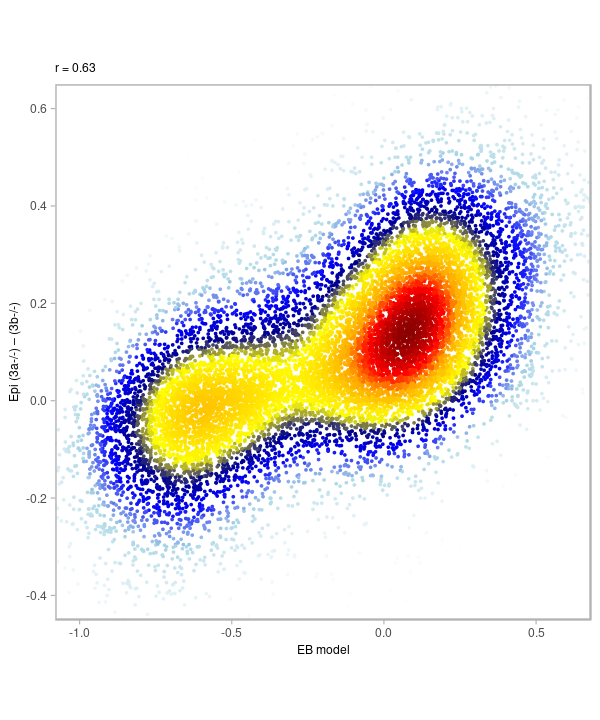

In [146]:
p_epi6_score <- epi6_scores %>% 
    select(eb_model, dAB_epi6) %>%
    mutate(col = densCols(., bandwidth=bandwidth,colramp=colorRampPalette(c("white","lightblue", "blue", "darkblue", "yellow", "gold","orange","red", "darkred" )))) %>% 
    ggplot(aes(x=eb_model, y=dAB_epi6, col=col)) + 
        geom_point(shape=19, size=point_size) + 
        scale_color_identity() + 
        coord_cartesian(xlim = c(-1, 0.6), ylim = c(-0.4, 0.6)) +         
        xlab("EB model") + 
        ylab("Epi (3a-/-) – (3b-/-)") +         
        theme(aspect.ratio=1, panel.grid.major=element_blank(), panel.grid.minor=element_blank()) + 
        labs(subtitle = glue("r = {cor}", cor = round(cor(epi6_scores$dAB_epi6, epi6_scores$eb_model), digits=2)))
cor(epi6_scores$dAB_epi6, epi6_scores$eb_model)
p_epi6_score

[1] 0.6040253

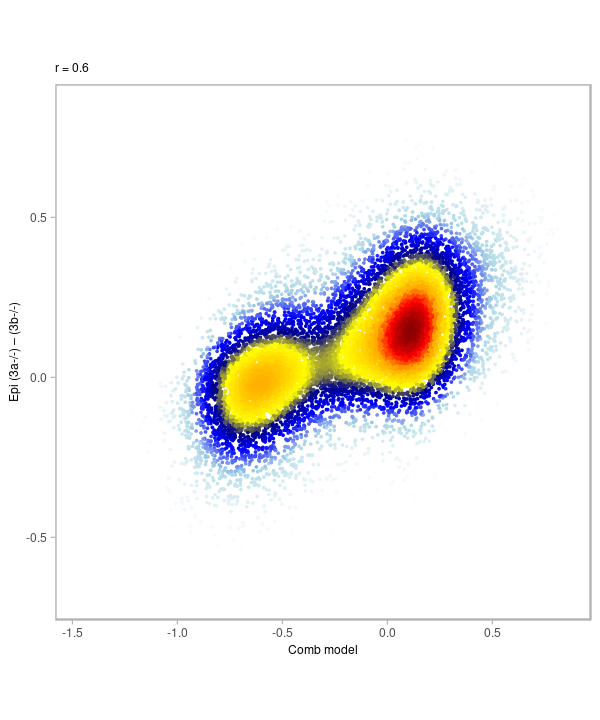

In [147]:
p_epi6_score_comb <- epi6_scores %>% 
    select(comb_model, dAB_epi6) %>%
    mutate(col = densCols(., bandwidth=bandwidth,colramp=colorRampPalette(c("white","lightblue", "blue", "darkblue", "yellow", "gold","orange","red", "darkred" )))) %>% 
    ggplot(aes(x=comb_model, y=dAB_epi6, col=col)) + 
        geom_point(shape=19, size=point_size) + 
        scale_color_identity() + 
#         coord_cartesian(xlim = c(-1, 0.6), ylim = c(-0.4, 0.6)) +         
        xlab("Comb model") + 
        ylab("Epi (3a-/-) – (3b-/-)") +         
        theme(aspect.ratio=1, panel.grid.major=element_blank(), panel.grid.minor=element_blank()) + 
        labs(subtitle = glue("r = {cor}", cor = round(cor(epi6_scores$dAB_epi6, epi6_scores$comb_model), digits=2)))
cor(epi6_scores$dAB_epi6, epi6_scores$comb_model)
p_epi6_score_comb

In [149]:
tgppt::plot_gg_ppt(p_epi6_score_comb + theme_arial(7) + theme(aspect.ratio=1, panel.grid.major=element_blank(), panel.grid.minor=element_blank()), here("figures/model_valid_comb.pptx"), rasterize_plot=TRUE, width = 4, height = 4, left = 1.3, top = 9.7, overwrite=TRUE)

tgppt::plot_gg_ppt(p_epi6_score + theme_arial(7) + theme(aspect.ratio=1, panel.grid.major=element_blank(), panel.grid.minor=element_blank()), here("figures/model_valid_comb.pptx"), rasterize_plot=TRUE, width = 4, height = 4, left = 1.3, top = 5, overwrite=FALSE)


## Calculate models

#### Symetric (by taking both strand)

> Note: we ended up using a different strategy, see below

In [21]:
m_bau <- baubec_meth_cov %>% 
#     filter(pmean(active_3b, active_3a) >= 0.05) %>% 
    filter_low_esc_meth(esc_wgbs) %>% 
    mutate(dAB = active_3b - active_3a)
scales::comma(nrow(m_bau))

Joining, by = c("chrom", "start", "end")



[1] "163,938"

In [22]:
intervs_all <- m_bau %>% select(chrom, start, end)

In [23]:
flank_bp <- 5
seq_df <- get_seq_df(intervs_all, flank_bp = flank_bp)

In [24]:
head(seq_df)

chrom,start,end,nuc,pos,dnuc
<chr>,<int>,<int>,<chr>,<int>,<chr>
chr1,3176538,3176539,T,2,TT
chr1,3176538,3176539,T,3,TT
chr1,3176538,3176539,T,4,TC
chr1,3176538,3176539,C,5,CC
chr1,3176538,3176539,C,6,CT
chr1,3176538,3176539,T,9,TC


In [25]:
seq_df_wide <- seq_df_to_wide(seq_df, flank_bp = 5)
seq_df_wide_nuc <- seq_df_to_wide(seq_df, flank_bp = 5, dinuc=FALSE)

In [26]:
model_ab_bau <- gen_seq_model(seq_df_wide, m_bau, dAB) %fcache_rds% here("output/baubec_ab_dinuc_model_5bp.rds")

1,0.12


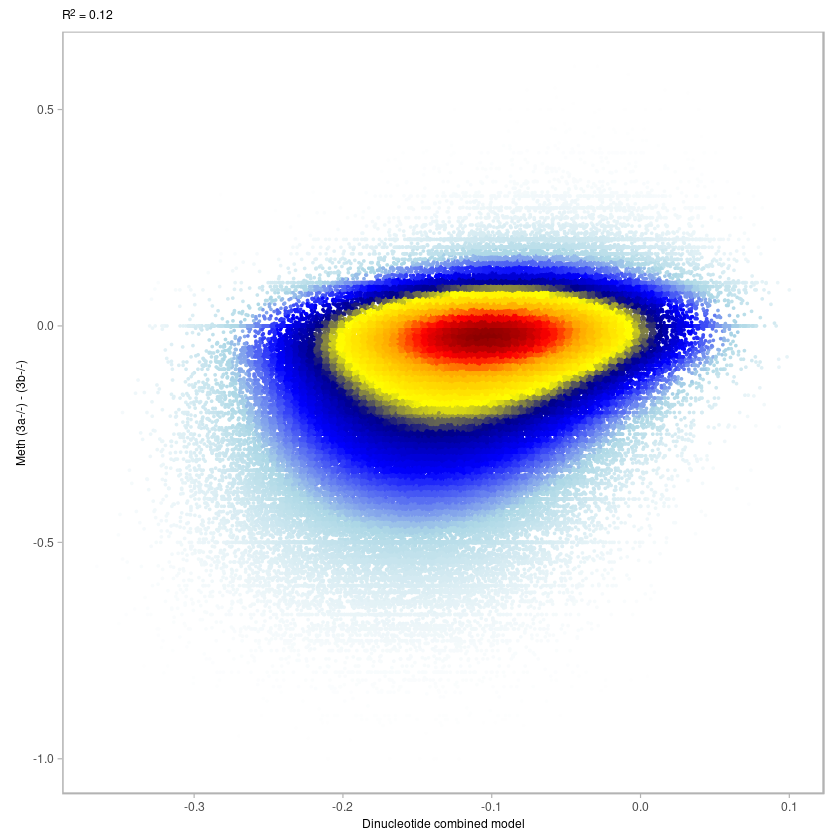

In [27]:
options(repr.plot.width = 7, repr.plot.height = 7)
bandwidth <- 0.08
point_size <- 0.001
p_ab <- tibble(pred = model_ab_bau$pred, y = model_ab_bau$y) %>% 
    mutate(col = densCols(., bandwidth=0.06,colramp=colorRampPalette(c("white","lightblue", "blue", "darkblue", "yellow", "gold","orange","red", "darkred" )))) %>% 
    ggplot(aes(x=pred, y=y, col=col)) + 
        geom_point(shape=19, size=point_size) + 
        scale_color_identity() + 
#         coord_cartesian(xlim = c(-1.1, 0.6), ylim = c(-1.8, 1.2)) +                 
        xlab("Dinucleotide combined model") + 
        ylab("Meth (3a-/-) - (3b-/-)") +         
        theme(aspect.ratio=1, panel.grid.major=element_blank(), panel.grid.minor=element_blank()) + 
        labs(subtitle = glue("R^2 = {cor}", cor = round(cor(model_ab_bau$pred, model_ab_bau$y)^2, digits=2))) + 
        theme(plot.subtitle = ggtext::element_markdown())
round(cor(model_ab_bau$pred, model_ab_bau$y)^2, digits=2)
p_ab

In [28]:
coef_df <- get_coef_df(model_ab_bau)

Loading required package: Matrix


Attaching package: ‘Matrix’


The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack


Loaded glmnet 4.1



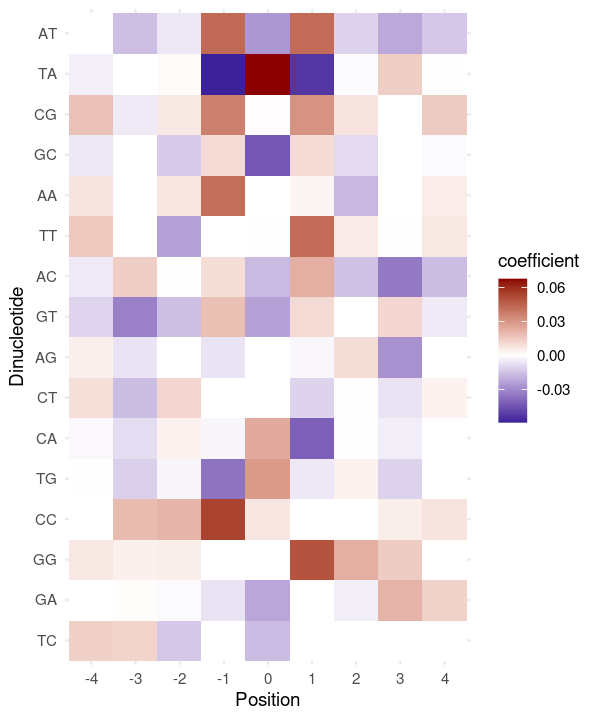

In [29]:
options(repr.plot.width = 5, repr.plot.height = 6)
p <- coef_df %>% 
    ggplot(aes(x=pos, y=dinuc, fill=coefficient)) + 
        geom_tile() + 
#         scale_fill_viridis_c(option="B", na.value = "white") + 
        scale_fill_gradient2(low = "darkblue", high = "darkred", mid = "white", midpoint = 0, na.value="white") + 
        theme_minimal() + 
        ylab("Dinucleotide") + 
        xlab("Position")
p

In [30]:
df <- gextract.left_join("DNMT.ab_score", intervals = m_bau %>% select(chrom, start, end, dAB), iterator = m_bau, colnames="score") %>% select(-(chrom1:end1)) %>% select(chrom, start, end, dAB, score) %>% as_tibble()

[1] 0.2437766

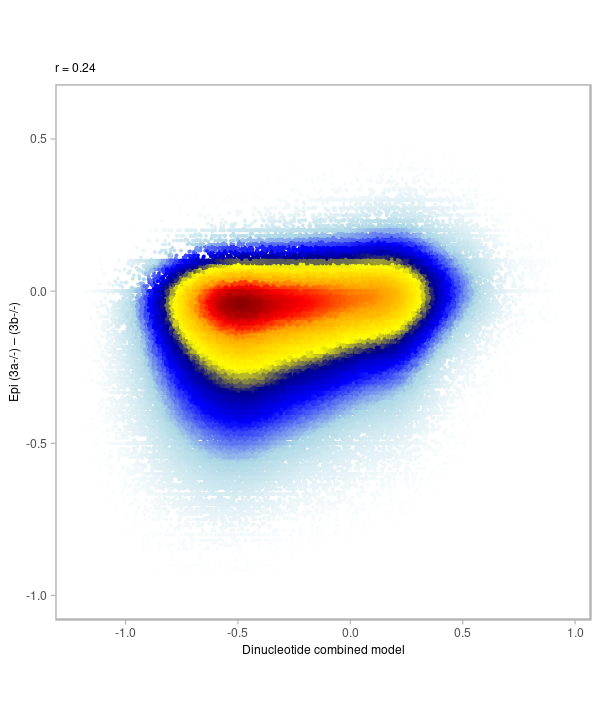

In [31]:
p_baubec_score <- df %>% 
    select(score, dAB) %>%
    mutate(col = densCols(., bandwidth=bandwidth,colramp=colorRampPalette(c("white","lightblue", "blue", "darkblue", "yellow", "gold","orange","red", "darkred" )))) %>% 
    ggplot(aes(x=score, y=dAB, col=col)) + 
        geom_point(shape=19, size=point_size) + 
        scale_color_identity() + 
#         coord_cartesian(xlim = c(-1, 0.6), ylim = c(-0.4, 0.6)) +         
        xlab("Dinucleotide combined model") + 
        ylab("Epi (3a-/-) – (3b-/-)") +         
        theme(aspect.ratio=1, panel.grid.major=element_blank(), panel.grid.minor=element_blank()) + 
        labs(subtitle = glue("r = {cor}", cor = round(cor(df$dAB, df$score), digits=2)))
p_baubec_score
cor(df$dAB, df$score)

#### Non-Symetric

In [32]:
m_bau_plus <- baubec_meth_plus_cov %>% 
#     filter(pmean(active_3b, active_3a) >= 0.05) %>% 
    filter_low_esc_meth(esc_wgbs) %>% 
    mutate(dAB = active_3b - active_3a)
scales::comma(nrow(m_bau_plus))

Joining, by = c("chrom", "start", "end")



[1] "48,354"

In [33]:
intervs_all_plus <- m_bau_plus %>% select(chrom, start, end)

In [34]:
flank_bp <- 5
seq_df_plus <- get_seq_df(intervs_all_plus, flank_bp = flank_bp)

In [35]:
seq_df_wide_plus <- seq_df_to_wide(seq_df_plus, flank_bp = 5)

In [36]:
model_ab_bau_plus <- gen_seq_model(seq_df_wide_plus, m_bau_plus, dAB) %fcache_rds% here("output/baubec_plus_ab_dinuc_model_5bp.rds")

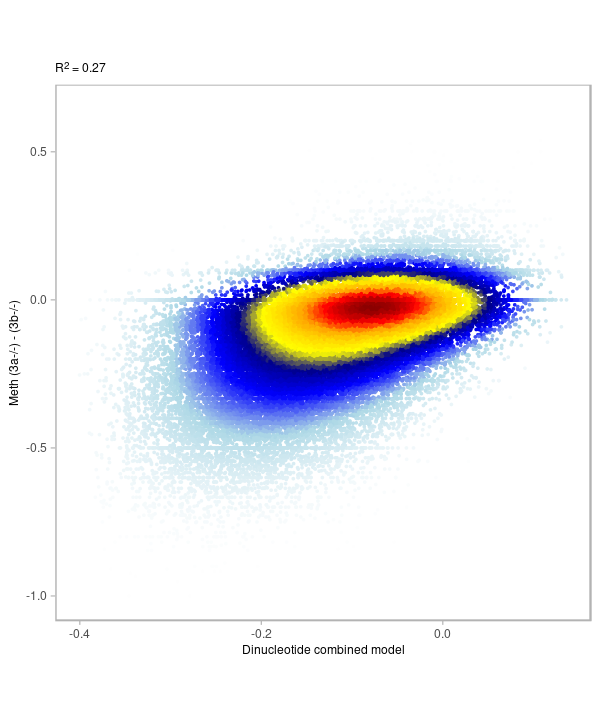

In [37]:
bandwidth <- 0.08
point_size <- 0.001
p_ab <- tibble(pred = model_ab_bau_plus$pred, y = model_ab_bau_plus$y) %>% 
    mutate(col = densCols(., bandwidth=0.06,colramp=colorRampPalette(c("white","lightblue", "blue", "darkblue", "yellow", "gold","orange","red", "darkred" )))) %>% 
    ggplot(aes(x=pred, y=y, col=col)) + 
        geom_point(shape=19, size=point_size) + 
        scale_color_identity() + 
#         coord_cartesian(xlim = c(-1.1, 0.6), ylim = c(-1.8, 1.2)) +                 
        xlab("Dinucleotide combined model") + 
        ylab("Meth (3a-/-) - (3b-/-)") +         
        theme(aspect.ratio=1, panel.grid.major=element_blank(), panel.grid.minor=element_blank()) + 
        labs(subtitle = glue("R^2 = {cor}", cor = round(cor(model_ab_bau_plus$pred, model_ab_bau_plus$y)^2, digits=2))) + 
        theme(plot.subtitle = ggtext::element_markdown())

p_ab

In [38]:
coef_df <- get_coef_df(model_ab_bau_plus)

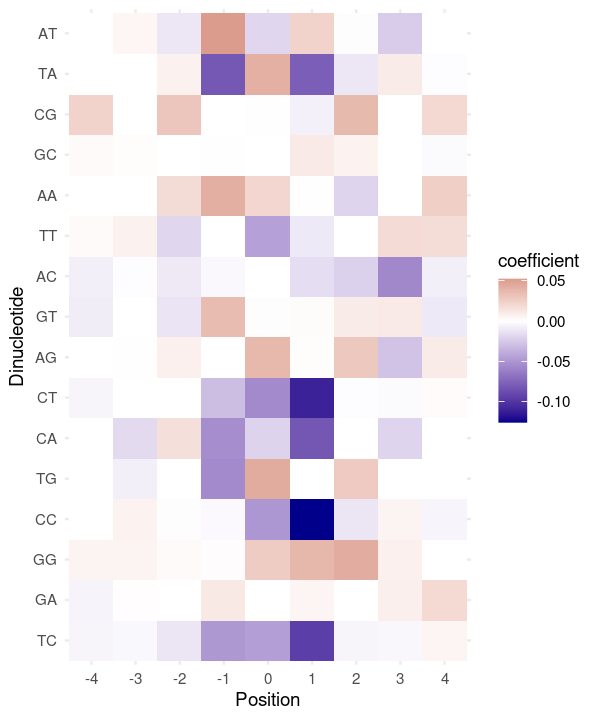

In [39]:
options(repr.plot.width = 5, repr.plot.height = 6)
p <- coef_df %>% 
    ggplot(aes(x=pos, y=dinuc, fill=coefficient)) + 
        geom_tile() + 
#         scale_fill_viridis_c(option="B", na.value = "white") + 
        scale_fill_gradient2(low = "darkblue", high = "darkred", mid = "white", midpoint = 0, na.value="white") + 
        theme_minimal() + 
        ylab("Dinucleotide") + 
        xlab("Position")
p

In [40]:
df_plus <- gextract.left_join("DNMT.ab_score", intervals = m_bau_plus %>% select(chrom, start, end, dAB), iterator = m_bau_plus, colnames="score") %>% select(-(chrom1:end1)) %>% select(chrom, start, end, dAB, score) %>% as_tibble()

[1] 0.2377317

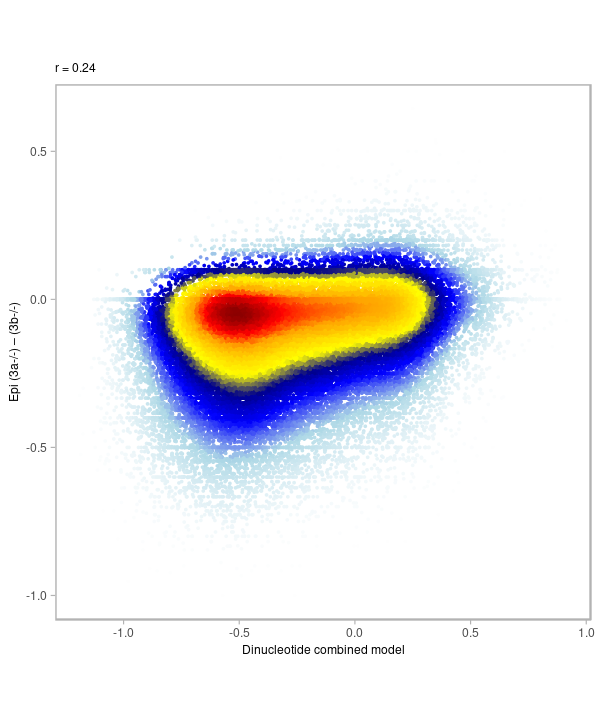

In [41]:
p_baubec_score_plus <- df_plus %>% 
    select(score, dAB) %>%
    mutate(col = densCols(., bandwidth=bandwidth,colramp=colorRampPalette(c("white","lightblue", "blue", "darkblue", "yellow", "gold","orange","red", "darkred" )))) %>% 
    ggplot(aes(x=score, y=dAB, col=col)) + 
        geom_point(shape=19, size=point_size) + 
        scale_color_identity() + 
#         coord_cartesian(xlim = c(-1, 0.6), ylim = c(-0.4, 0.6)) +         
        xlab("Dinucleotide combined model") + 
        ylab("Epi (3a-/-) – (3b-/-)") +         
        theme(aspect.ratio=1, panel.grid.major=element_blank(), panel.grid.minor=element_blank()) + 
        labs(subtitle = glue("r = {cor}", cor = round(cor(df_plus$dAB, df_plus$score), digits=2)))
p_baubec_score_plus
cor(df_plus$dAB, df_plus$score)

#### Symmetrise

> Note: we eneded up symmetrising A and B separately, see below

In [42]:
sym_coef_df <- sym_coefs(model_ab_bau_plus)

Joining, by = c("sym_pos", "sym_dinuc")



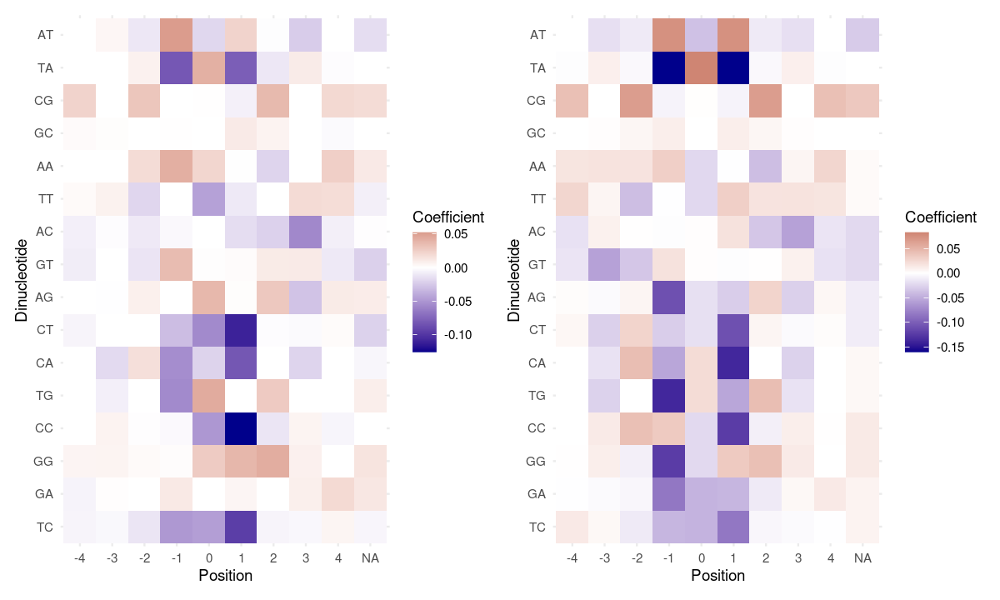

In [43]:
options(repr.plot.width = 10, repr.plot.height = 6)
p_sym <- sym_coef_df %>% 
    ggplot(aes(x=pos, y=dinuc, fill=sum_coef)) + 
        geom_tile() + 
#         scale_fill_viridis_c(option="B", na.value = "white") + 
        scale_fill_gradient2(name = "Coefficient", low = "darkblue", high = "darkred", mid = "white", midpoint = 0, na.value="white") + 
        theme_minimal() + 
        ylab("Dinucleotide") + 
        xlab("Position")

p_not_sym <- sym_coef_df %>% 
    ggplot(aes(x=pos, y=dinuc, fill=coefficient)) + 
        geom_tile() + 
#         scale_fill_viridis_c(option="B", na.value = "white") + 
        scale_fill_gradient2(name = "Coefficient", low = "darkblue", high = "darkred", mid = "white", midpoint = 0, na.value="white") + 
        theme_minimal() + 
        ylab("Dinucleotide") + 
        xlab("Position")

p_not_sym + p_sym

In [44]:
model_ab <- gen_seq_model(seq_df_wide, m, dAB) %cache_rds% here("output/ab_dinuc_model_5bp.rds")

Using cached rds from '/net/mraid14/export/tgdata/users/aviezerl/proj/ebdnmt/output/ab_dinuc_model_5bp.rds'



In [45]:
coef_df_ab <- get_coef_df(model_ab)

Joining, by = c("pos", "dinuc")

Warning message in cor.test.default(df$coef, df$coef_sym, method = "spearman"):
“Cannot compute exact p-value with ties”



	Spearman's rank correlation rho

data:  df$coef and df$coef_sym
S = 223197, p-value < 2.2e-16
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.6730378 


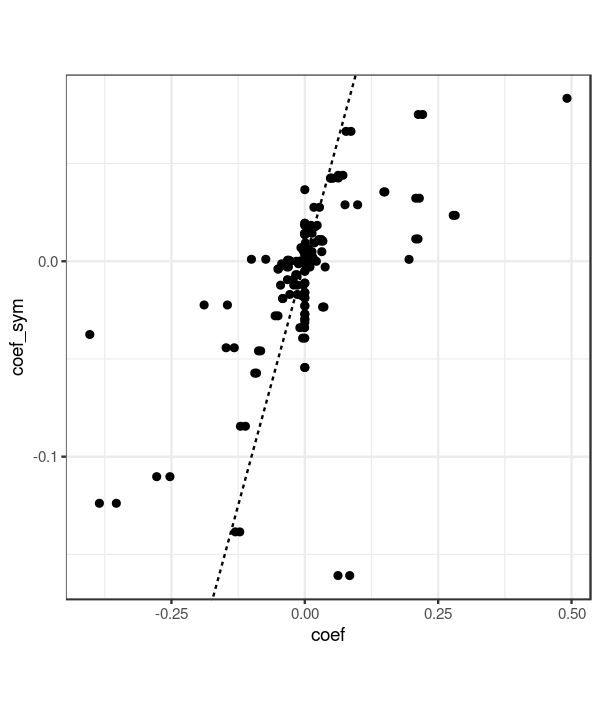

Warning message:
“ggrepel: 120 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


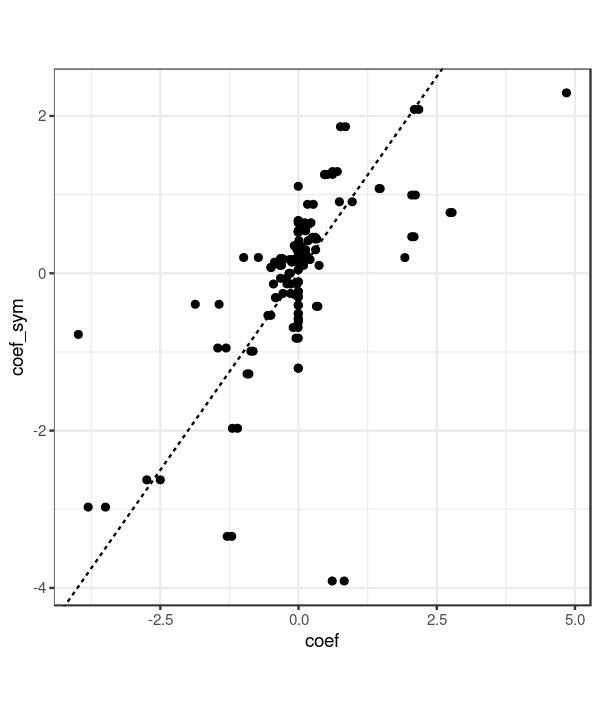

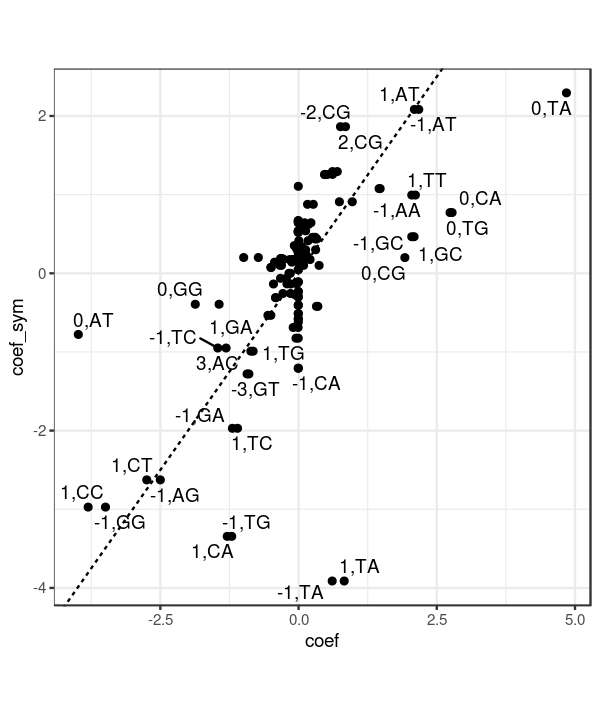

In [46]:
options(repr.plot.width = 5, repr.plot.height = 6)

df <- sym_coef_df %>% 
    select(pos, dinuc, coef_sym = sum_coef) %>% 
    left_join(coef_df_ab %>% rename(coef = coefficient)) %>% 
    replace_na(replace = list(coef = 0, coef_sym = 0)) %>% 
    mutate(label = paste0(pos, ",", dinuc))

df_scale <- df %>% 
    mutate_at(vars(coef, coef_sym), function(x) x - mean(x) ) %>% 
    mutate_at(vars(coef, coef_sym), function(x) x / sd(x) ) 

p <-  df %>% 
    ggplot(aes(x=coef, y=coef_sym, label=label)) + 
        geom_point() +        
        geom_abline(linetype="dashed") + 
        theme_bw() + 
        theme(aspect.ratio=1) 
              
p_scale <- df_scale %>% 
    ggplot(aes(x=coef, y=coef_sym, label=label)) + 
        geom_point() +        
        geom_abline(linetype="dashed") + 
        theme_bw() + 
        theme(aspect.ratio=1) 

cor.test(df$coef, df$coef_sym, method="spearman")

p               
p_scale
p_scale + ggrepel::geom_text_repel() 

#### Learn separatly A and B

In [47]:
m_bau_plus_A <- baubec_meth_plus_cov %>% 
#     filter(active_3a.cov >= 10) %>%
#     filter(active_3a >= 0.05) 
    filter_low_esc_meth(esc_wgbs)
m_bau_plus_B <- baubec_meth_plus_cov %>% 
#     filter(active_3b.cov >= 10) %>%
#     filter(active_3b >= 0.05)
    filter_low_esc_meth(esc_wgbs) 
scales::comma(nrow(m_bau_plus_A))
scales::comma(nrow(m_bau_plus_B))

Joining, by = c("chrom", "start", "end")

Joining, by = c("chrom", "start", "end")



[1] "48,354"

[1] "48,354"

In [48]:
intervs_all_plus_A <- m_bau_plus_A %>% select(chrom, start, end)
intervs_all_plus_B <- m_bau_plus_B %>% select(chrom, start, end)

In [49]:
flank_bp <- 5
seq_df_plus_A <- get_seq_df(intervs_all_plus_A, flank_bp = flank_bp)
seq_df_plus_B <- get_seq_df(intervs_all_plus_B, flank_bp = flank_bp)

In [50]:
seq_df_wide_plus_A <- seq_df_to_wide(seq_df_plus_A, flank_bp = 5)
seq_df_wide_plus_B <- seq_df_to_wide(seq_df_plus_B, flank_bp = 5)

In [51]:
model_ab_bau_plus_A <- gen_seq_model(seq_df_wide_plus_A, m_bau_plus_A, active_3a) %fcache_rds% here("output/baubec_plus_a_dinuc_model_5bp.rds")
model_ab_bau_plus_B <- gen_seq_model(seq_df_wide_plus_B, m_bau_plus_B, active_3b) %fcache_rds% here("output/baubec_plus_b_dinuc_model_5bp.rds")

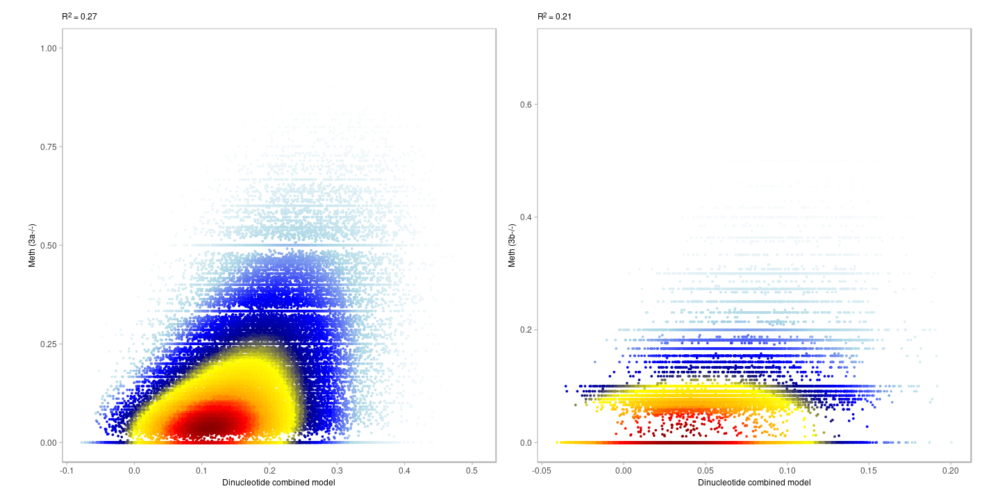

In [52]:
options(repr.plot.width = 12, repr.plot.height = 6)
bandwidth <- 0.08
point_size <- 0.001
p_a <- tibble(pred = model_ab_bau_plus_A$pred, y = model_ab_bau_plus_A$y) %>% 
    mutate(col = densCols(., bandwidth=0.06,colramp=colorRampPalette(c("white","lightblue", "blue", "darkblue", "yellow", "gold","orange","red", "darkred" )))) %>% 
    ggplot(aes(x=pred, y=y, col=col)) + 
        geom_point(shape=19, size=point_size) + 
        scale_color_identity() + 
#         coord_cartesian(xlim = c(-1.1, 0.6), ylim = c(-1.8, 1.2)) +                 
        xlab("Dinucleotide combined model") + 
        ylab("Meth (3a-/-)") +         
        theme(aspect.ratio=1, panel.grid.major=element_blank(), panel.grid.minor=element_blank()) + 
        labs(subtitle = glue("R^2 = {cor}", cor = round(cor(model_ab_bau_plus_A$pred, model_ab_bau_plus_A$y)^2, digits=2))) + 
        theme(plot.subtitle = ggtext::element_markdown())

p_b <- tibble(pred = model_ab_bau_plus_B$pred, y = model_ab_bau_plus_B$y) %>% 
    mutate(col = densCols(., bandwidth=0.06,colramp=colorRampPalette(c("white","lightblue", "blue", "darkblue", "yellow", "gold","orange","red", "darkred" )))) %>% 
    ggplot(aes(x=pred, y=y, col=col)) + 
        geom_point(shape=19, size=point_size) + 
        scale_color_identity() + 
#         coord_cartesian(xlim = c(-1.1, 0.6), ylim = c(-1.8, 1.2)) +                 
        xlab("Dinucleotide combined model") + 
        ylab("Meth (3b-/-)") +         
        theme(aspect.ratio=1, panel.grid.major=element_blank(), panel.grid.minor=element_blank()) + 
        labs(subtitle = glue("R^2 = {cor}", cor = round(cor(model_ab_bau_plus_B$pred, model_ab_bau_plus_B$y)^2, digits=2))) + 
        theme(plot.subtitle = ggtext::element_markdown())

p_a + p_b

In [53]:
coef_df_A <- get_coef_df(model_ab_bau_plus_A)
coef_df_B <- get_coef_df(model_ab_bau_plus_B)

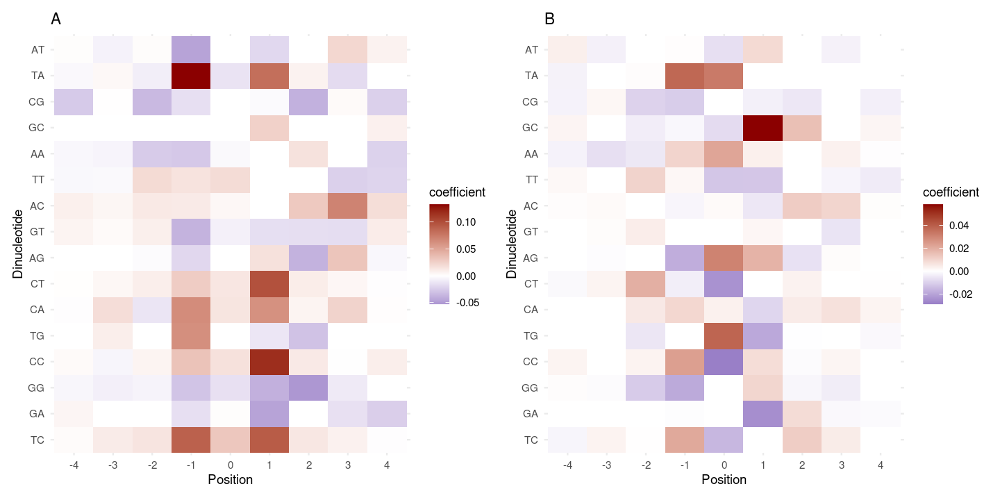

In [54]:
options(repr.plot.width = 12, repr.plot.height = 6)
p_a <- coef_df_A %>% 
    ggplot(aes(x=pos, y=dinuc, fill=coefficient)) + 
        geom_tile() + 
#         scale_fill_viridis_c(option="B", na.value = "white") + 
        scale_fill_gradient2(low = "darkblue", high = "darkred", mid = "white", midpoint = 0, na.value="white") + 
        theme_minimal() + 
        ylab("Dinucleotide") + 
        xlab("Position") + 
        ggtitle("A")
p_b <- coef_df_B %>% 
    ggplot(aes(x=pos, y=dinuc, fill=coefficient)) + 
        geom_tile() + 
#         scale_fill_viridis_c(option="B", na.value = "white") + 
        scale_fill_gradient2(low = "darkblue", high = "darkred", mid = "white", midpoint = 0, na.value="white") + 
        theme_minimal() + 
        ylab("Dinucleotide") + 
        xlab("Position") + 
        ggtitle("B")
p_a + p_b

In [55]:
sym_coef_df_A <- sym_coefs(model_ab_bau_plus_A)
sym_coef_df_B <- sym_coefs(model_ab_bau_plus_B)

Joining, by = c("sym_pos", "sym_dinuc")

Joining, by = c("sym_pos", "sym_dinuc")



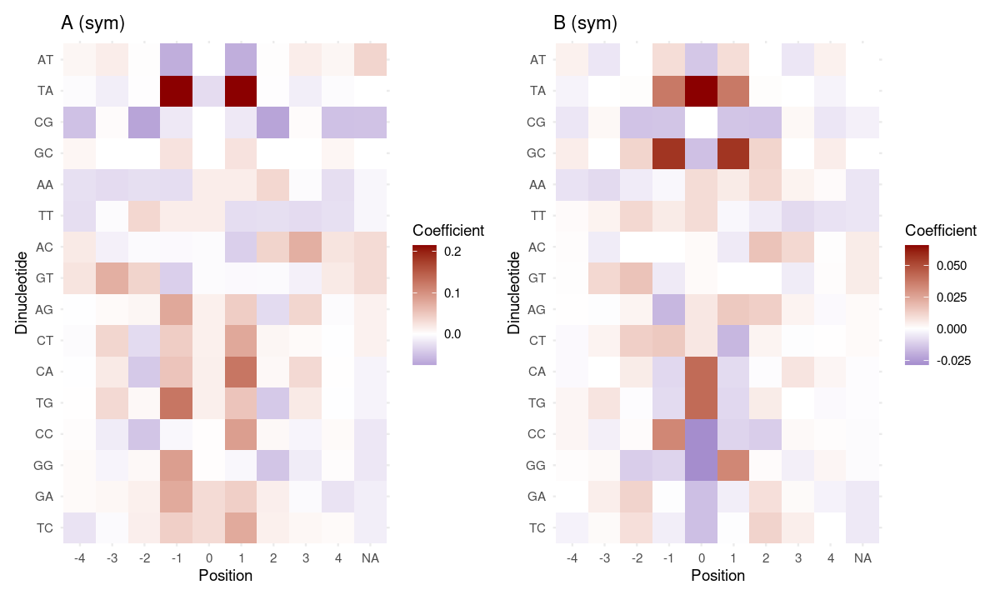

In [56]:
options(repr.plot.width = 10, repr.plot.height = 6)
p_sym_A <- sym_coef_df_A %>% 
    ggplot(aes(x=pos, y=dinuc, fill=sum_coef)) + 
        geom_tile() + 
#         scale_fill_viridis_c(option="B", na.value = "white") + 
        scale_fill_gradient2(name = "Coefficient", low = "darkblue", high = "darkred", mid = "white", midpoint = 0, na.value="white") + 
        theme_minimal() + 
        ylab("Dinucleotide") + 
        xlab("Position") + 
        ggtitle("A (sym)")

p_sym_B <- sym_coef_df_B %>% 
    ggplot(aes(x=pos, y=dinuc, fill=sum_coef)) + 
        geom_tile() + 
#         scale_fill_viridis_c(option="B", na.value = "white") + 
        scale_fill_gradient2(name = "Coefficient", low = "darkblue", high = "darkred", mid = "white", midpoint = 0, na.value="white") + 
        theme_minimal() + 
        ylab("Dinucleotide") + 
        xlab("Position") + 
        ggtitle("B (sym)")




p_sym_A + p_sym_B

In [57]:
sym_coef_df_AB <- sym_coef_df_A %>% 
    select(pos, dinuc, coef_A = sum_coef) %>% 
    left_join(sym_coef_df_B %>% select(pos, dinuc, coef_B = sum_coef) ) %>% 
    replace_na(replace=list(coef_A = 0, coef_B = 0)) %>% 
    mutate(sym_coef = coef_B - coef_A) 

Joining, by = c("pos", "dinuc")



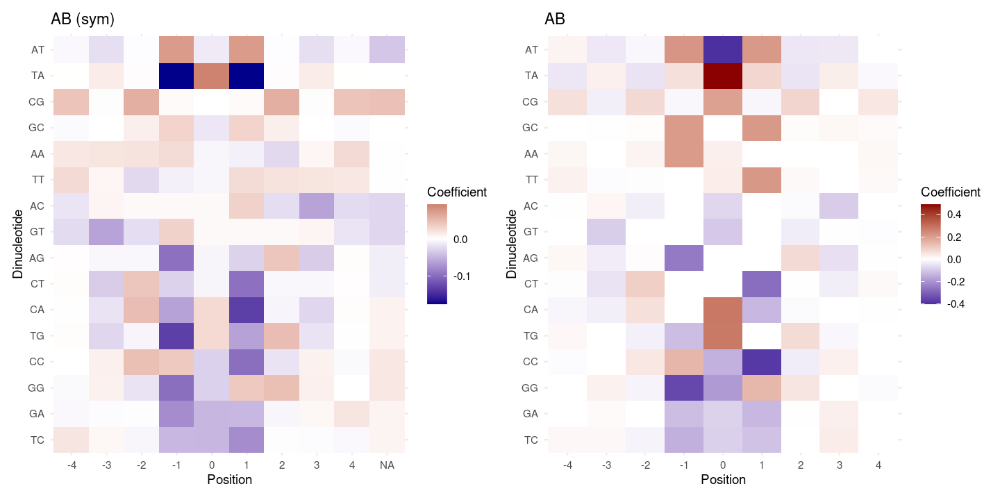

In [58]:
options(repr.plot.width = 12, repr.plot.height = 6)
p_sym_AB <- sym_coef_df_AB %>% 
    ggplot(aes(x=pos, y=dinuc, fill=sym_coef)) + 
        geom_tile() + 
#         scale_fill_viridis_c(option="B", na.value = "white") + 
        scale_fill_gradient2(name = "Coefficient", low = "darkblue", high = "darkred", mid = "white", midpoint = 0, na.value="white") + 
        theme_minimal() + 
        ylab("Dinucleotide") + 
        xlab("Position") + 
        ggtitle("AB (sym)")

p_ab <- coef_df_ab %>% 
    ggplot(aes(x=pos, y=dinuc, fill=coefficient)) + 
        geom_tile() + 
#         scale_fill_viridis_c(option="B", na.value = "white") + 
        scale_fill_gradient2(name = "Coefficient", low = "darkblue", high = "darkred", mid = "white", midpoint = 0, na.value="white") + 
        theme_minimal() + 
        ylab("Dinucleotide") + 
        xlab("Position") + 
        ggtitle("AB")


p_sym_AB + p_ab

Joining, by = c("pos", "dinuc")

Warning message:
“ggrepel: 109 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


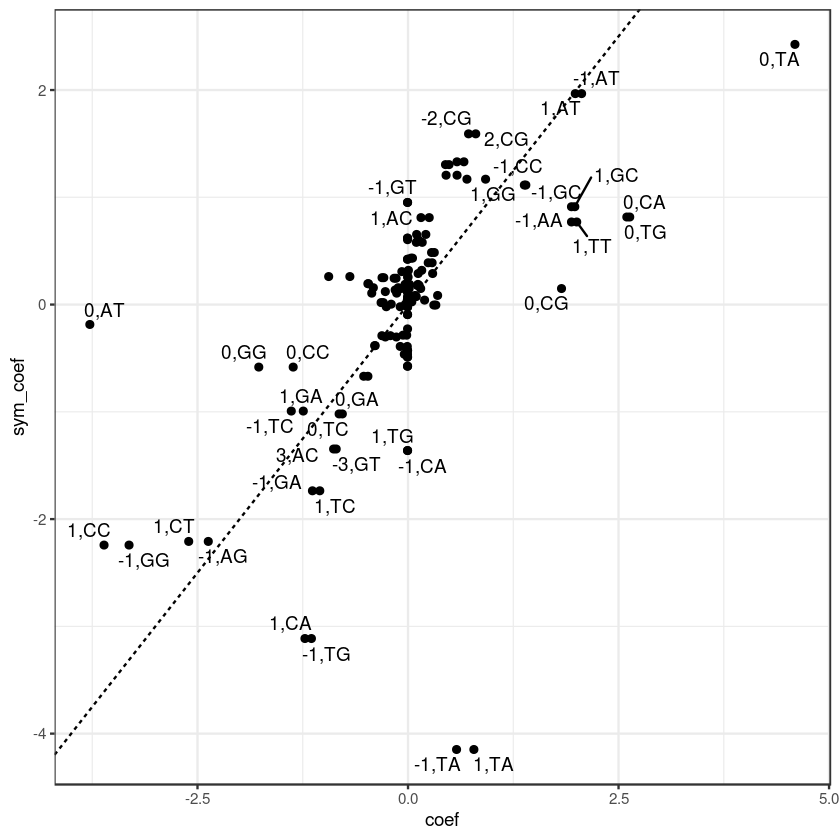

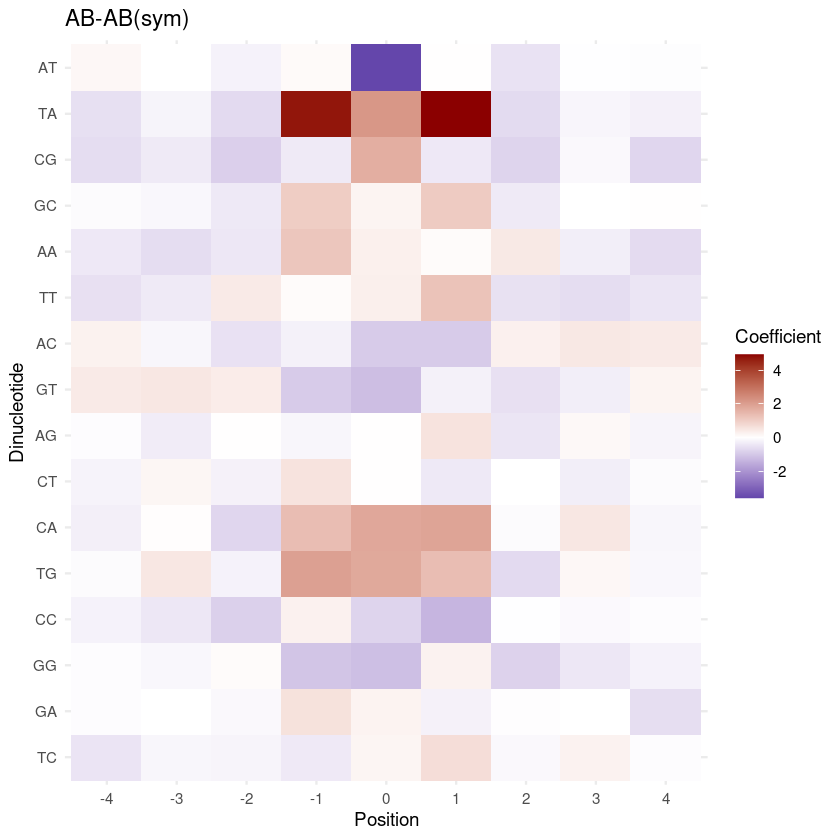

In [59]:
options(repr.plot.width = 7, repr.plot.height = 7)
df_scale <- coef_df_ab %>% rename(coef = coefficient) %>%      
    left_join(sym_coef_df_AB %>% select(pos, dinuc, sym_coef)) %>%     
    replace_na(replace = list(coef = 0, sym_coef = 0, coef_A = 0, coef_B = 0)) %>% 
    mutate(label = paste0(pos, ",", dinuc)) %>% 
    mutate_at(vars(coef, sym_coef), function(x) x - mean(x) ) %>% 
    mutate_at(vars(coef, sym_coef), function(x) x / sd(x) ) 
              

df_scale %>% 
    ggplot(aes(x=coef, y=sym_coef, label=label)) + 
        geom_point() +        
        geom_abline(linetype="dashed") + 
        theme_bw() + 
        theme(aspect.ratio=1)  + ggrepel::geom_text_repel() 

              
df_scale %>% 
    ggplot(aes(x=pos, y=dinuc, fill=coef-sym_coef)) + 
        geom_tile() + 
#         scale_fill_viridis_c(option="B", na.value = "white") + 
        scale_fill_gradient2(name = "Coefficient", low = "darkblue", high = "darkred", mid = "white", midpoint = 0, na.value="white") + 
        theme_minimal() + 
        ylab("Dinucleotide") + 
        xlab("Position") + 
        ggtitle("AB-AB(sym)")

Joining, by = c("pos", "dinuc")

Joining, by = c("pos", "dinuc")

Joining, by = c("pos", "dinuc")

Warning message:
“ggrepel: 123 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 124 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 118 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 130 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


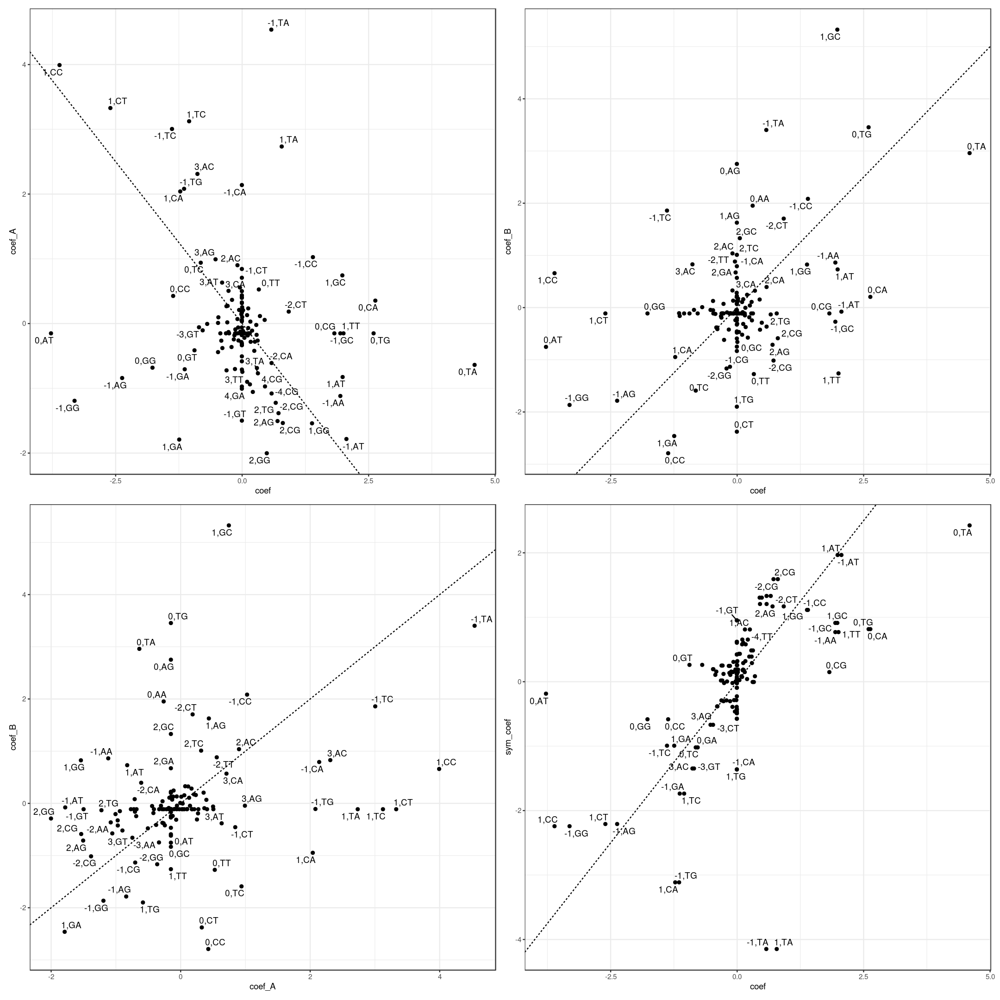

In [60]:
options(repr.plot.width = 18, repr.plot.height = 18)

df <- coef_df_A %>% 
    select(pos, dinuc, coef_A = coefficient) %>%         
    left_join(coef_df_B %>% select(pos, dinuc, coef_B = coefficient)) %>% 
    left_join(coef_df_ab %>% rename(coef = coefficient)) %>% 
    left_join(sym_coef_df_AB %>% select(pos, dinuc, sym_coef)) %>%     
    replace_na(replace = list(coef = 0, coef_A = 0, coef_B = 0)) %>% 
    mutate(label = paste0(pos, ",", dinuc))

df_scale <- df %>% 
    mutate_at(vars(coef, sym_coef, coef_A, coef_B), function(x) x - mean(x) ) %>% 
    mutate_at(vars(coef, sym_coef, coef_A, coef_B), function(x) x / sd(x) ) 

p_A <-  df_scale %>% 
    ggplot(aes(x=coef, y=coef_A, label=label)) + 
        geom_point() +        
        geom_abline(slope = -1, linetype="dashed") + 
        theme_bw() + 
        theme(aspect.ratio=1) + ggrepel::geom_text_repel() 
              
p_B <-  df_scale %>% 
    ggplot(aes(x=coef, y=coef_B, label=label)) + 
        geom_point() +        
        geom_abline(linetype="dashed") + 
        theme_bw() + 
        theme(aspect.ratio=1)  + ggrepel::geom_text_repel() 
              
p_AB <-  df_scale %>% 
    ggplot(aes(x=coef_A, y=coef_B, label=label)) + 
        geom_point() +        
        geom_abline(linetype="dashed") + 
        theme_bw() + 
        theme(aspect.ratio=1)  + ggrepel::geom_text_repel() 
              
p_AB_sym <-  df_scale %>% 
    ggplot(aes(x=coef, y=sym_coef, label=label)) + 
        geom_point() +        
        geom_abline(linetype="dashed") + 
        theme_bw() + 
        theme(aspect.ratio=1)  + ggrepel::geom_text_repel() 
              
# p_scale <- df_scale %>% 
#     ggplot(aes(x=coef, y=coef_sym, label=label)) + 
#         geom_point() +        
#         geom_abline(linetype="dashed") + 
#         theme_bw() + 
#         theme(aspect.ratio=1) 

# cor.test(df$coef, df$coef_sym, method="spearman")

# p               
# p_scale
p_A + p_B + p_AB + p_AB_sym

### Compare our model and Mellona based

In [61]:
model_ab <- readr::read_rds(here("output/ab_dinuc_model_5bp.rds"))

In [62]:
fwrite(sym_coef_df_AB, here("output/sym_coef_AB.tsv"), sep="\t")

In [210]:
fwrite(sym_coef_df_A, here("output/sym_coef_A.tsv"), sep="\t")
fwrite(sym_coef_df_B, here("output/sym_coef_B.tsv"), sep="\t")

In [63]:
intercept_A <- coef(model_ab_bau_plus_A$fit_cv, s = "lambda.min")[1, ]
intercept_B <- coef(model_ab_bau_plus_B$fit_cv, s = "lambda.min")[1, ]

intercept <- intercept_B - intercept_A
intercept

[1] -0.1112359

In [212]:
sym_coef_mat <- coef_df_to_matrix(sym_coef_df_AB %>% select(pos, dinuc, coefficient = sym_coef), model_ab, intercept=intercept) %cache_rds% here("output/sym_coef_AB_mat.rds")
sym_coef_mat_A <- coef_df_to_matrix(sym_coef_df_A %>% select(pos, dinuc, coefficient = sum_coef), model_ab, intercept=intercept) %cache_rds% here("output/sym_coef_A_mat.rds")
sym_coef_mat_B <- coef_df_to_matrix(sym_coef_df_B %>% select(pos, dinuc, coefficient = sum_coef), model_ab, intercept=intercept) %cache_rds% here("output/sym_coef_B_mat.rds")

Using cached rds from '/net/mraid14/export/tgdata/users/aviezerl/proj/ebdnmt/output/sym_coef_AB_mat.rds'



In [214]:
all_cpgs <- gintervals.load("intervs.global.seq_CG")
res <- compute_interval_model_mat_score_parallel(all_cpgs, model_ab, sym_coef_mat, sym_coef_mat_A, sym_coef_mat_B) %cache_df% here("output/baubec_model_vs_ours.tsv") %>% as_tibble()

Using cached dataframe from '/net/mraid14/export/tgdata/users/aviezerl/proj/ebdnmt/output/baubec_model_vs_ours.tsv'



In [215]:
res_scale <- res %>% 
    mutate_at(vars(score, score_model, score_orig), function(x) scales::rescale(x, to=c(-1,1))) %>%
    as_tibble()

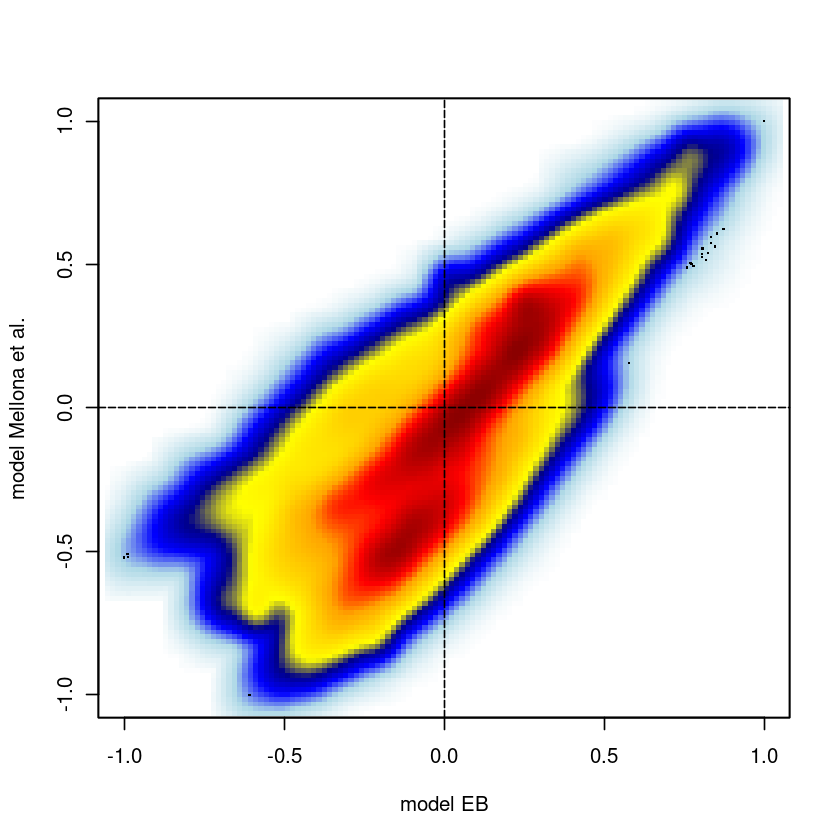

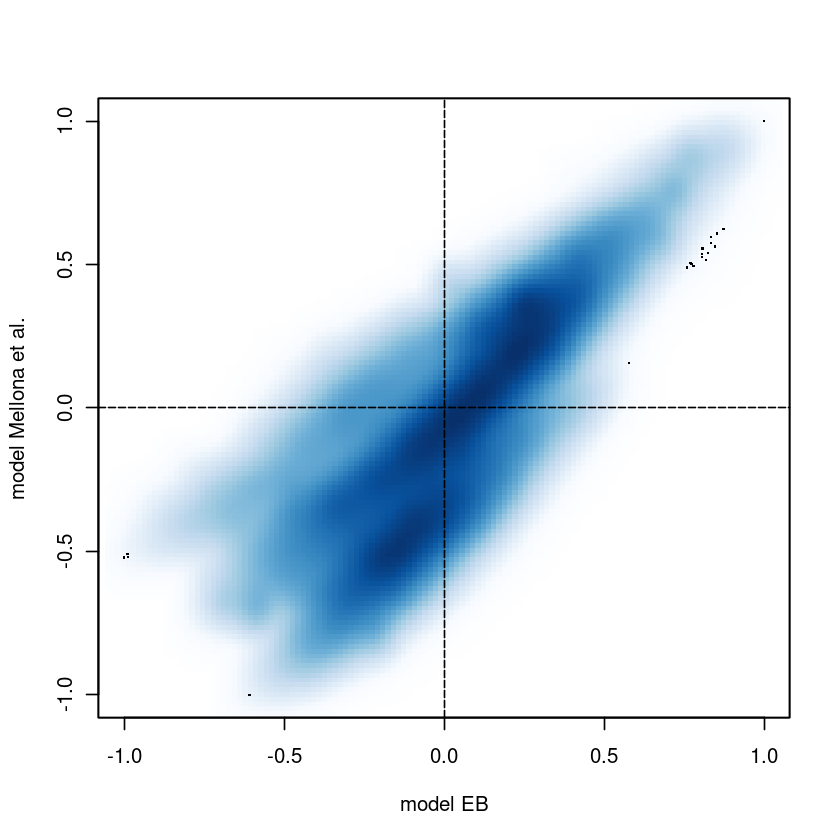

In [216]:
options(repr.plot.width = 7, repr.plot.height = 7)
limits <- c(-1,1)
# shades <- colorRampPalette(c("white", "lightblue", "blue", "darkblue", "yellow", "gold","orange","red", "darkred" )) 
shades <- colorRampPalette(c("white","lightblue", "blue", "darkblue", "yellow", "gold","orange","red", "darkred" ))
smoothScatter(
    res_scale$score, 
    res_scale$score_model, 
    colramp = shades,
    xlab="model EB", 
    ylab = "model Mellona et al.",
    xlim = limits, 
    ylim = limits)
# abline(a = 0, b = 1, lty=5)
abline(h = 0, lty=5)
abline(v = 0, lty=5)

smoothScatter(
    res_scale$score, 
    res_scale$score_model,     
    xlab="model EB", 
    ylab = "model Mellona et al.",
    xlim = limits, 
    ylim = limits)
# abline(a = 0, b = 1, lty=5)
abline(h = 0, lty=5)
abline(v = 0, lty=5)

In [217]:
meth_df_scores <- cpg_meth %>% 
    mutate(
        mA = psum(d1_3a, d2_3a, d3_3a, d4_3a, na.rm=FALSE),
        mB = psum(d1_3b, d2_3b, d3_3b, d4_3b, na.rm=FALSE),
        mwt = psum(d1_wt, d2_wt, d3_wt, d4_wt, na.rm=FALSE),
        dAB = mA - mB
    ) %>%
    full_join(baubec_meth_plus_cov) %>% 
#     inner_join(baubec_meth_plus_cov) %>% 
    left_join(res_scale) %>% 
    mutate(dAB_baubec = active_3b - active_3a)

Joining, by = c("chrom", "start", "end")

Joining, by = c("chrom", "start", "end")



In [218]:
df <- meth_df_scores %>%
        mutate(grp = case_when(
            score >= 0 & score_model >= 0 ~ "B", 
            score < 0 & score_model < 0 ~ "A", 
            score < 0 & score_model >= 0 ~ "BA", 
            score >= 0 & score_model < 0 ~ "AB")) %>% 
    select(dAB, dAB_baubec, grp) %>% 
    mutate_at(vars(dAB, dAB_baubec), function(x) scales::rescale(x, to=c(-1,1)))

Warning message:
“Removed 263707 rows containing non-finite values (stat_boxplot).”


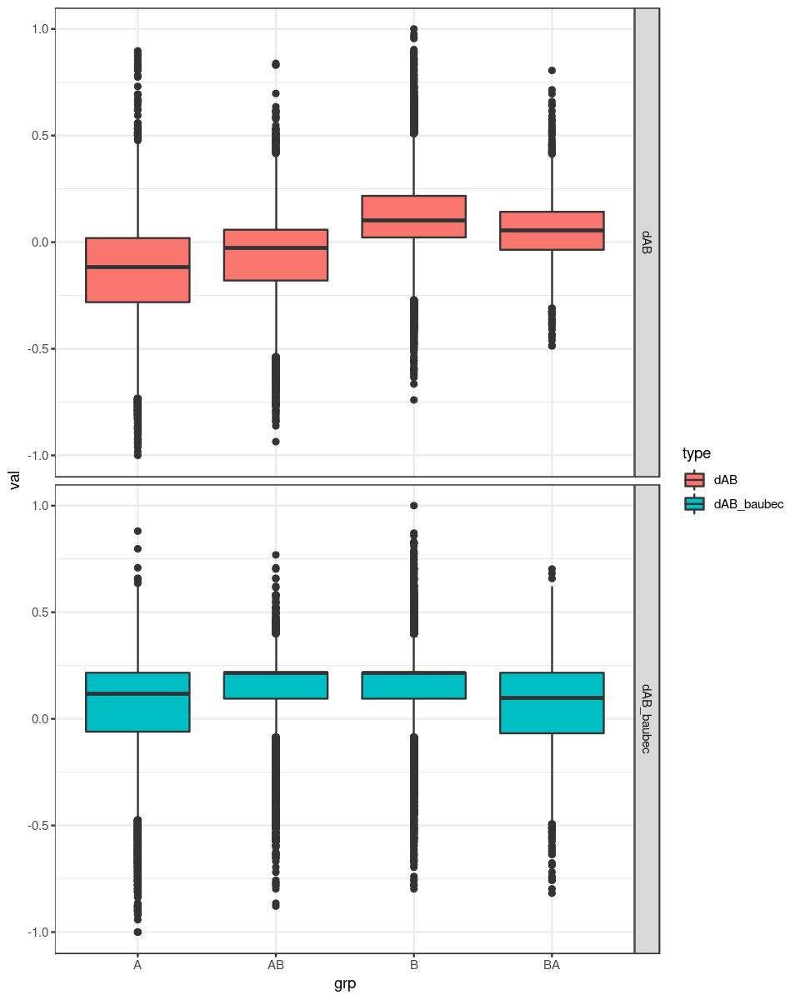

In [219]:
options(repr.plot.width = 8, repr.plot.height=10)
df %>% gather("type", "val", -grp) %>% ggplot(aes(x=grp, y=val, fill=type)) + geom_boxplot() + facet_grid(type~.) + theme_bw()

## Apply both model to Meissner RRBS data

In [300]:
epi6 <- fread(here("output/meissner_epi_cpg_meth_sum.tsv")) %>% 
    mutate(dAB_epi6 = ko3a - ko3b, dA_epi6 = ko3a - wt, dB_epi6 = ko3b - wt) %>% 
    filter(!is.na(dAB_epi6), !is.na(dA_epi6), !is.na(dB_epi6)) %>% 
    select(chrom, start, end, wt, ko3a, ko3b, dAB_epi6, dA_epi6, dB_epi6) %>% 
    as_tibble()

In [301]:
epi6_scores <- gextract.left_join(c("DNMT.ab_score", "DNMT.a_score", "DNMT.b_score", "DNMT.baubec_ab_score", "DNMT.baubec_a_score", "DNMT.baubec_b_score"), intervals=epi6, iterator=epi6, colnames=c("eb_model", "eb_model_a", "eb_model_b", "baubec_model", "baubec_model_a", "baubec_model_b")) %>%
    select(-(chrom1:end1))  %cache_df% 
    here("output/meissner_epi_cpg_meth_scores.tsv") %>% 
    as_tibble()

Using cached dataframe from '/net/mraid14/export/tgdata/users/aviezerl/proj/ebdnmt/output/meissner_epi_cpg_meth_scores.tsv'



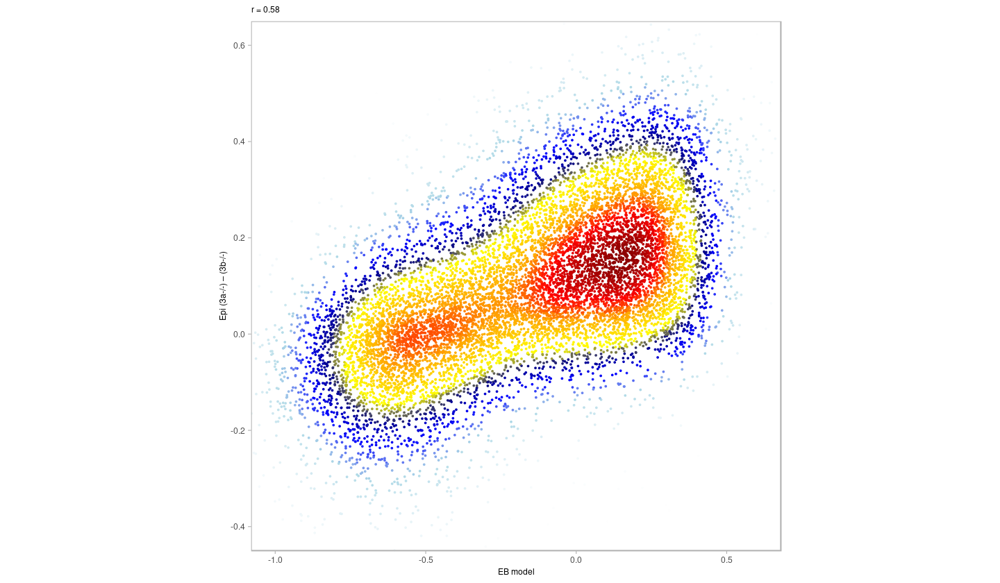

In [302]:
p_epi6_score <- epi6_scores %>% 
    select(eb_model, dAB_epi6) %>%
    mutate(col = densCols(., bandwidth=bandwidth,colramp=colorRampPalette(c("white","lightblue", "blue", "darkblue", "yellow", "gold","orange","red", "darkred" )))) %>% 
    ggplot(aes(x=eb_model, y=dAB_epi6, col=col)) + 
        geom_point(shape=19, size=point_size) + 
        scale_color_identity() + 
        coord_cartesian(xlim = c(-1, 0.6), ylim = c(-0.4, 0.6)) +         
        xlab("EB model") + 
        ylab("Epi (3a-/-) – (3b-/-)") +         
        theme(aspect.ratio=1, panel.grid.major=element_blank(), panel.grid.minor=element_blank()) + 
        labs(subtitle = glue("r = {cor}", cor = round(cor(epi6_scores$dAB_epi6, epi6_scores$eb_model), digits=2)))
p_epi6_score

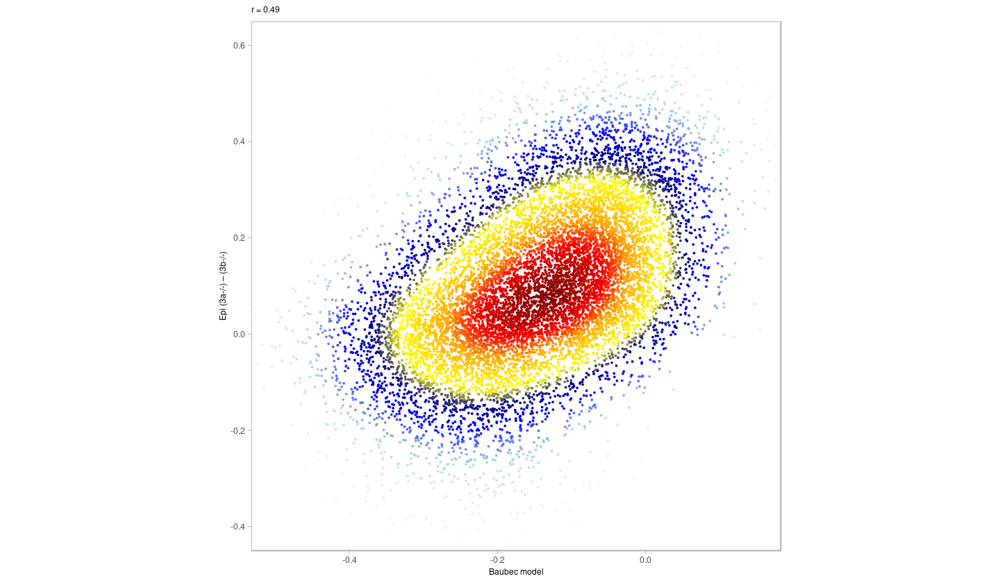

In [303]:
p_epi6_baubec_score <- epi6_scores %>% 
    select(baubec_model, dAB_epi6) %>%
    mutate(col = densCols(., bandwidth=bandwidth,colramp=colorRampPalette(c("white","lightblue", "blue", "darkblue", "yellow", "gold","orange","red", "darkred" )))) %>% 
    ggplot(aes(x=baubec_model, y=dAB_epi6, col=col)) + 
        geom_point(shape=19, size=point_size) + 
        scale_color_identity() + 
        coord_cartesian(xlim = c(-0.5, 0.15), ylim = c(-0.4, 0.6)) +         
        xlab("Baubec model") + 
        ylab("Epi (3a-/-) – (3b-/-)") +         
        theme(aspect.ratio=1, panel.grid.major=element_blank(), panel.grid.minor=element_blank()) + 
        labs(subtitle = glue("r = {cor}", cor = round(cor(epi6_scores$dAB_epi6, epi6_scores$baubec_model), digits=2)))
p_epi6_baubec_score

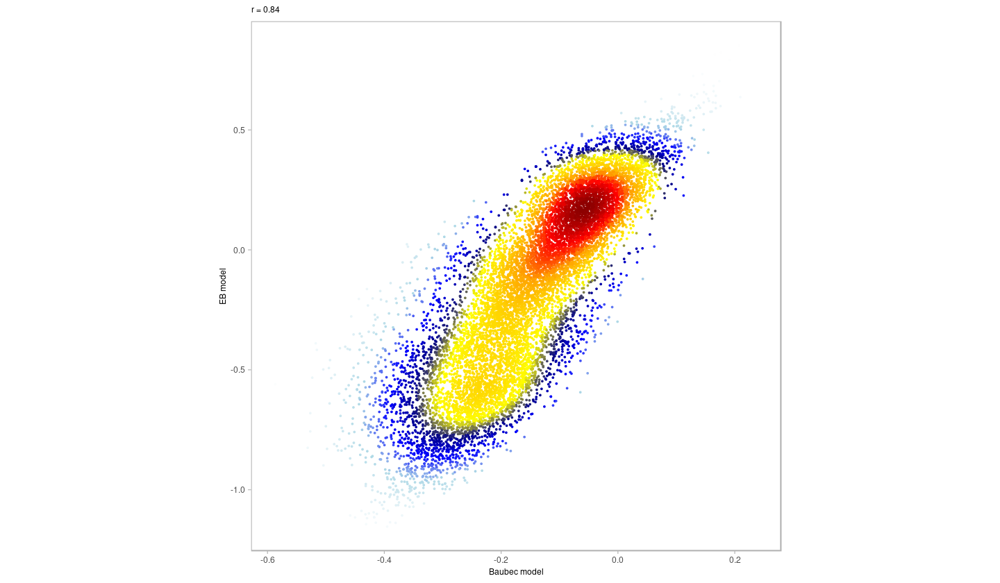

In [304]:
p_epi6_score_comp <- epi6_scores %>% 
    select(baubec_model, eb_model) %>%
    mutate(col = densCols(., bandwidth=bandwidth,colramp=colorRampPalette(c("white","lightblue", "blue", "darkblue", "yellow", "gold","orange","red", "darkred" )))) %>% 
    ggplot(aes(x=baubec_model, y=eb_model, col=col)) + 
        geom_point(shape=19, size=point_size) + 
        scale_color_identity() + 
#         coord_cartesian(xlim = c(-0.5, 0.15), ylim = c(-0.4, 0.6)) +         
        xlab("Baubec model") + 
        ylab("EB model") +         
        theme(aspect.ratio=1, panel.grid.major=element_blank(), panel.grid.minor=element_blank()) + 
        labs(subtitle = glue("r = {cor}", cor = round(cor(epi6_scores$eb_model, epi6_scores$baubec_model), digits=2)))
p_epi6_score_comp

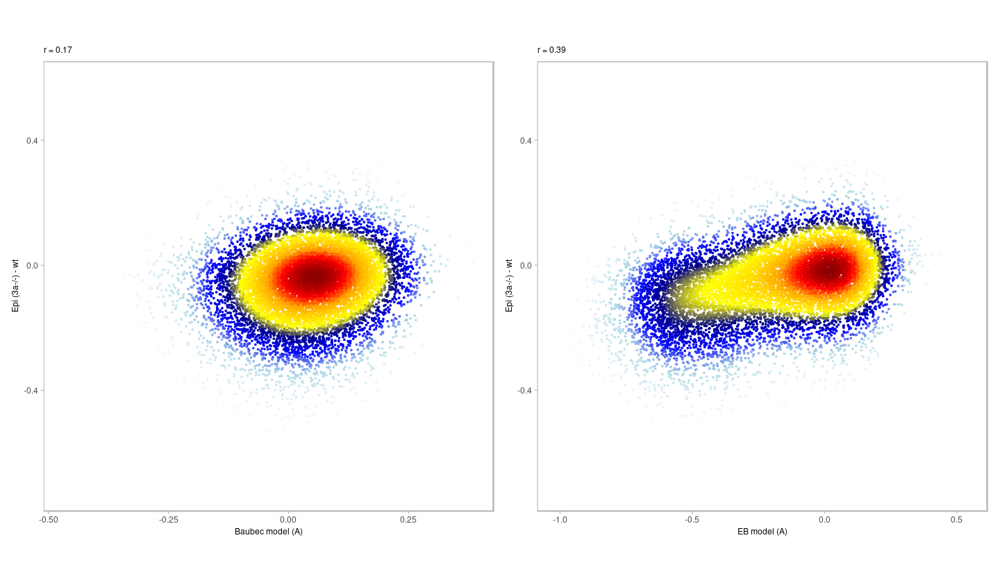

In [332]:
options(repr.plot.height = 7, repr.plot.width = 12)
p_epi6_baubec_score_a <- epi6_scores %>% 
    select(baubec_model_a, dA_epi6) %>%
    mutate(col = densCols(., bandwidth=bandwidth,colramp=colorRampPalette(c("white","lightblue", "blue", "darkblue", "yellow", "gold","orange","red", "darkred" )))) %>% 
    ggplot(aes(x=-baubec_model_a, y=dA_epi6, col=col)) + 
        geom_point(shape=19, size=point_size) + 
        scale_color_identity() + 
#         coord_cartesian(xlim = c(-0.5, 0.15), ylim = c(-0.4, 0.6)) +         
        xlab("Baubec model (A)") + 
        ylab("Epi (3a-/-) - wt") +         
        theme(aspect.ratio=1, panel.grid.major=element_blank(), panel.grid.minor=element_blank()) + 
        labs(subtitle = glue("r = {cor}", cor = round(cor(epi6_scores$dA_epi6, -epi6_scores$baubec_model_a), digits=2)))

p_epi6_eb_score_a <- epi6_scores %>% 
    select(eb_model_a, dA_epi6) %>%
    mutate(col = densCols(., bandwidth=bandwidth,colramp=colorRampPalette(c("white","lightblue", "blue", "darkblue", "yellow", "gold","orange","red", "darkred" )))) %>% 
    ggplot(aes(x=eb_model_a, y=dA_epi6, col=col)) + 
        geom_point(shape=19, size=point_size) + 
        scale_color_identity() + 
#         coord_cartesian(xlim = c(-0.5, 0.15), ylim = c(-0.4, 0.6)) +         
        xlab("EB model (A)") + 
        ylab("Epi (3a-/-) - wt") +         
        theme(aspect.ratio=1, panel.grid.major=element_blank(), panel.grid.minor=element_blank()) + 
        labs(subtitle = glue("r = {cor}", cor = round(cor(epi6_scores$dA_epi6, epi6_scores$eb_model_a), digits=2)))

p_epi6_baubec_score_a + p_epi6_eb_score_a

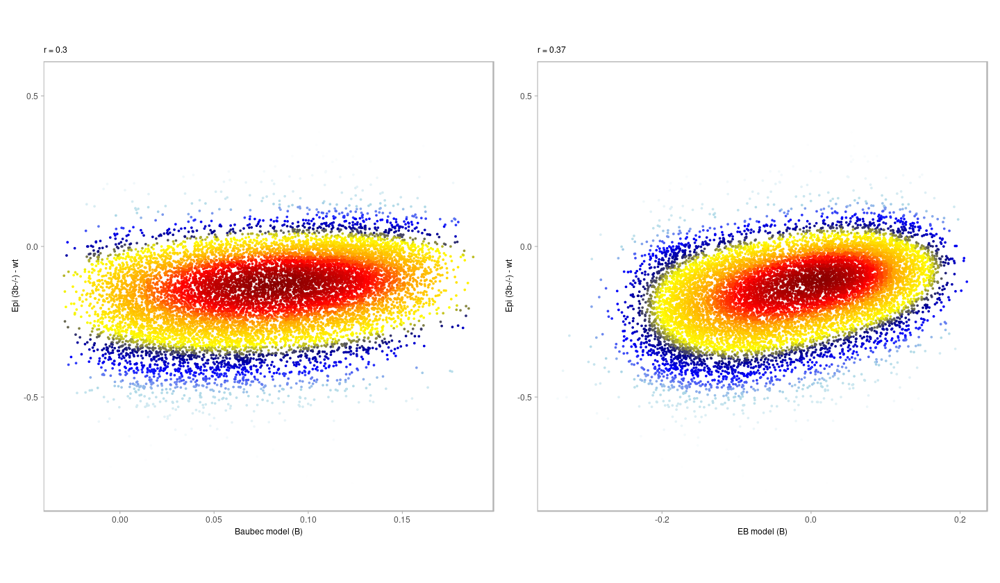

In [333]:
options(repr.plot.height = 7, repr.plot.width = 12)
p_epi6_baubec_score_b <- epi6_scores %>% 
    select(baubec_model_b, dB_epi6) %>%
    mutate(col = densCols(., bandwidth=bandwidth,colramp=colorRampPalette(c("white","lightblue", "blue", "darkblue", "yellow", "gold","orange","red", "darkred" )))) %>% 
    ggplot(aes(x=-baubec_model_b, y=dB_epi6, col=col)) + 
        geom_point(shape=19, size=point_size) + 
        scale_color_identity() + 
#         coord_cartesian(xlim = c(-0.5, 0.15), ylim = c(-0.4, 0.6)) +         
        xlab("Baubec model (B)") + 
        ylab("Epi (3b-/-) - wt") +         
        theme(aspect.ratio=1, panel.grid.major=element_blank(), panel.grid.minor=element_blank()) + 
        labs(subtitle = glue("r = {cor}", cor = round(cor(epi6_scores$dB_epi6, -epi6_scores$baubec_model_b), digits=2)))

p_epi6_eb_score_b <- epi6_scores %>% 
    select(eb_model_b, dB_epi6) %>%
    mutate(col = densCols(., bandwidth=bandwidth,colramp=colorRampPalette(c("white","lightblue", "blue", "darkblue", "yellow", "gold","orange","red", "darkred" )))) %>% 
    ggplot(aes(x=eb_model_b, y=dB_epi6, col=col)) + 
        geom_point(shape=19, size=point_size) + 
        scale_color_identity() + 
#         coord_cartesian(xlim = c(-0.5, 0.15), ylim = c(-0.4, 0.6)) +         
        xlab("EB model (B)") + 
        ylab("Epi (3b-/-) - wt") +         
        theme(aspect.ratio=1, panel.grid.major=element_blank(), panel.grid.minor=element_blank()) + 
        labs(subtitle = glue("r = {cor}", cor = round(cor(epi6_scores$dB_epi6, epi6_scores$eb_model_b), digits=2)))

p_epi6_baubec_score_b + p_epi6_eb_score_b

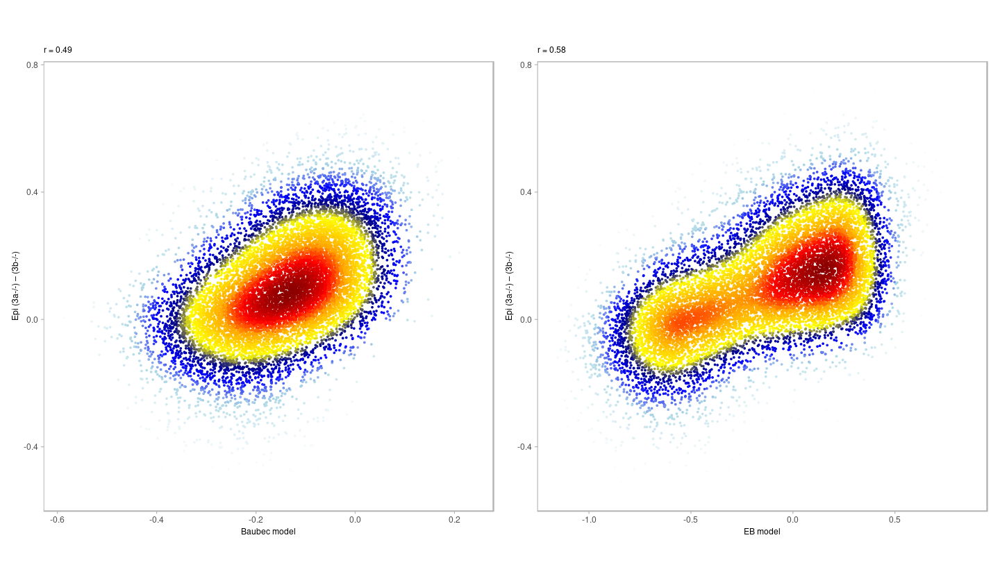

In [310]:
options(repr.plot.height = 7, repr.plot.width = 12)
p_epi6_baubec_score_ab <- epi6_scores %>% 
    select(baubec_model, dAB_epi6) %>%
    mutate(col = densCols(., bandwidth=bandwidth,colramp=colorRampPalette(c("white","lightblue", "blue", "darkblue", "yellow", "gold","orange","red", "darkred" )))) %>% 
    ggplot(aes(x=baubec_model, y=dAB_epi6, col=col)) + 
        geom_point(shape=19, size=point_size) + 
        scale_color_identity() +         
        xlab("Baubec model") + 
        ylab("Epi (3a-/-) – (3b-/-)") +         
        theme(aspect.ratio=1, panel.grid.major=element_blank(), panel.grid.minor=element_blank()) + 
        labs(subtitle = glue("r = {cor}", cor = round(cor(epi6_scores$dAB_epi6, epi6_scores$baubec_model), digits=2)))

p_epi6_eb_score_ab <- epi6_scores %>% 
    select(eb_model, dAB_epi6) %>%
    mutate(col = densCols(., bandwidth=bandwidth,colramp=colorRampPalette(c("white","lightblue", "blue", "darkblue", "yellow", "gold","orange","red", "darkred" )))) %>% 
    ggplot(aes(x=eb_model, y=dAB_epi6, col=col)) + 
        geom_point(shape=19, size=point_size) + 
        scale_color_identity() +            
        xlab("EB model") + 
        ylab("Epi (3a-/-) – (3b-/-)") +         
        theme(aspect.ratio=1, panel.grid.major=element_blank(), panel.grid.minor=element_blank()) + 
        labs(subtitle = glue("r = {cor}", cor = round(cor(epi6_scores$dAB_epi6, epi6_scores$eb_model), digits=2)))

p_epi6_baubec_score_ab + p_epi6_eb_score_ab

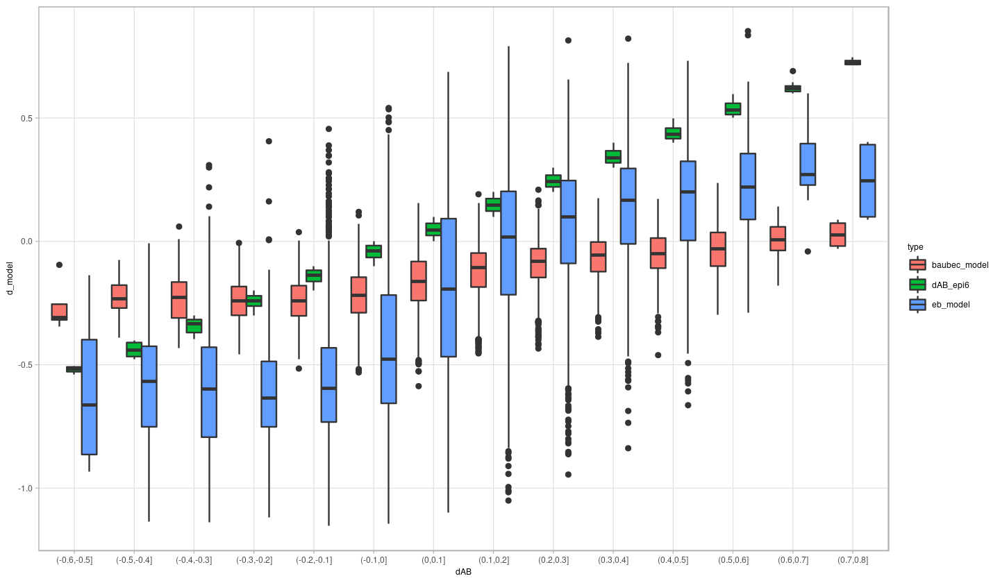

In [311]:
options(repr.plot.width = 7, repr.plot.width = 12)
epi6_scores %>%
        mutate(dAB = cut(dAB_epi6, seq(-1,1,0.1), include.lowest = TRUE)) %>%
        group_by(dAB) %>%
        select(chrom:end, dAB, dAB_epi6, eb_model, baubec_model) %>%
        gather("type", "d_model", -(chrom:end), -dAB) %>%
        ggplot(aes(x=dAB, y=d_model, fill=type)) +
            geom_boxplot(position="dodge")

normalize eb trend to es trend: 

In [312]:
model <- lm(baubec_model~ eb_model, data = epi6_scores )
epi6_norm <- epi6_scores %>%
            mutate(
                d = eb_model - baubec_model, 
                eb_norm = model$coefficients[1] + model$coefficients[2]*eb_model, 
                delta_norm = baubec_model - eb_norm)

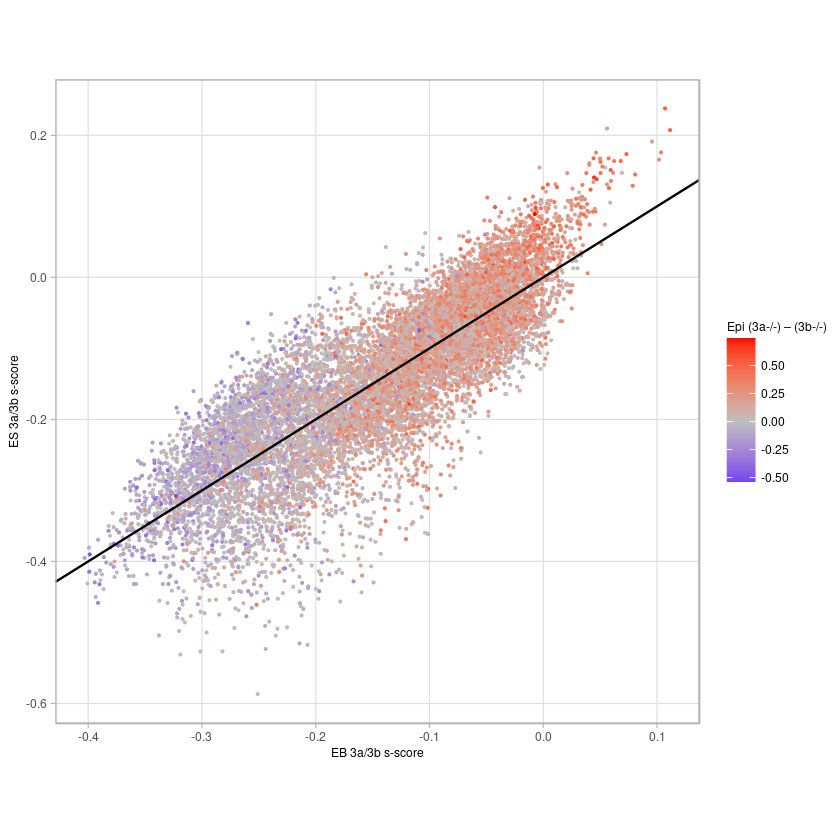

In [313]:
options(repr.plot.width=7, repr.plot.height=7)
p_eb_es_modle_scat <- epi6_norm %>%
        ggplot(aes(x=eb_norm, y=baubec_model, color=dAB_epi6)) +
            geom_point(size=0.1) +
            geom_abline() +
            xlab("EB 3a/3b s-score") + 
            ylab("ES 3a/3b s-score") + 
            scale_color_gradient2(name = "Epi (3a-/-) – (3b-/-)", low="blue", high="red", midpoint = 0, mid = "gray") + 
            theme(aspect.ratio=1)

p_eb_es_modle_scat

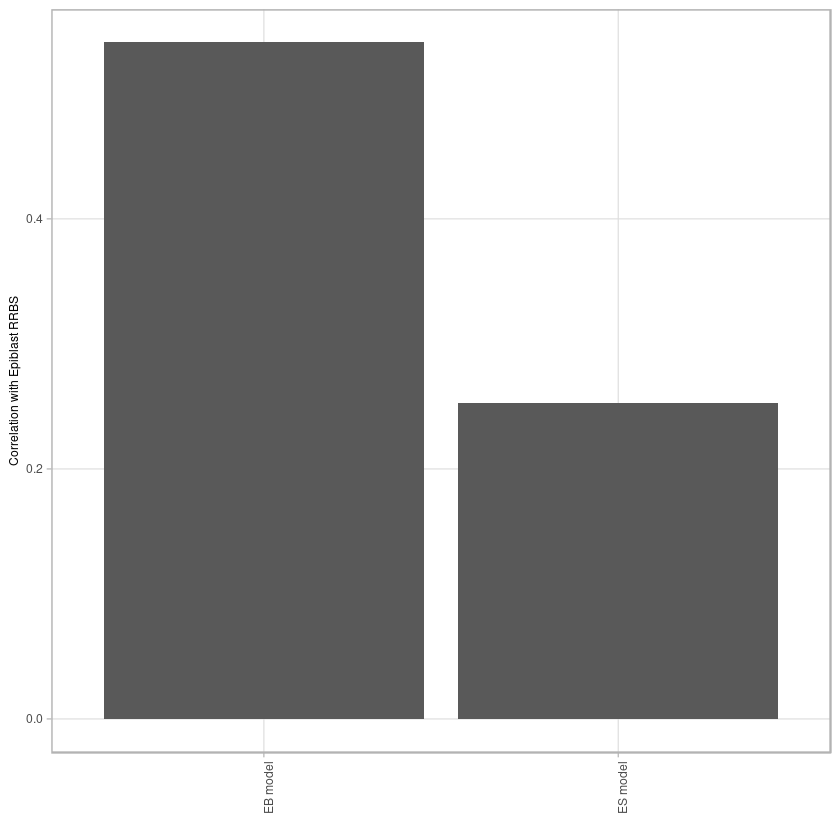

In [314]:
p_eb_es_modle_cor_barplot <- epi6_norm %>%
        filter(abs(delta_norm) >= 0.1) %>%
        summarise(`EB model` = cor(eb_model, dAB_epi6), `ES model` = cor(baubec_model, dAB_epi6)) %>% 
        gather("type", "cor") %>% 
        ggplot(aes(x=type, y=cor)) + 
            geom_col() + 
            xlab("") + 
            ylab("Correlation with Epiblast RRBS") + 
            vertical_labs()

p_eb_es_modle_cor_barplot

Do the same for A score

In [324]:
model <- lm(-baubec_model_a ~ eb_model_a, data = epi6_scores )
epi6_norm_a <- epi6_scores %>%
            mutate(
                baubec_model_a = -baubec_model_a,
                d = eb_model_a - baubec_model_a, 
                eb_norm = model$coefficients[1] + model$coefficients[2]*eb_model_a, 
                delta_norm = baubec_model_a - eb_norm)

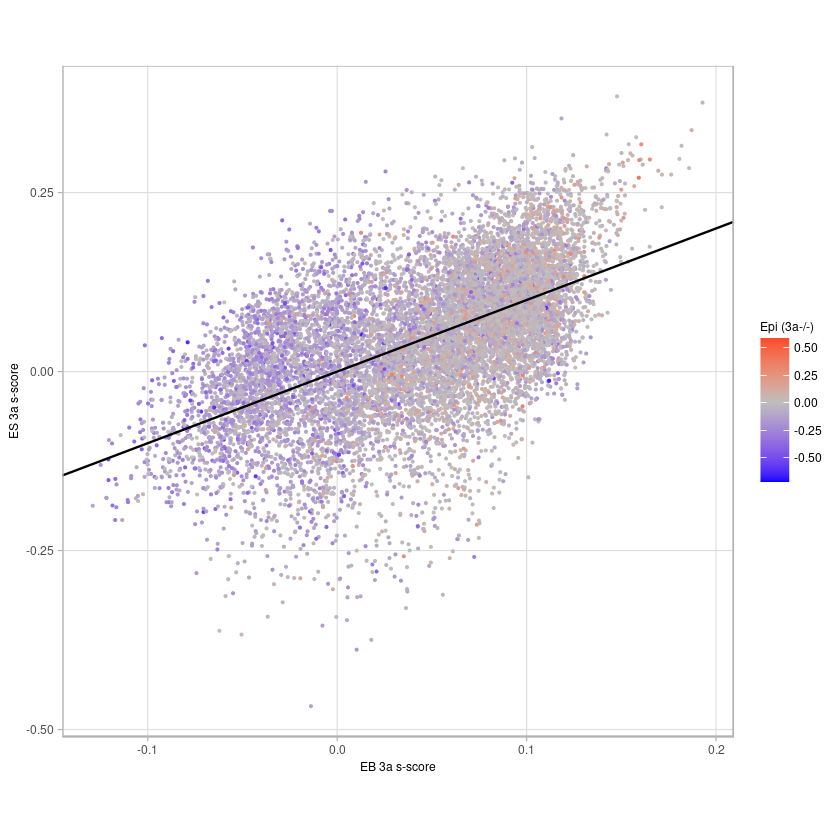

In [325]:
options(repr.plot.width=7, repr.plot.height=7)
p_eb_es_modle_scat_a <- epi6_norm_a %>%
        ggplot(aes(x=eb_norm, y=baubec_model_a, color=dA_epi6)) +
            geom_point(size=0.1) +
            geom_abline(slope=1) +
            xlab("EB 3a s-score") + 
            ylab("ES 3a s-score") + 
            scale_color_gradient2(name = "Epi (3a-/-)", low="blue", high="red", midpoint = 0, mid = "gray") + 
            theme(aspect.ratio=1)

p_eb_es_modle_scat_a

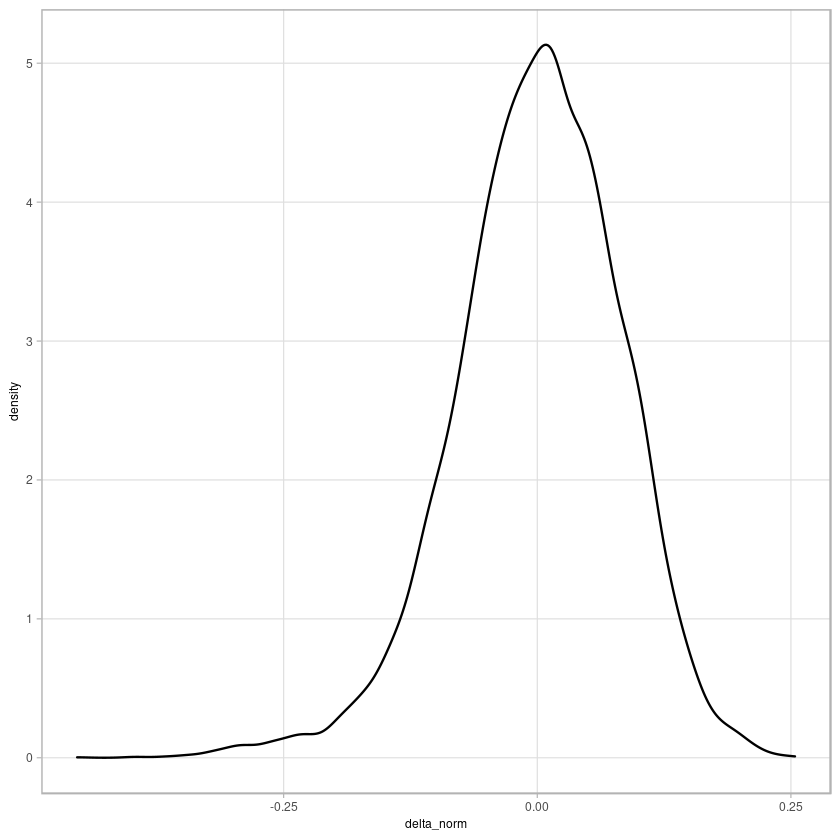

In [326]:
epi6_norm_a %>% 
    ggplot(aes(x=delta_norm)) + 
        geom_density()

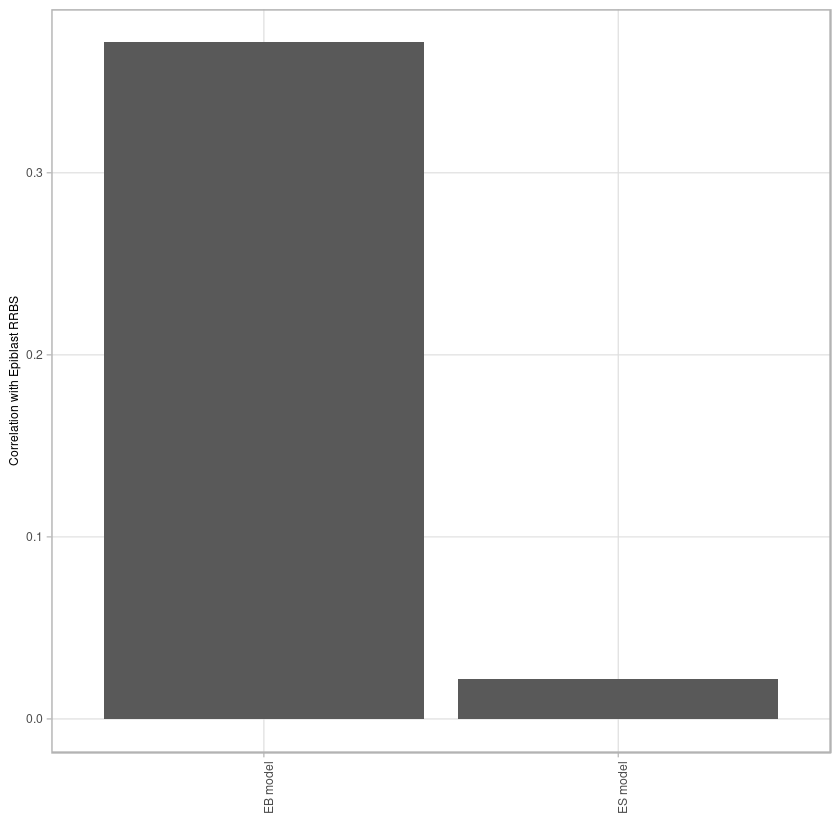

In [327]:
p_eb_es_modle_cor_barplot_a <- epi6_norm_a %>%
        filter(abs(delta_norm) >= 0.1) %>%
        summarise(`EB model` = cor(eb_model_a, dA_epi6), `ES model` = cor(baubec_model_a, dA_epi6)) %>% 
        gather("type", "cor") %>% 
        ggplot(aes(x=type, y=cor)) + 
            geom_col() + 
            xlab("") + 
            ylab("Correlation with Epiblast RRBS") + 
            vertical_labs()

p_eb_es_modle_cor_barplot_a

Do the same for B score

In [328]:
model <- lm(-baubec_model_b ~ eb_model_b, data = epi6_scores )
epi6_norm_b <- epi6_scores %>%
            mutate(
                baubec_model_b = -baubec_model_b,
                d = eb_model_b - baubec_model_b, 
                eb_norm = model$coefficients[1] + model$coefficients[2]*eb_model_b, 
                delta_norm = baubec_model_b - eb_norm)

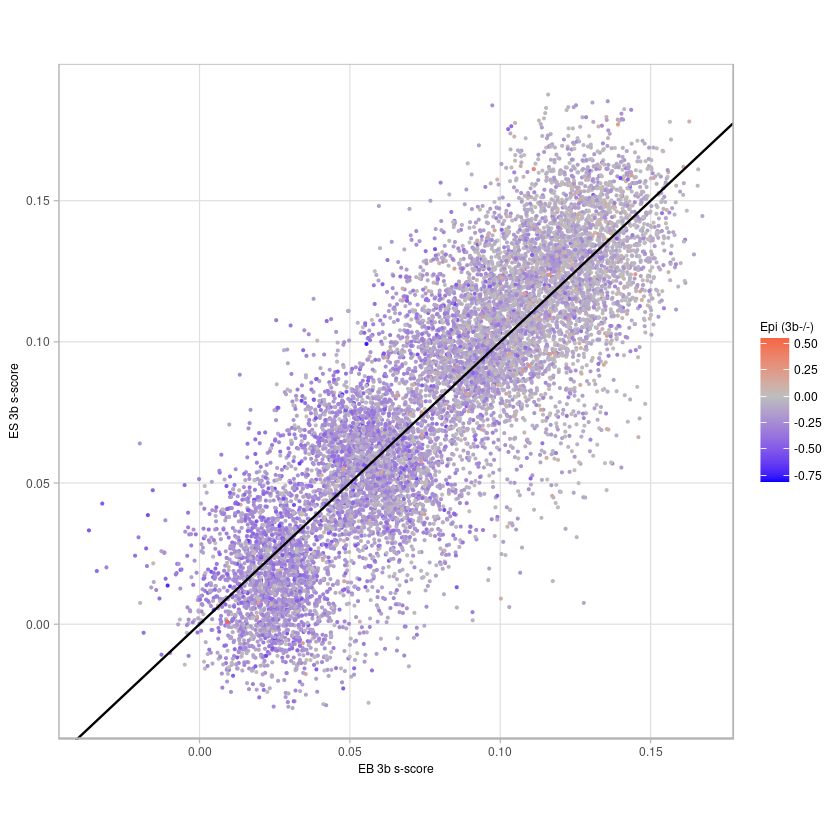

In [329]:
options(repr.plot.width=7, repr.plot.height=7)
p_eb_es_modle_scat_b <- epi6_norm_b %>%
        ggplot(aes(x=eb_norm, y=baubec_model_b, color=dB_epi6)) +
            geom_point(size=0.1) +
            geom_abline(slope=1) +
            xlab("EB 3b s-score") + 
            ylab("ES 3b s-score") + 
            scale_color_gradient2(name = "Epi (3b-/-)", low="blue", high="red", midpoint = 0, mid = "gray") + 
            theme(aspect.ratio=1)

p_eb_es_modle_scat_b

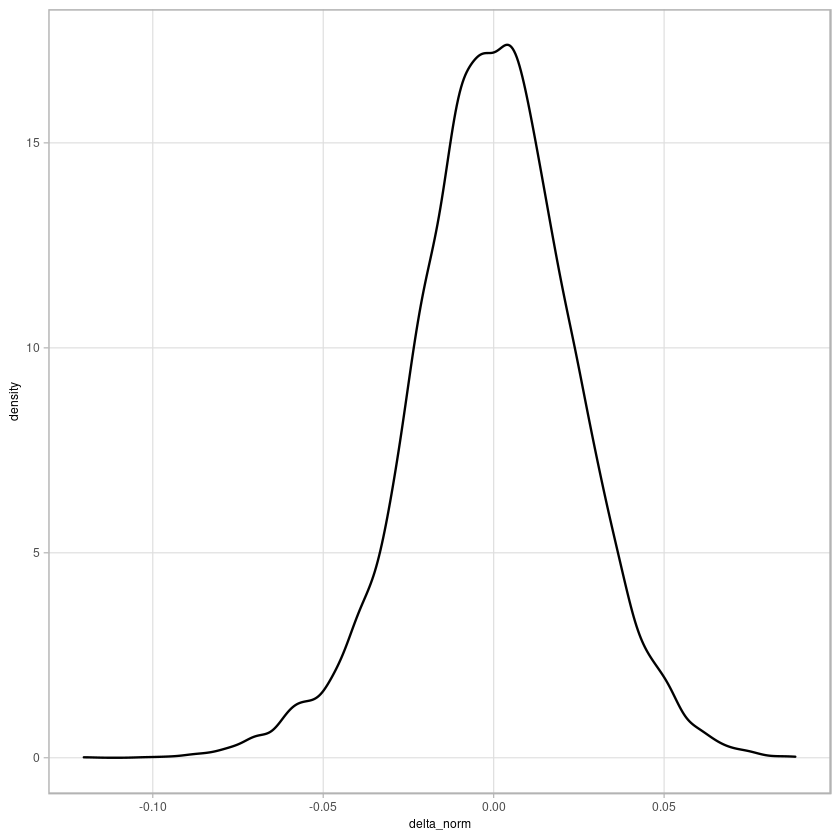

In [330]:
epi6_norm_b %>% 
    ggplot(aes(x=delta_norm)) + 
        geom_density()

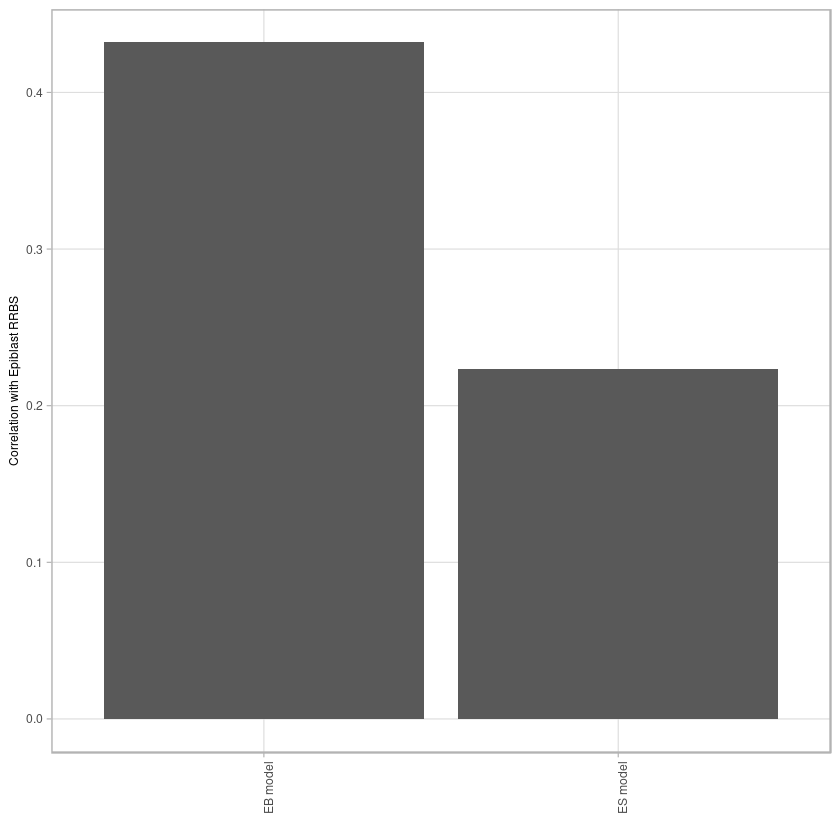

In [331]:
p_eb_es_modle_cor_barplot_b <- epi6_norm_b %>%
        filter(abs(delta_norm) >= 0.05) %>%
        summarise(`EB model` = cor(eb_model_b, dB_epi6), `ES model` = cor(baubec_model_a, dB_epi6)) %>% 
        gather("type", "cor") %>% 
        ggplot(aes(x=type, y=cor)) + 
            geom_col() + 
            xlab("") + 
            ylab("Correlation with Epiblast RRBS") + 
            vertical_labs()

p_eb_es_modle_cor_barplot_b